# Exploratory Data Analysis

In this notebook, we perform exploratory data analysis (EDA) to gain insights into our dataset. Our goal is to guide model selection, optimize algorithm performance, and determine whether we can improve efficiency—such as by reducing the input text length (e.g., using only the introduction and conclusion) while maintaining classification accuracy. We also analyze term importance using TF-IDF and similarity metrics to explore rule-based or hybrid approaches.

## Importing all Required Libraries

In [5]:
import ast
import joblib
import math
import os
import random
import re
import time

import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import nltk
import numpy as np
import pandas as pd
import seaborn as sns
import spacy

from collections import Counter, defaultdict
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTE, RandomOverSampler
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_selection import RFE, mutual_info_classif
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    precision_score,
)
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV,
    StratifiedKFold,
    cross_val_score,
    train_test_split,
)
from sklearn.tree import DecisionTreeClassifier
from transformers import AutoTokenizer
from wordcloud import WordCloud

## **Load and Combine Data by Topic**

In [4]:
import os
from collections import defaultdict
import pandas as pd
# Path to main data folder
main_directory = "Cleaned_Data_v2"

# Dictionary to store text grouped by main topics
data = defaultdict(list)

# Traverse the folder structure
for main_topic in os.listdir(main_directory):
    main_topic_path = os.path.join(main_directory, main_topic)
    if os.path.isdir(main_topic_path):  # Ensure it's a directory
        for root, _, files in os.walk(main_topic_path):  # Walk through all subfolders
            for file in files:
                if file.endswith(".txt"):  # Only process .txt files
                    file_path = os.path.join(root, file)
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                        data[main_topic].append(content)

# Combine all text files under each main topic into a single string
combined_texts = {topic: " ".join(contents) for topic, contents in data.items()}


### Load and Combine Data by Topic and Subtopic

In [69]:
import os
from collections import defaultdict
import pandas as pd

# Path to main data folder
main_directory = "Cleaned_Data_v2"

# Dictionary to store text grouped by main topics and subtopics
data = defaultdict(lambda: defaultdict(list))

# Traverse the folder structure
for main_topic in os.listdir(main_directory):
    main_topic_path = os.path.join(main_directory, main_topic)
    if os.path.isdir(main_topic_path):  # Ensure it's a directory
        for subtopic in os.listdir(main_topic_path):  # Check subfolders inside main topic
            subtopic_path = os.path.join(main_topic_path, subtopic)
            
            # If it's a subfolder, read its files
            if os.path.isdir(subtopic_path):  
                for root, _, files in os.walk(subtopic_path):  
                    for file in files:
                        if file.endswith(".txt"):  
                            file_path = os.path.join(root, file)
                            with open(file_path, "r", encoding="utf-8") as f:
                                content = f.read()
                                data[main_topic][subtopic].append(content)
            else:  
                # If no subtopics exist, treat as a direct main topic file
                if subtopic.endswith(".txt"):
                    file_path = os.path.join(main_topic_path, subtopic)
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                        data[main_topic]["_NO_SUBTOPIC"].append(content)  # Mark as no subtopic

# Combine all text files under each main topic/subtopic into a single string
combined_texts = {
    (main_topic if subtopic == "_NO_SUBTOPIC" else f"{main_topic} - {subtopic}"): " ".join(contents)
    for main_topic, subtopics in data.items()
    for subtopic, contents in subtopics.items()
}



## **Generate Unigrams, Bigrams, Trigrams for each topic**

In [19]:
from sklearn.feature_extraction.text import CountVectorizer

# Function to generate n-grams
def generate_ngrams(corpus, ngram_range=(1, 1), top_n=20):
    vectorizer = CountVectorizer(ngram_range=ngram_range)
    ngram_matrix = vectorizer.fit_transform([corpus])
    ngram_counts = ngram_matrix.toarray().sum(axis=0)
    ngram_features = vectorizer.get_feature_names_out()

    # Create a DataFrame of n-grams and their counts
    ngram_df = pd.DataFrame({"N-gram": ngram_features, "Count": ngram_counts})
    ngram_df = ngram_df.sort_values(by="Count", ascending=False).head(top_n)
    return ngram_df

# Generate n-grams for each topic
ngram_results = {}
for topic, text in combined_texts.items():
    print(f"\nTopic: {topic}")
    print("Unigrams:")
    print(generate_ngrams(text, ngram_range=(1, 1)))
    print("\nBigrams:")
    print(generate_ngrams(text, ngram_range=(2, 2)))
    print("\nTrigrams:")
    print(generate_ngrams(text, ngram_range=(3, 3)))



Topic: Marketing and Public Communication
Unigrams:
               N-gram  Count
78                 ai    100
1446          loyalty    100
1489        marketing     82
493           content     81
438         companies     79
588              data     78
576         customers     76
574          customer     75
1877         programs     71
1763  personalization     63
1055            genai     58
544          creative     53
2586              use     52
1766     personalized     47
285            boston     42
490         consumers     41
487        consulting     41
1876          program     41
24             across     40
1370          leaders     40

Bigrams:
                       N-gram  Count
861         boston consulting     38
1459         consulting group     38
4320         loyalty programs     33
4319          loyalty program     29
4405        managing director     21
6481              see exhibit     18
5386         personalized ers     17
4502  marketing organizations   

In [20]:
# Save n-gram results for each topic
for topic, text in combined_texts.items():
    for n, ngram_range in [(1, (1, 1)), (2, (2, 2)), (3, (3, 3))]:
        ngram_df = generate_ngrams(text, ngram_range=ngram_range)
        ngram_df.to_csv(f"{topic}_ngrams_{n}.csv", index=False)


## **Generate Bar Charts for N-grams**

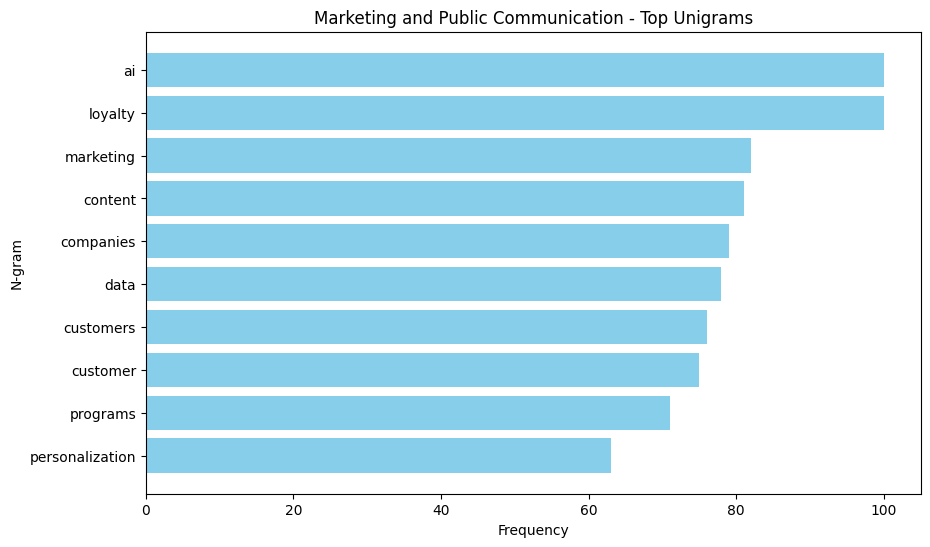

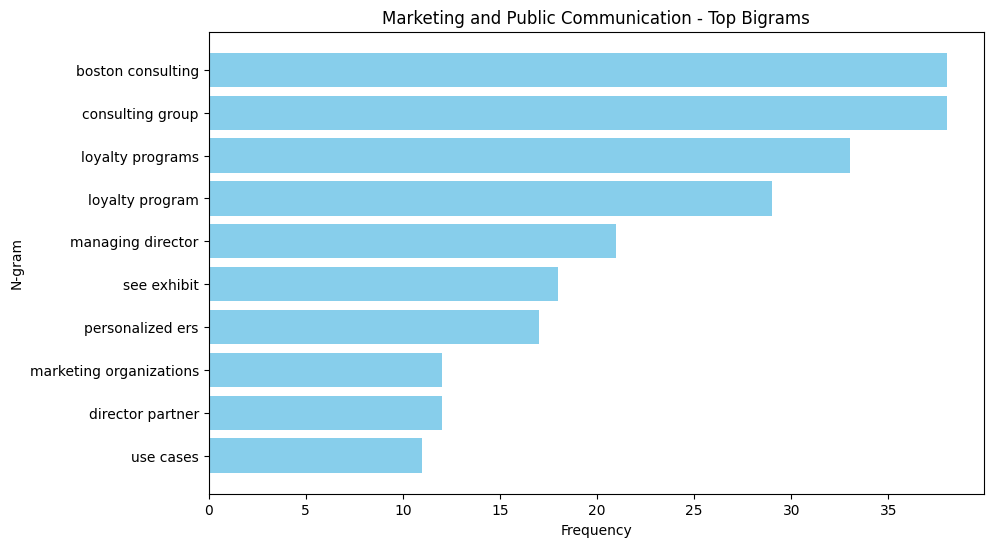

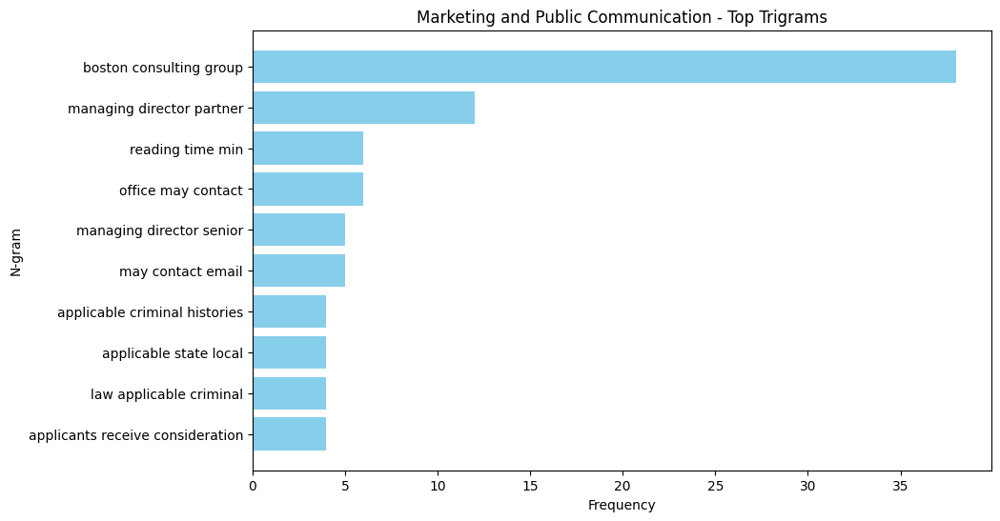

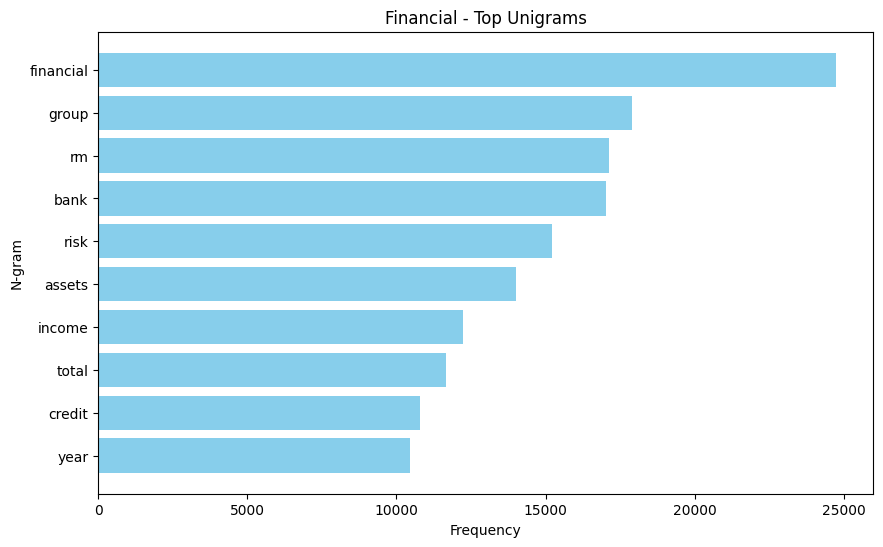

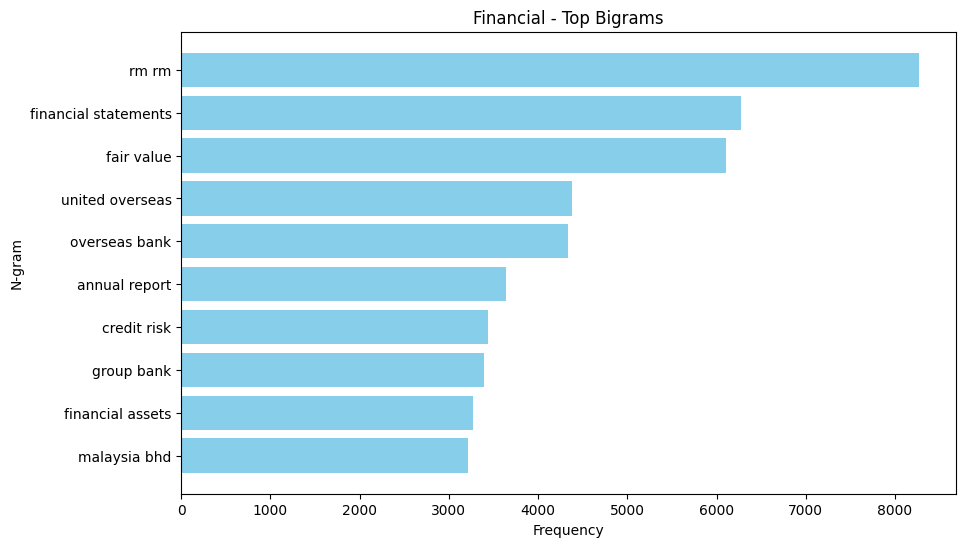

...

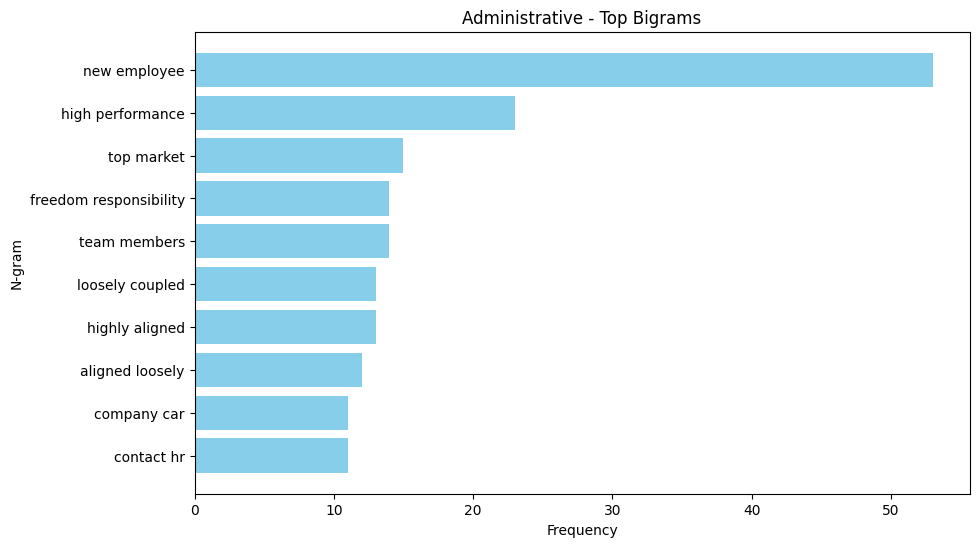

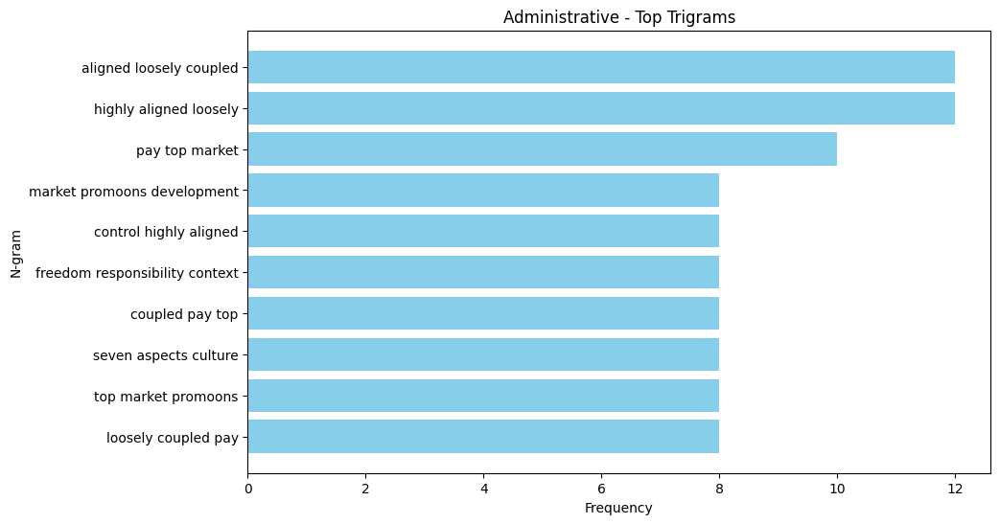

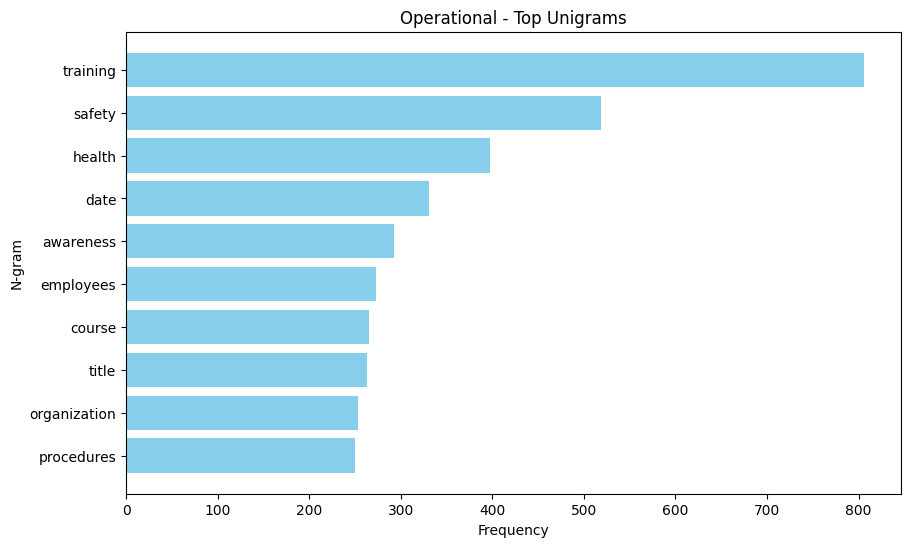

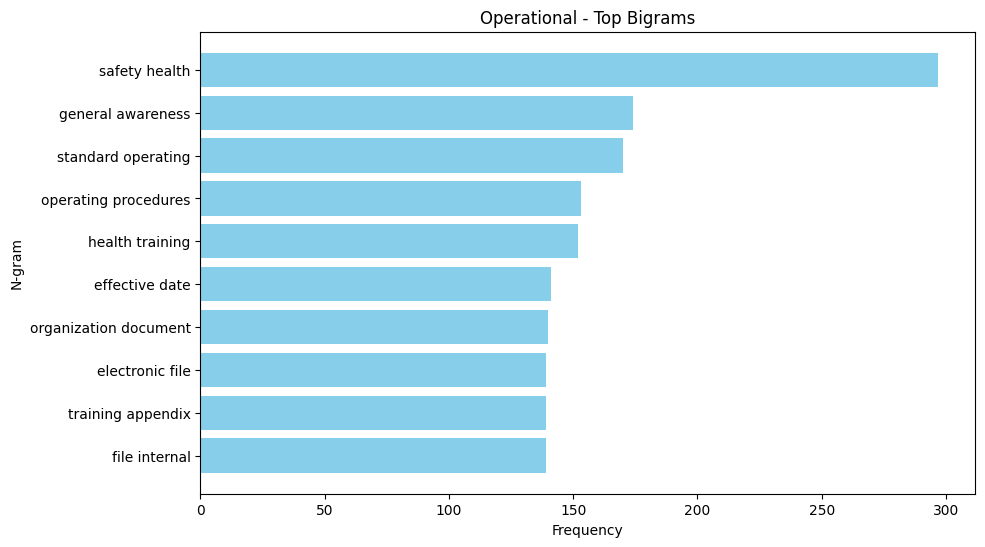

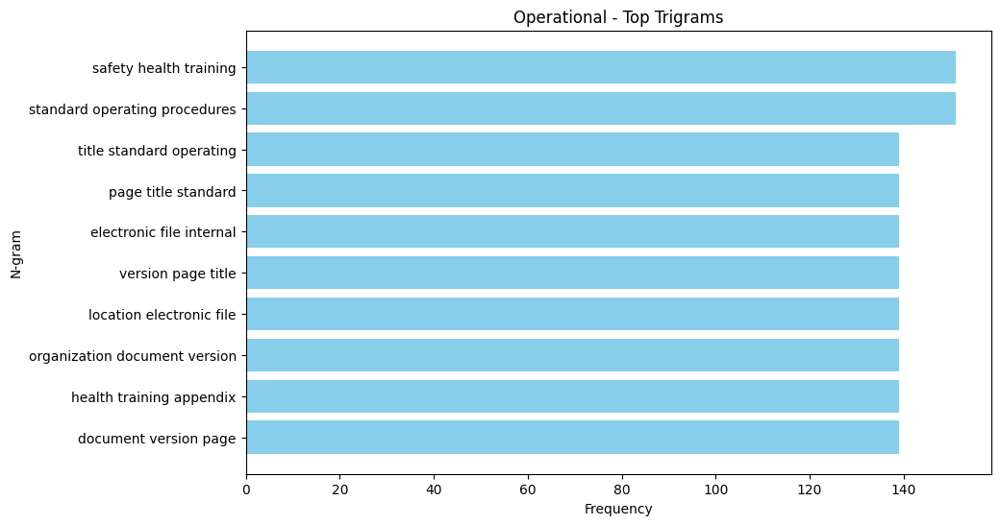

In [21]:
import matplotlib.pyplot as plt

# Function to generate bar charts for n-grams
def plot_ngrams(ngram_df, title, top_n=10):
    plt.figure(figsize=(10, 6))
    plt.barh(ngram_df['N-gram'][:top_n], ngram_df['Count'][:top_n], color='skyblue')
    plt.xlabel('Frequency')
    plt.ylabel('N-gram')
    plt.title(title)
    plt.gca().invert_yaxis()  # Invert y-axis to have the highest count on top
    plt.show()

# Generate and plot n-grams for each topic
for topic, text in combined_texts.items():
    for n, ngram_range, title_suffix in [(1, (1, 1), "Unigrams"), (2, (2, 2), "Bigrams"), (3, (3, 3), "Trigrams")]:
        ngram_df = generate_ngrams(text, ngram_range=ngram_range, top_n=10)
        plot_ngrams(ngram_df, title=f"{topic} - Top {title_suffix}")


## **Generate Wordclouds**

## Aggregated Word Cloud

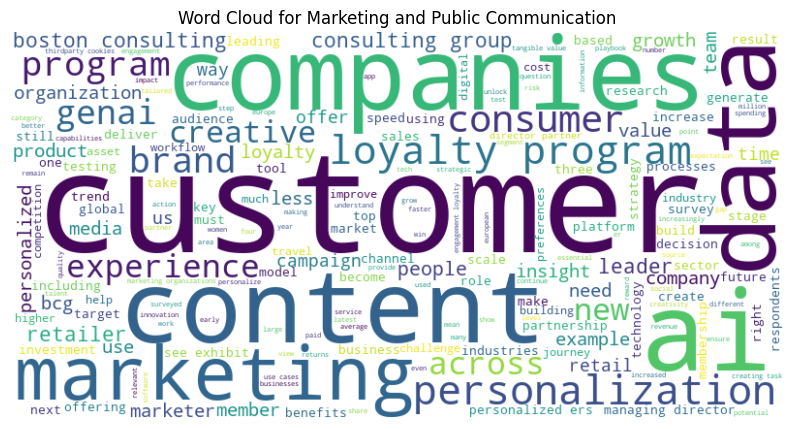

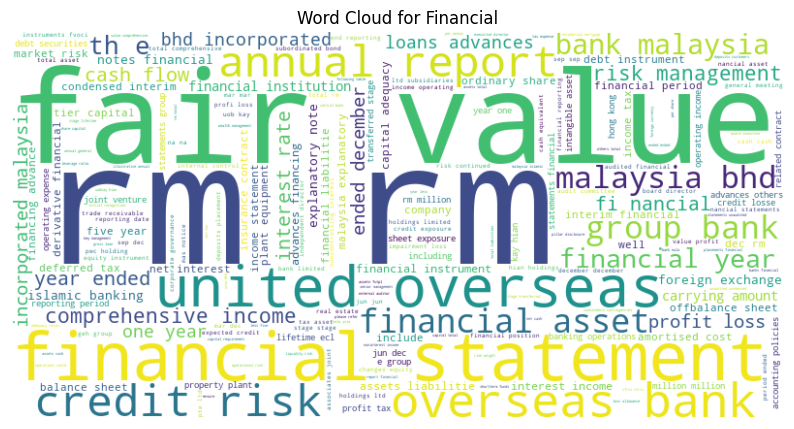

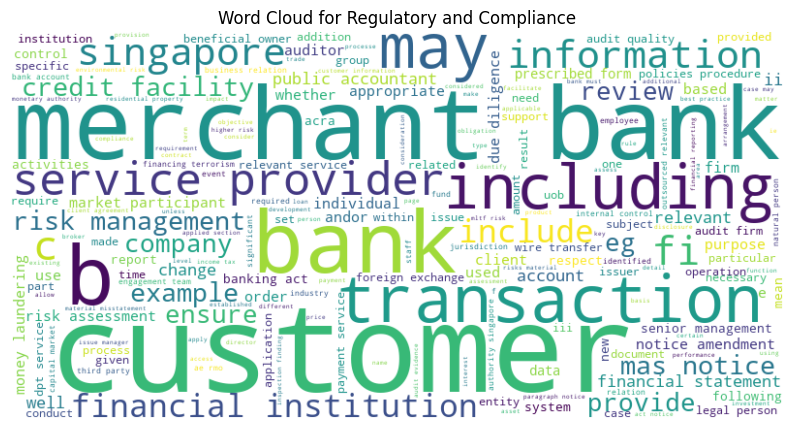

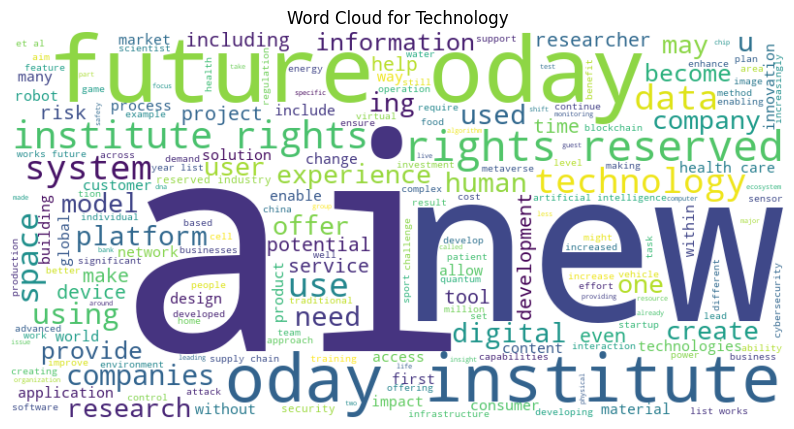

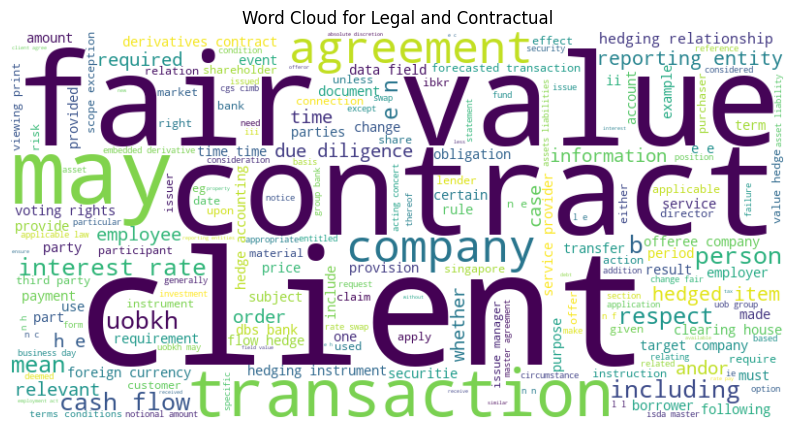

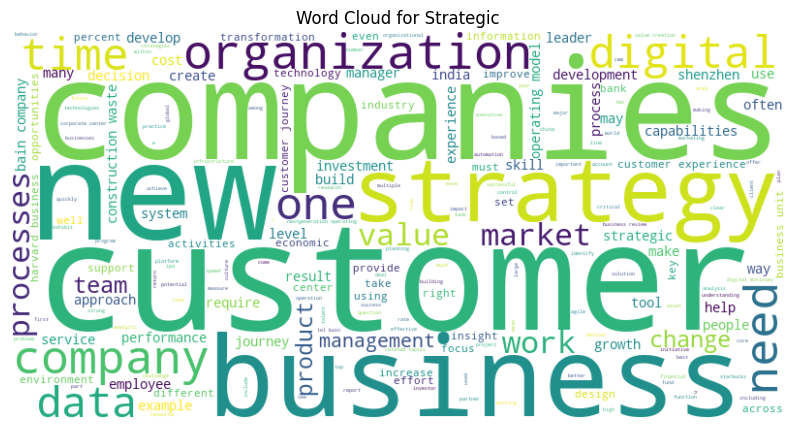

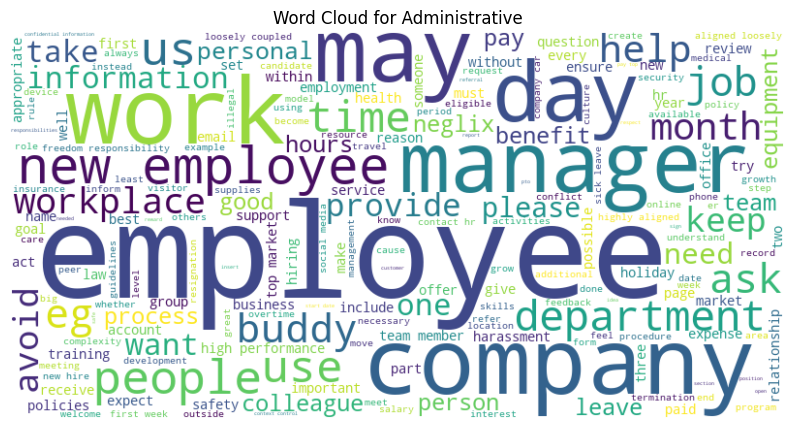

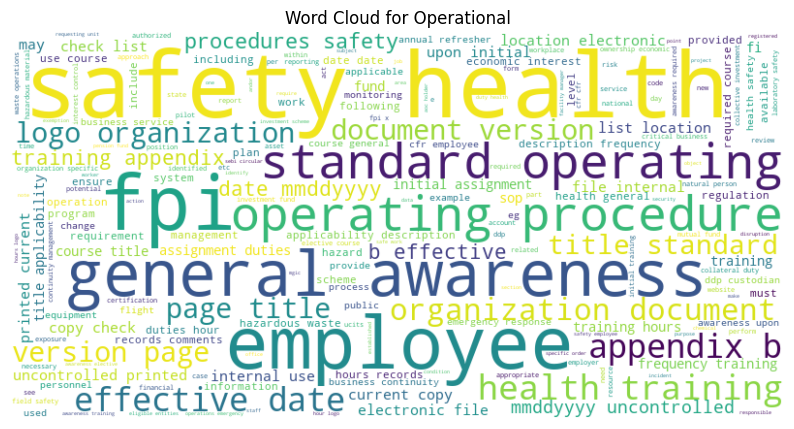

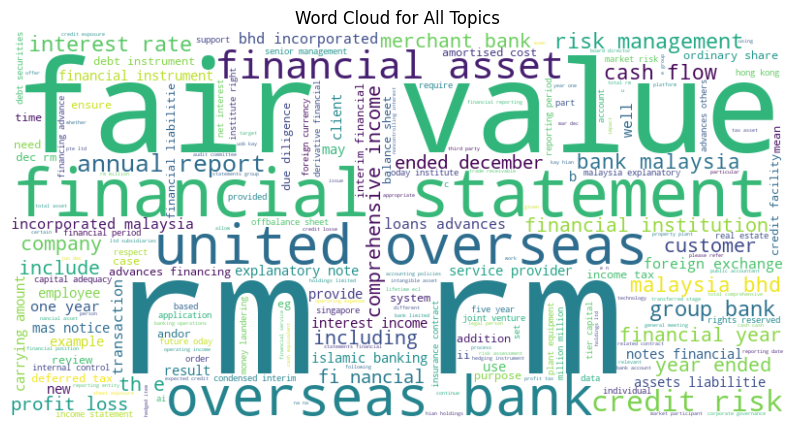

In [23]:

def plot_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

# Plot word cloud for each topic
for topic, text in combined_texts.items():
    plot_wordcloud(text, title=f"Word Cloud for {topic}")

# Combine all texts into a single string
all_texts = " ".join(combined_texts.values())

# Plot word cloud for all combined texts
plot_wordcloud(all_texts, title="Word Cloud for All Topics")

## **Generate Document-length distribution for each topic**

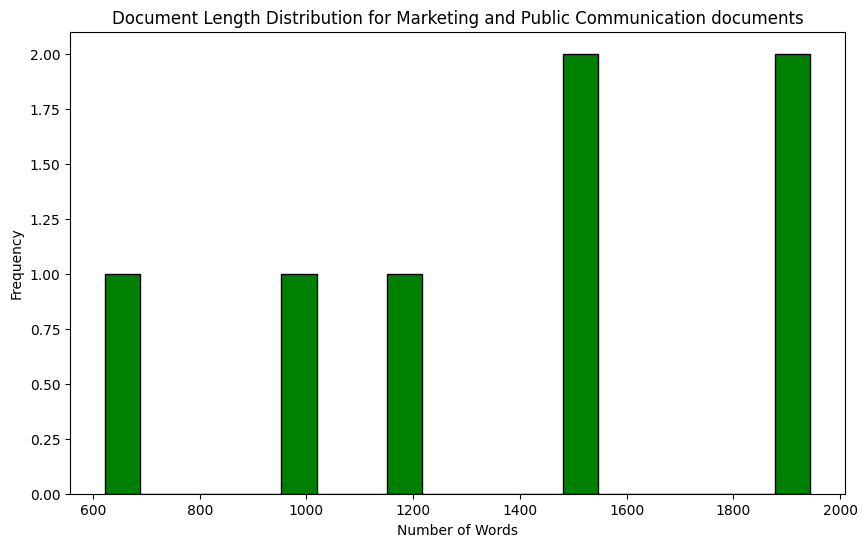

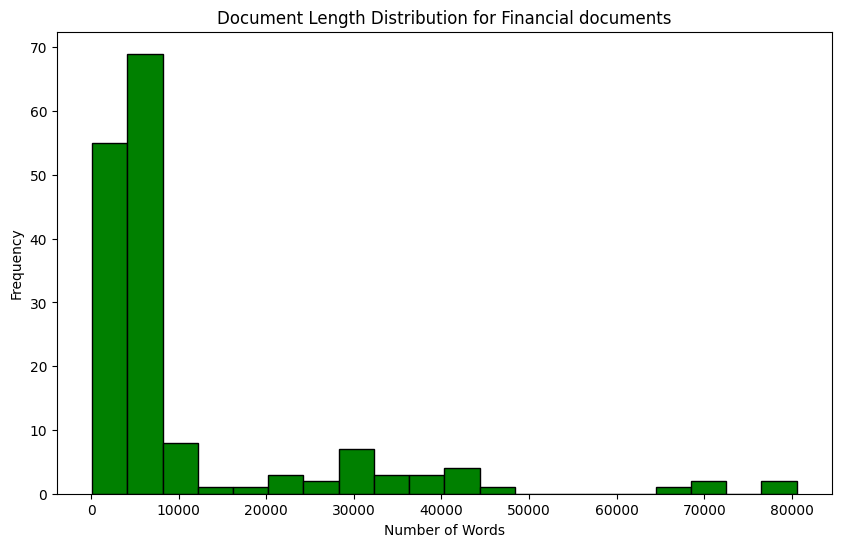

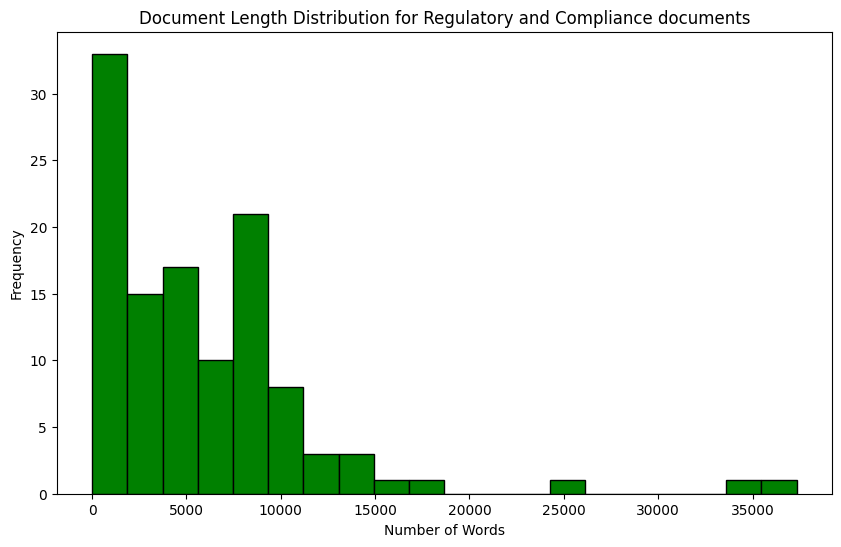

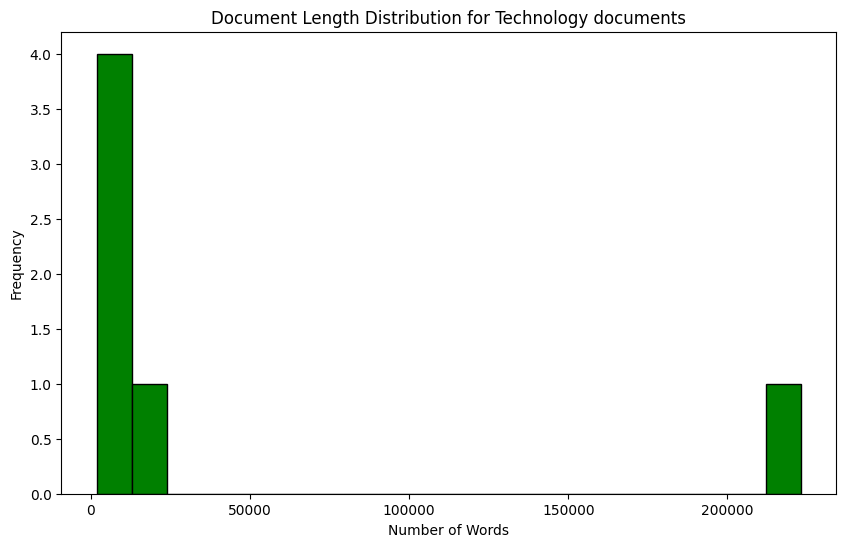

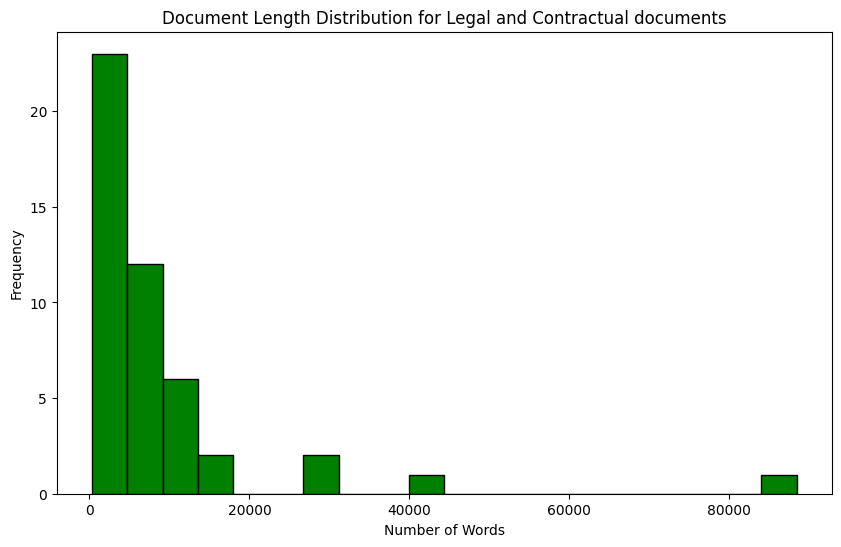

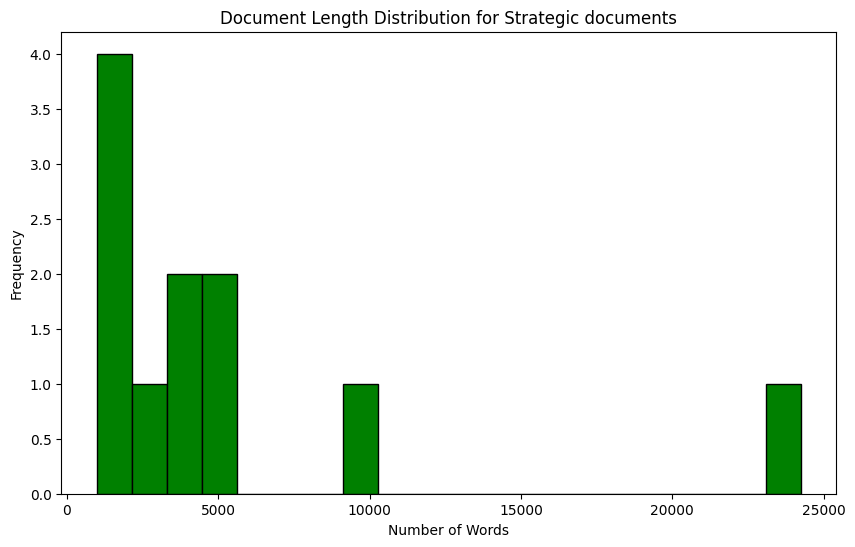

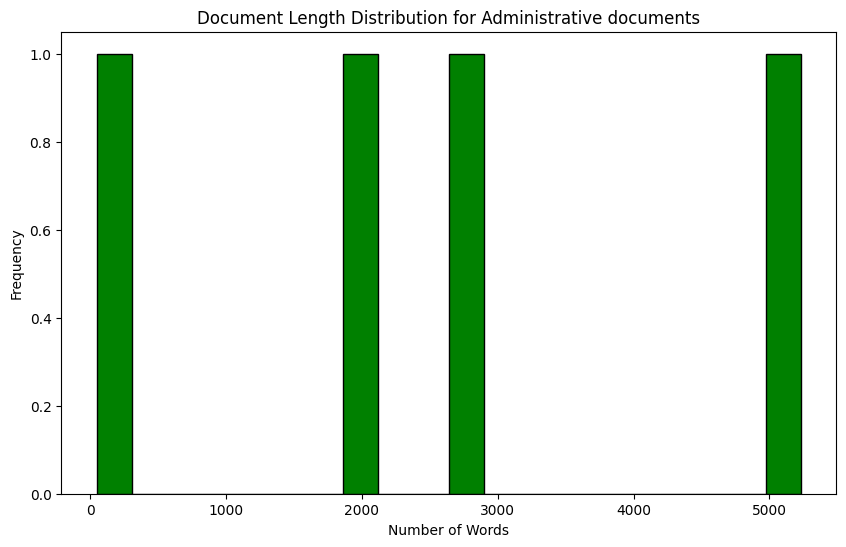

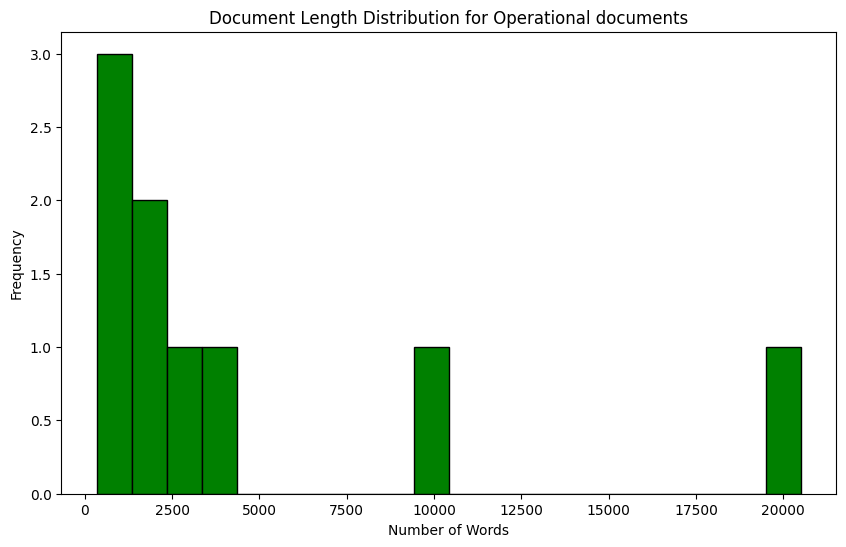

In [24]:
def document_length_distribution(topic_texts, topic_name):
    document_lengths = [len(doc.split()) for doc in topic_texts[topic_name]]
    plt.figure(figsize=(10, 6))
    plt.hist(document_lengths, bins=20, color='green', edgecolor='black')
    plt.title(f'Document Length Distribution for {topic_name} documents')
    plt.xlabel('Number of Words')
    plt.ylabel('Frequency')
    plt.show()

for topic in data.keys():
    document_length_distribution(data, topic)


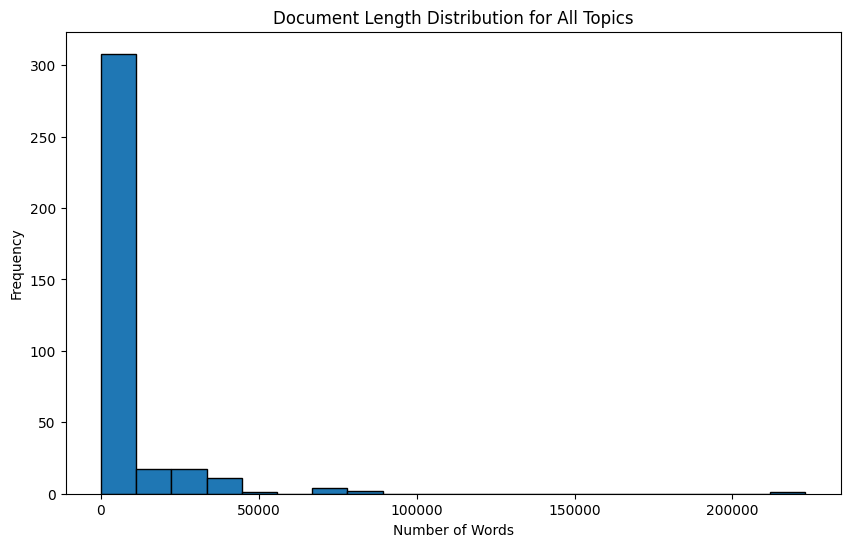

In [25]:
# Combine document lengths for all topics
all_document_lengths = [len(doc.split()) for docs in data.values() for doc in docs]

# Plot document length distribution for all documents
plt.figure(figsize=(10, 6))
plt.hist(all_document_lengths, bins=20, edgecolor='black')
plt.title('Document Length Distribution for All Topics')
plt.xlabel('Number of Words')
plt.ylabel('Frequency')
plt.show()

## **Unique Words Counts**

In [26]:
def unique_word_count(text):
    words = text.split()
    unique_words = len(set(words))
    print(f"Number of unique words: {unique_words}")

for topic, text in combined_texts.items():
    print(f"Topic: {topic}")
    unique_word_count(text)


Topic: Marketing and Public Communication
Number of unique words: 2708
Topic: Financial
Number of unique words: 22700
Topic: Regulatory and Compliance
Number of unique words: 17106
Topic: Technology
Number of unique words: 29024
Topic: Legal and Contractual
Number of unique words: 13406
Topic: Strategic
Number of unique words: 9412
Topic: Administrative
Number of unique words: 2794
Topic: Operational
Number of unique words: 5595


# **Topic Similarity**

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Combine all topic texts into a list
topic_names = list(combined_texts.keys())
topic_texts = list(combined_texts.values())

# Convert topics to TF-IDF vectors
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(topic_texts)


In [28]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Compute cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Create a DataFrame for better visualization
cosine_sim_df = pd.DataFrame(cosine_sim, index=topic_names, columns=topic_names)
print(cosine_sim_df)


                                    Marketing and Public Communication  \
Marketing and Public Communication                            1.000000   
Financial                                                     0.176763   
Regulatory and Compliance                                     0.234129   
Technology                                                    0.433110   
Legal and Contractual                                         0.171135   
Strategic                                                     0.476260   
Administrative                                                0.233831   
Operational                                                   0.117111   

                                    Financial  Regulatory and Compliance  \
Marketing and Public Communication   0.176763                   0.234129   
Financial                            1.000000                   0.578318   
Regulatory and Compliance            0.578318                   1.000000   
Technology                   

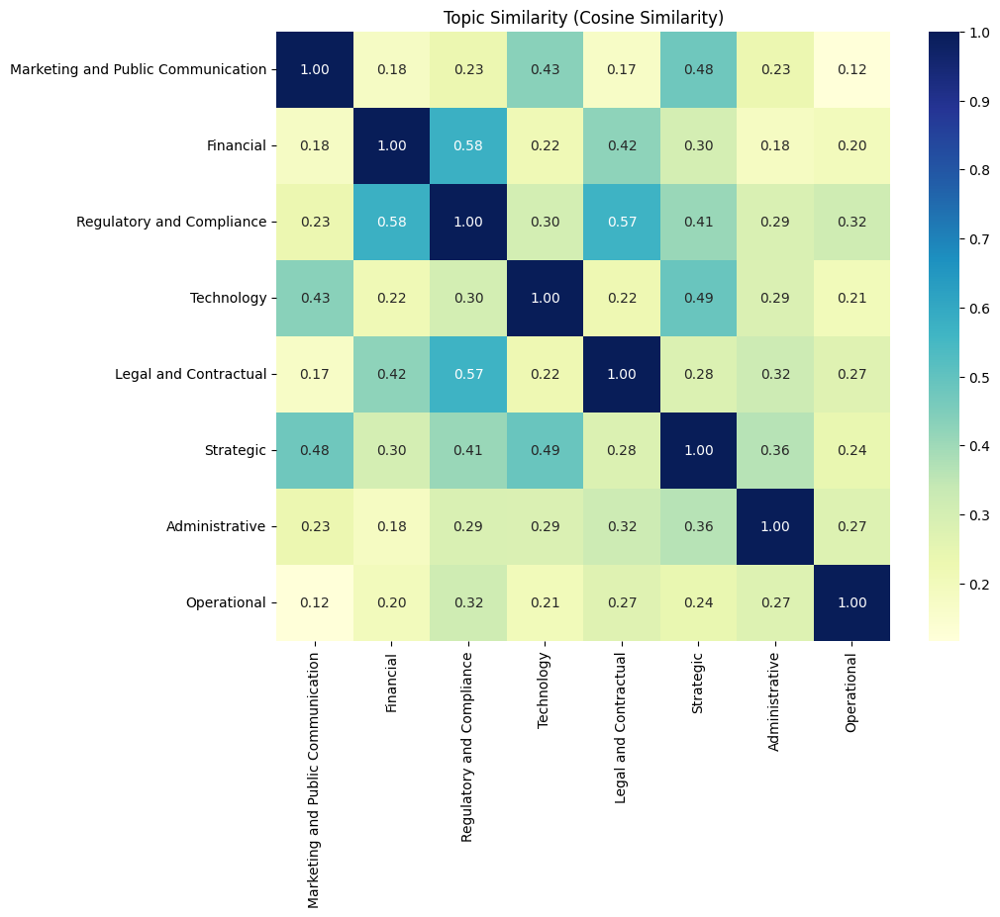

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cosine_sim_df, annot=True, cmap="YlGnBu", fmt=".2f")
plt.title("Topic Similarity (Cosine Similarity)")
plt.show()


## Token Analysis 

Token indices sequence length is longer than the specified maximum sequence length for this model (1310 > 512). Running this sequence through the model will result in indexing errors


Analyzing token lengths for topic: Marketing and Public Communication


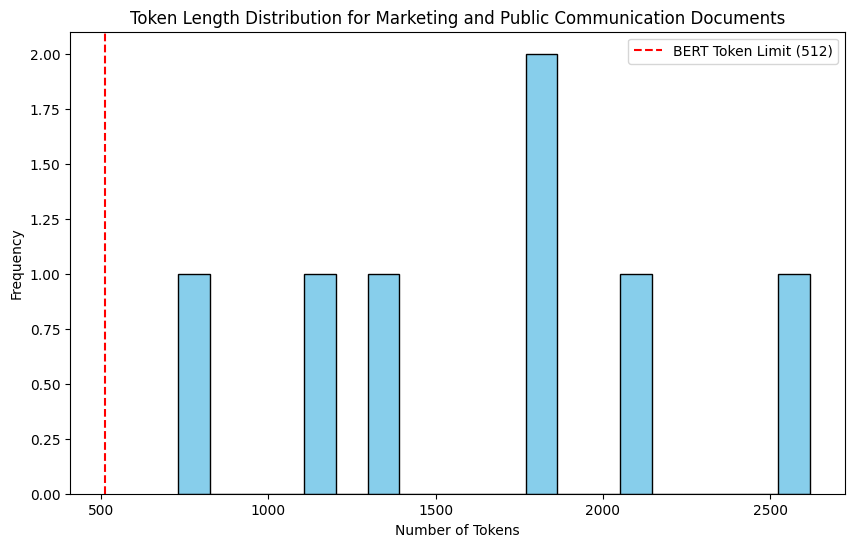

Analyzing token lengths for topic: Financial


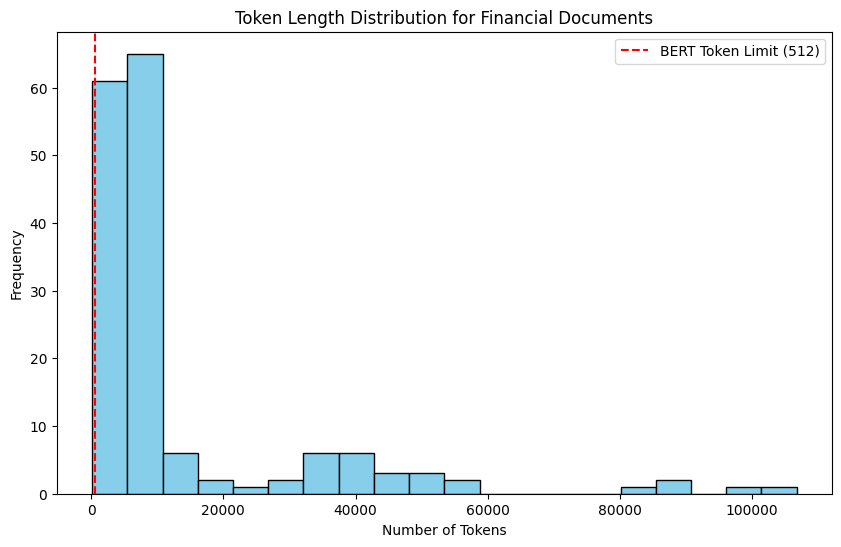

Analyzing token lengths for topic: Regulatory and Compliance


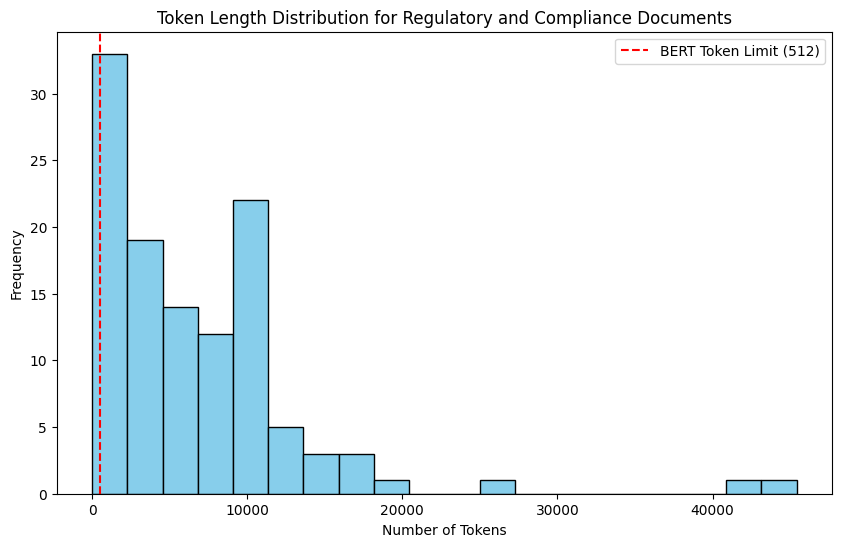

Analyzing token lengths for topic: Technology


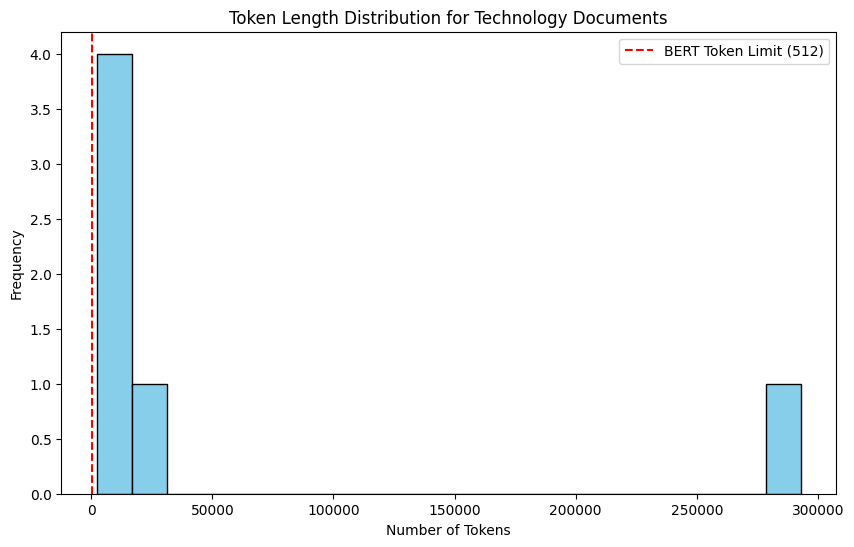

Analyzing token lengths for topic: Legal and Contractual


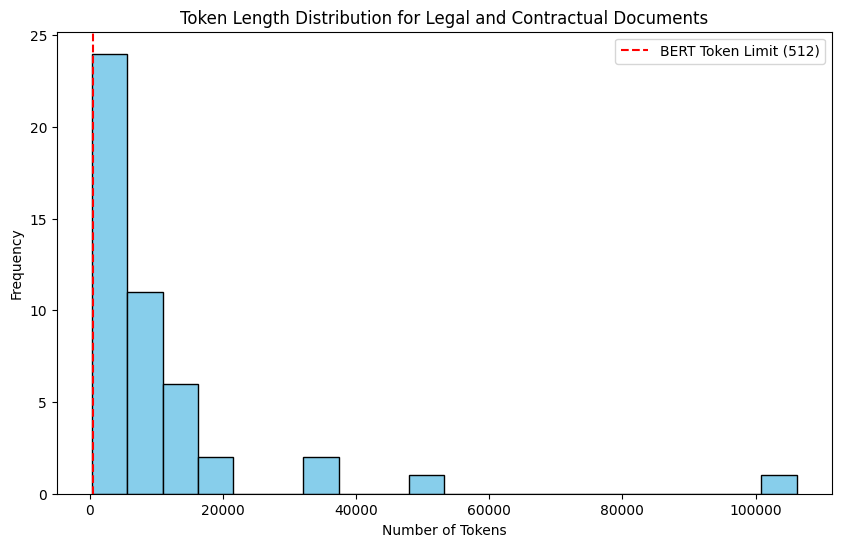

Analyzing token lengths for topic: Strategic


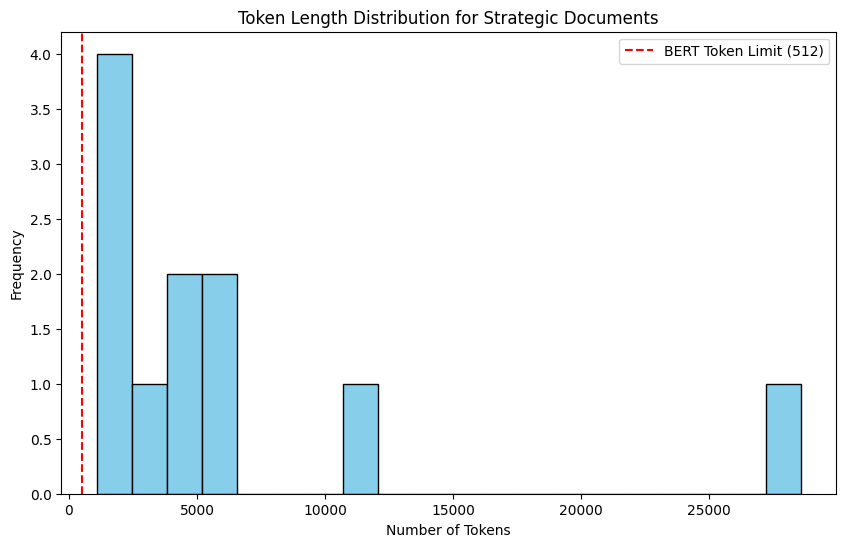

Analyzing token lengths for topic: Administrative


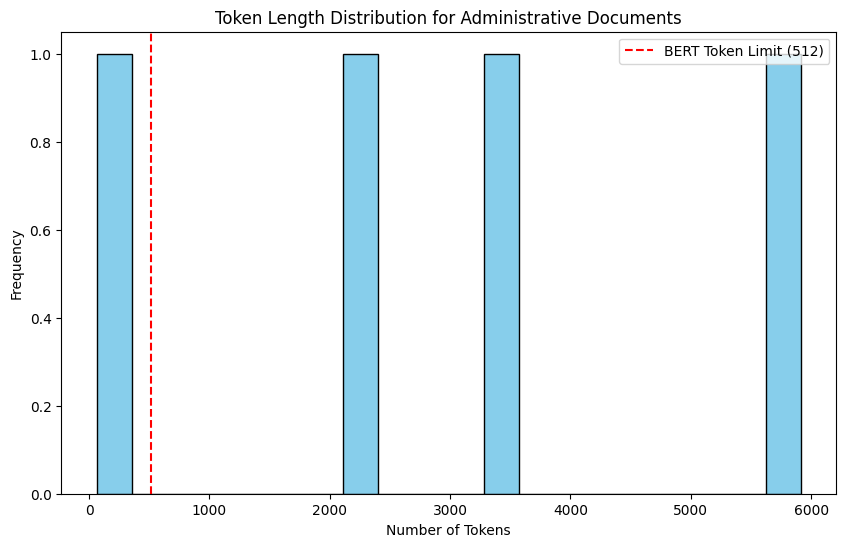

Analyzing token lengths for topic: Operational


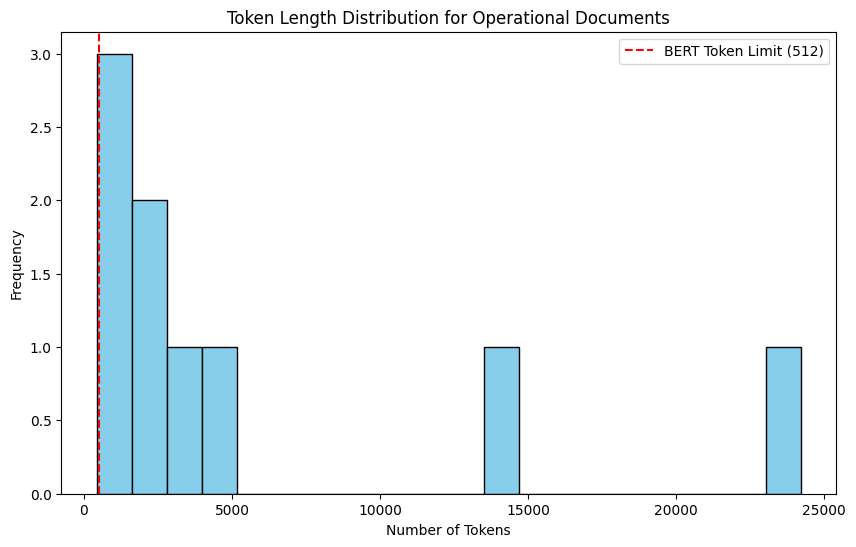

In [30]:
from transformers import AutoTokenizer
import matplotlib.pyplot as plt

# Initialize tokenizer for tokenization analysis
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")  # Replace with your model's tokenizer

# Function to calculate token lengths for documents
def token_length_distribution(texts, topic_name):
    token_lengths = [len(tokenizer.encode(doc, truncation=False)) for doc in texts]
    plt.figure(figsize=(10, 6))
    plt.hist(token_lengths, bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Token Length Distribution for {topic_name} Documents')
    plt.xlabel('Number of Tokens')
    plt.ylabel('Frequency')
    plt.axvline(x=512, color='red', linestyle='--', label='BERT Token Limit (512)')
    plt.legend()
    plt.show()
    return token_lengths

# Analyze token lengths for each topic
token_lengths_per_topic = {}
for topic, texts in data.items():
    print(f"Analyzing token lengths for topic: {topic}")
    token_lengths = token_length_distribution(texts, topic)
    token_lengths_per_topic[topic] = token_lengths

Token indices sequence length is longer than the specified maximum sequence length for this model (1310 > 512). Running this sequence through the model will result in indexing errors


Analyzing token lengths for topic: Marketing and Public Communication


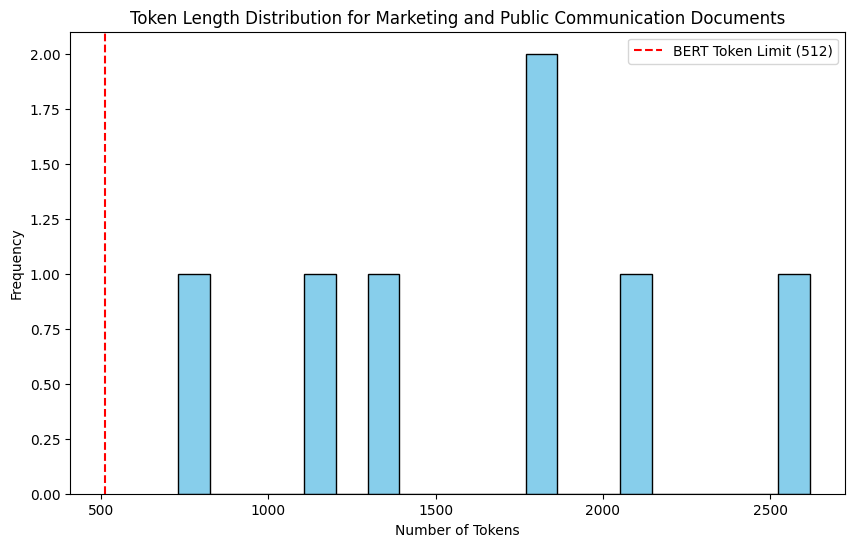

Analyzing token lengths for topic: Financial


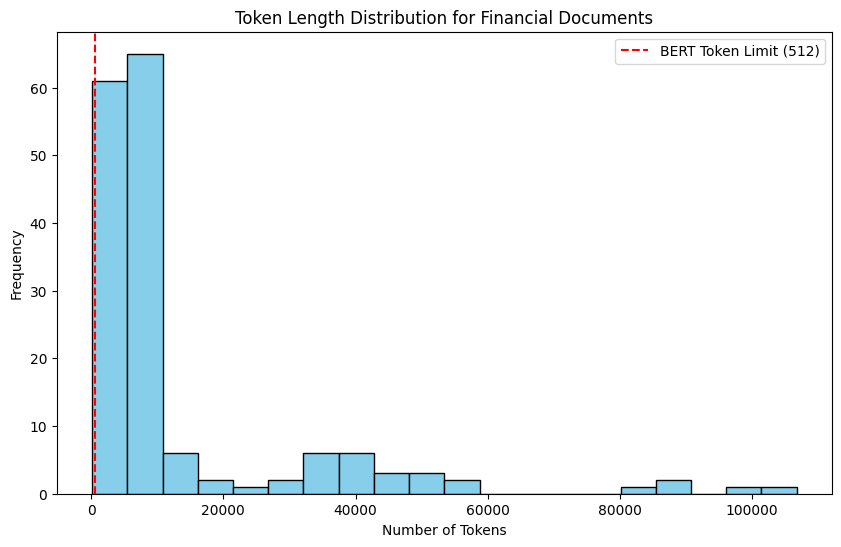

Analyzing token lengths for topic: Regulatory and Compliance


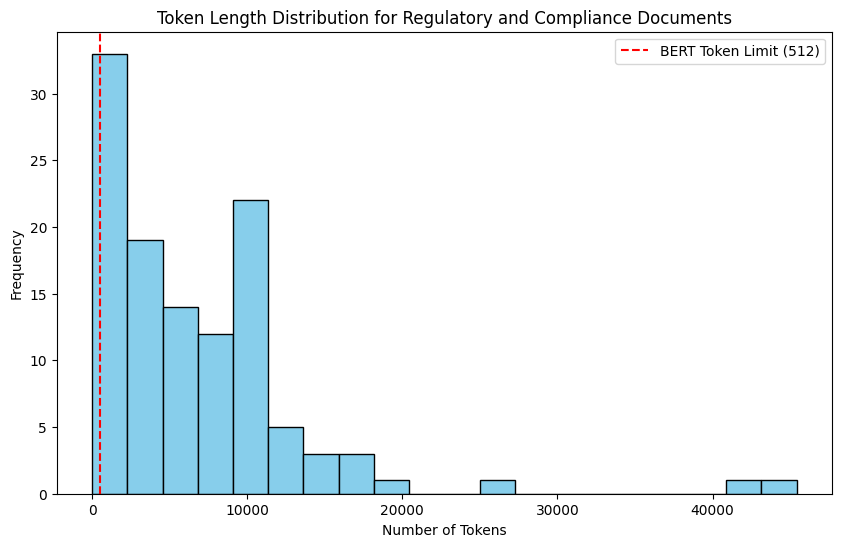

Analyzing token lengths for topic: Technology


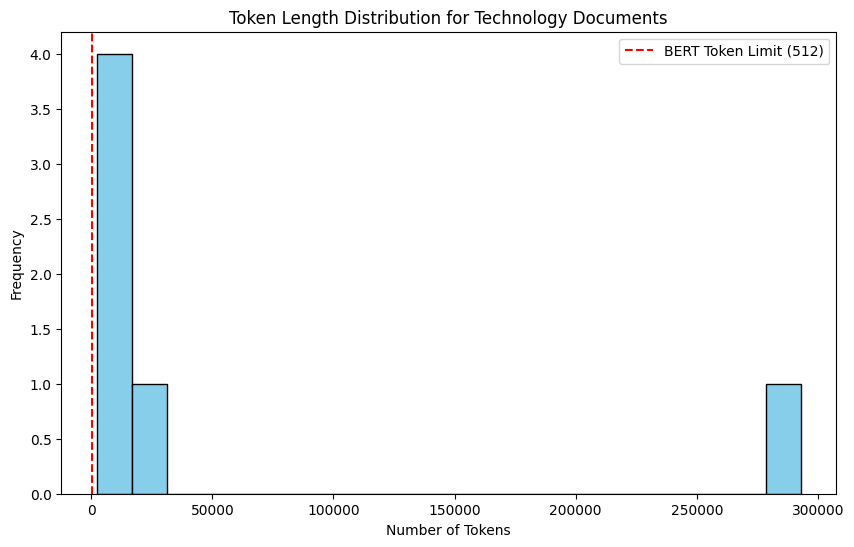

Analyzing token lengths for topic: Legal and Contractual


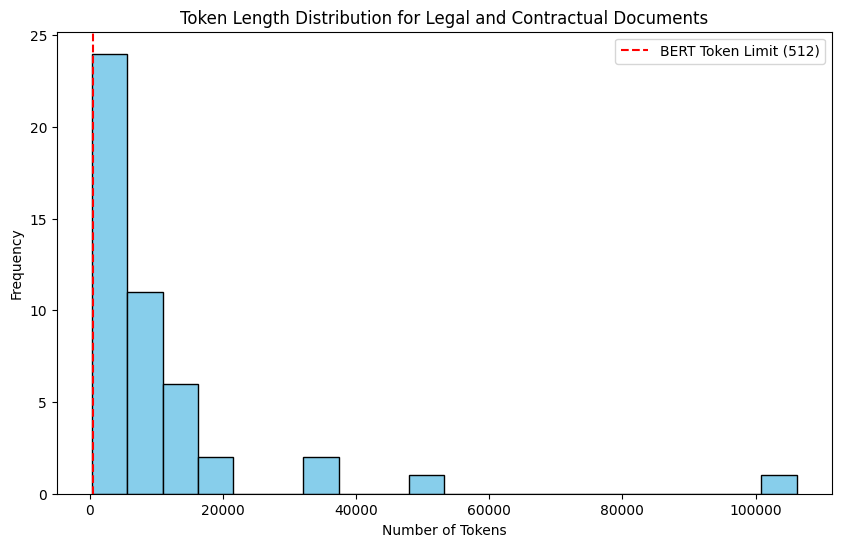

Analyzing token lengths for topic: Strategic


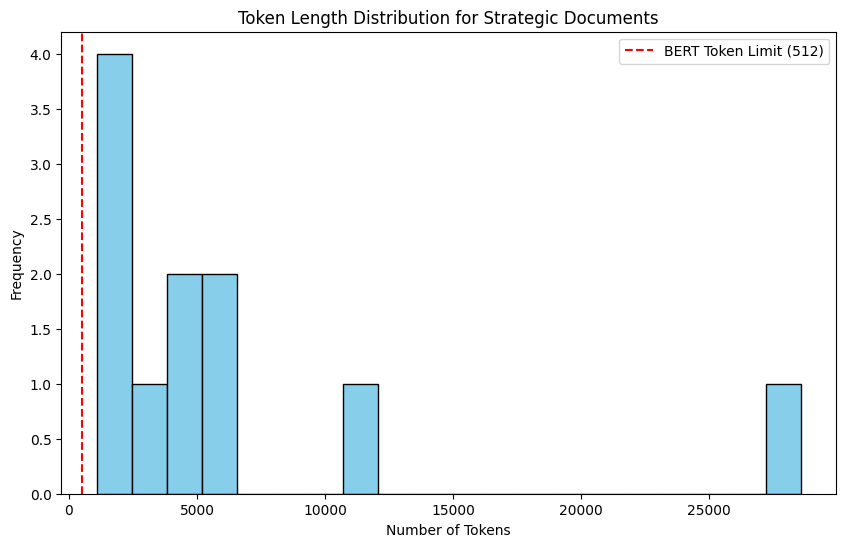

Analyzing token lengths for topic: Administrative


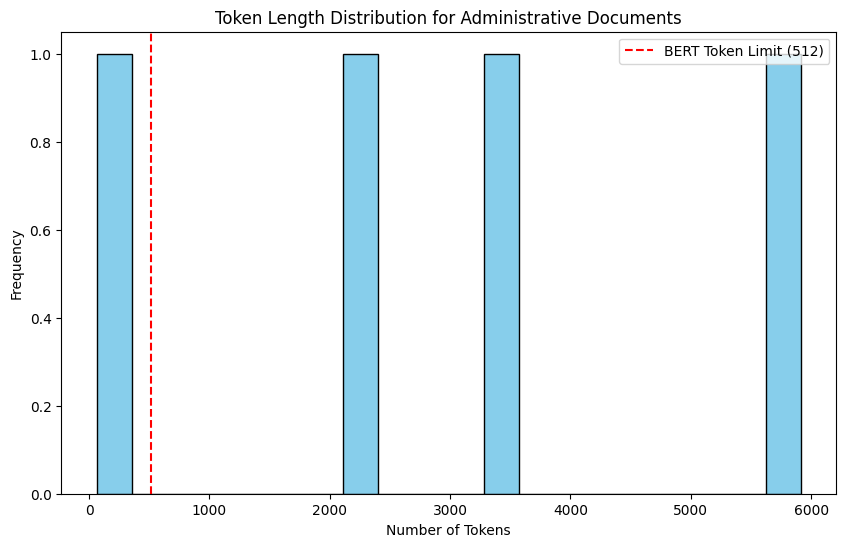

Analyzing token lengths for topic: Operational


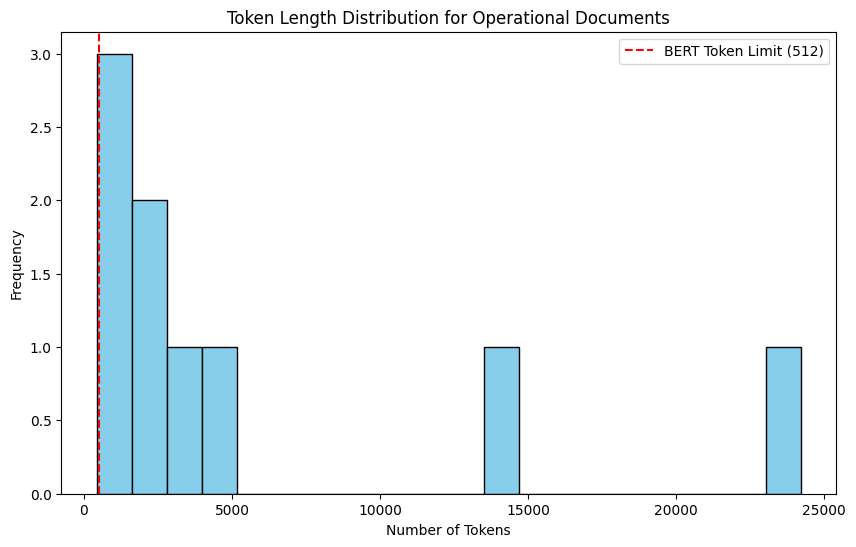

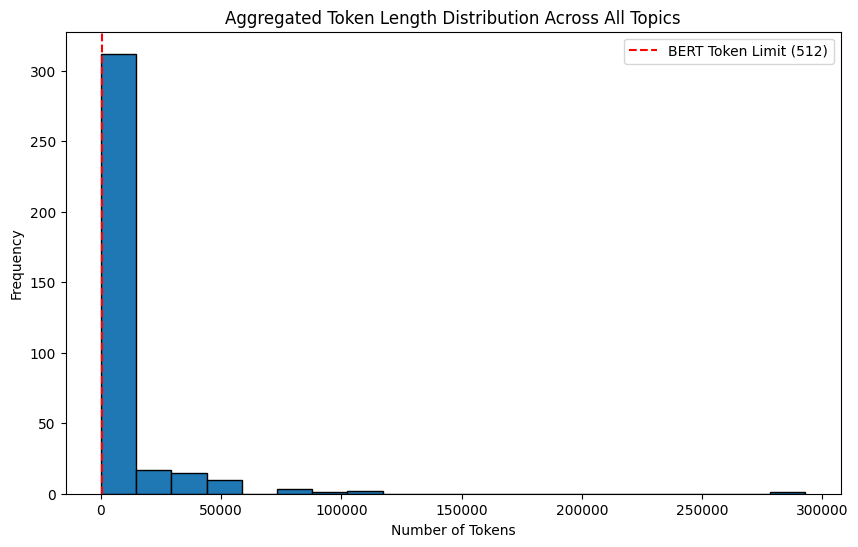

In [31]:
from transformers import AutoTokenizer
import matplotlib.pyplot as plt

# Initialize tokenizer for tokenization analysis
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")  # Replace with your model's tokenizer

# Function to calculate token lengths for documents
def token_length_distribution(texts, topic_name):
    token_lengths = [len(tokenizer.encode(doc, truncation=False)) for doc in texts]
    plt.figure(figsize=(10, 6))
    plt.hist(token_lengths, bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Token Length Distribution for {topic_name} Documents')
    plt.xlabel('Number of Tokens')
    plt.ylabel('Frequency')
    plt.axvline(x=512, color='red', linestyle='--', label='BERT Token Limit (512)')
    plt.legend()
    plt.show()
    return token_lengths

# Analyze token lengths for each topic
token_lengths_per_topic = {}
all_token_lengths = []  # To store token lengths across all topics

for topic, texts in data.items():
    print(f"Analyzing token lengths for topic: {topic}")
    token_lengths = token_length_distribution(texts, topic)
    token_lengths_per_topic[topic] = token_lengths
    all_token_lengths.extend(token_lengths)  # Aggregate token lengths

# Plot aggregated token length distribution across all topics
plt.figure(figsize=(10, 6))
plt.hist(all_token_lengths, bins=20, edgecolor='black')
plt.title('Aggregated Token Length Distribution Across All Topics')
plt.xlabel('Number of Tokens')
plt.ylabel('Frequency')
plt.axvline(x=512, color='red', linestyle='--', label='BERT Token Limit (512)')
plt.legend()
plt.show()


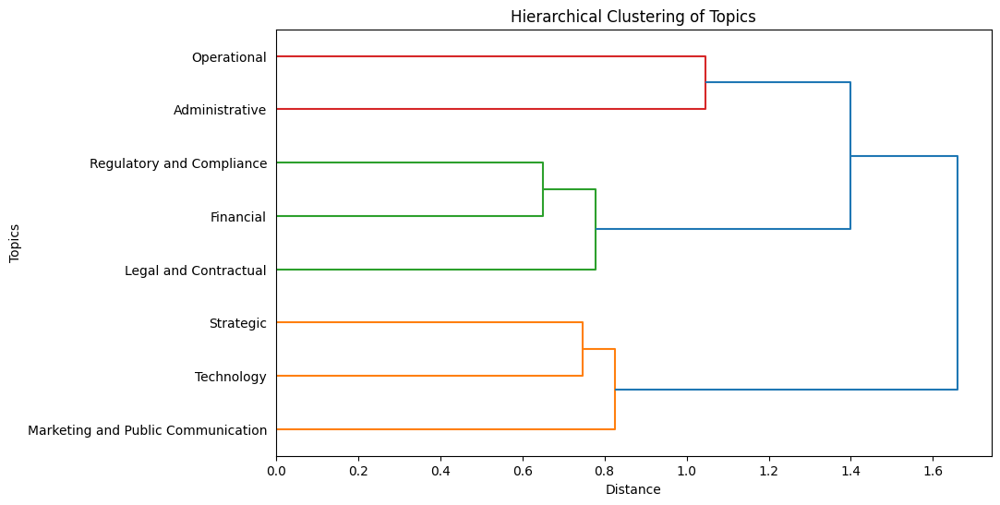

In [32]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

# Function to perform clustering based on cosine similarity
def plot_topic_clustering(tfidf_matrix, topic_names):
    cosine_sim = cosine_similarity(tfidf_matrix)
    linkage_matrix = linkage(1 - cosine_sim, method='ward')  # Use Ward's method for hierarchical clustering

    # Plot dendrogram
    plt.figure(figsize=(10, 6))
    dendrogram(linkage_matrix, labels=topic_names, orientation='right', leaf_font_size=10)
    plt.title('Hierarchical Clustering of Topics')
    plt.xlabel('Distance')
    plt.ylabel('Topics')
    plt.show()

    return cosine_sim

# Generate TF-IDF vectors for all topics
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(combined_texts.values())
topic_names = list(combined_texts.keys())

# Plot clustering
cosine_similarity_matrix = plot_topic_clustering(tfidf_matrix, topic_names)


# Identify Key Entities or Rare Words

In [34]:
import spacy

# Load SpaCy model
nlp = spacy.load("en_core_web_sm")
nlp.max_length = 2_000_000  # Increase limit (but safer to chunk text)

# Function to extract named entities in chunks
def extract_named_entities(text, chunk_size=500_000):
    entities = []
    text_length = len(text)
    
    for i in range(0, text_length, chunk_size):
        chunk = text[i:i + chunk_size]
        doc = nlp(chunk)
        entities.extend([ent.text for ent in doc.ents])
    
    return entities

# Apply to each topic
entity_results = {topic: extract_named_entities(text) for topic, text in combined_texts.items()}

# Display unique named entities per topic
for topic, entities in entity_results.items():
    print(f"\nTopic: {topic}")
    print(set(entities[:20]))  # Display only first 20 for readability



Topic: Marketing and Public Communication
{'one', 'second year', 'liampoti moritz hagenm ller', 'four', 'year', 'europe', 'approximately half', 'last year', 'annually', 'urs rahne', 'million', 'september'}

Topic: Financial
{'ccr internal models method', 'last quarter quarter last year', 'recognition', 'ccr', 'mar', 'annex', 'year year', 'ccp', 'jun mar', 'march united overseas bank limited', 'ris', 'ris kbas ed capital ratios percentage rwa cet', 'sft counterparty', 'quarter quarter', 'mar dec', 'mar dec mar'}

Topic: Regulatory and Compliance
{'singapore', 'annual', 'first', 'secondhalf fourth quarter', 'january', 'full year', 'year ending june', 'june', 'days', 'institute singapore', 'september'}

Topic: Technology
{'singapore', 'three', 'willis lim dr luke ho', 'disclaims warranty', 'ho w fsisac advances', 'manipulat ed', 'tomorrow', 'gpt', 'jaslynn tan', 'chin', 'yond', 'w ho'}

Topic: Legal and Contractual
{'one', 'singapore', 'corporation bank amalgamates corporation bank', 'cu

In [38]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Function to extract rare words using TF-IDF
def extract_rare_words(corpus_dict):
    vectorizer = TfidfVectorizer(stop_words="english", max_features=10000)
    tfidf_matrix = vectorizer.fit_transform(corpus_dict.values())
    feature_names = vectorizer.get_feature_names_out()

    # Convert TF-IDF matrix to DataFrame
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), index=corpus_dict.keys(), columns=feature_names)

    # Find rare words: words with high TF-IDF in one category but low in others
    rare_words_per_category = {}
    for topic in tfidf_df.index:
        rare_words = tfidf_df.loc[topic].nlargest(10)  # Get top 10 rare words per category
        rare_words_per_category[topic] = rare_words.index.tolist()

    return rare_words_per_category

# Run rare word analysis
rare_words = extract_rare_words(combined_texts)

# Print rare words per category
print("\n🔹 Rare Words Per Topic:")
for topic, words in rare_words.items():
    print(f"\n📌 {topic}: {words}")



🔹 Rare Words Per Topic:

📌 Marketing and Public Communication: ['loyalty', 'personalization', 'ai', 'genai', 'personalized', 'marketing', 'content', 'companies', 'data', 'customers']

📌 Financial: ['financial', 'rm', 'group', 'bank', 'risk', 'assets', 'income', 'total', 'credit', 'year']

📌 Regulatory and Compliance: ['bank', 'risk', 'financial', 'audit', 'singapore', 'mas', 'customer', 'information', 'merchant', 'management']

📌 Technology: ['ai', 'oday', 'future', 'new', 'institute', 'data', 'rights', 'reserved', 'tech', 'technology']

📌 Legal and Contractual: ['shall', 'uobkh', 'client', 'company', 'hedge', 'dh', 'agreement', 'hedging', 'hedged', 'value']

📌 Strategic: ['business', 'digital', 'customer', 'cwm', 'companies', 'new', 'strategy', 'management', 'company', 'value']

📌 Administrative: ['employee', 'employees', 'work', 'company', 'new', 'neglix', 'buddy', 'people', 'day', 'use']

📌 Operational: ['training', 'fpi', 'safety', 'cfr', 'health', 'date', 'mmddyyyy', 'course', 'a

### Using NER to extract top named entities

In [35]:
import spacy
import pandas as pd
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer

# Load SpaCy model
nlp = spacy.load("en_core_web_sm")

# Function to extract named entities from text
def extract_named_entities(text):
    doc = nlp(text[:1_000_000])  # Process only first 1M chars to avoid memory errors
    return [ent.text.lower() for ent in doc.ents]

# Apply NER to each category
entity_counts = {}
for topic, text in combined_texts.items():
    entities = extract_named_entities(text)
    entity_counts[topic] = Counter(entities).most_common(10)  # Show top 10 entities

# Display entity results
print("\nTop Named Entities Per Topic:")
for topic, entities in entity_counts.items():
    print(f"\n{topic}: {entities}")

# TF-IDF Analysis
vectorizer = TfidfVectorizer(max_features=100, stop_words='english')
tfidf_matrix = vectorizer.fit_transform(combined_texts.values())
feature_names = vectorizer.get_feature_names_out()

# Convert to DataFrame
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), index=combined_texts.keys(), columns=feature_names)

# Show top words for each topic
print("\nTop TF-IDF Words Per Category:")
for topic in tfidf_df.index:
    print(f"\n{topic}: {tfidf_df.loc[topic].nlargest(10)}")



Top Named Entities Per Topic:

Marketing and Public Communication: [('boston consulting', 26), ('one', 13), ('three', 11), ('four', 10), ('europe', 9), ('european', 9), ('today', 7), ('half', 6), ('last year', 5), ('million', 5)]

Financial: [('singapore', 1041), ('one', 126), ('two', 81), ('ccr', 60), ('annual', 60), ('million', 57), ('years', 50), ('three', 46), ('four', 45), ('december', 41)]

Regulatory and Compliance: [('singapore', 247), ('year', 93), ('first', 82), ('annual', 70), ('one', 69), ('november', 62), ('june', 55), ('september', 54), ('two', 54), ('second', 51)]

Technology: [('first', 124), ('one', 123), ('china', 95), ('singapore', 92), ('two', 66), ('million', 65), ('february', 52), ('al', 46), ('december', 43), ('july', 42)]

Legal and Contractual: [('singapore', 231), ('one', 130), ('two', 62), ('first', 60), ('third', 49), ('august', 46), ('indonesia', 44), ('december', 34), ('us', 30), ('malaysia', 28)]

Strategic: [('one', 115), ('shenzhen', 88), ('india', 68)

**Analysis**:
From the above, we can see that many of the top words are numbers, or months that do not give us much insight. Hence, in the cell below, we shall remove those words.

### Improved NER

In [4]:
import spacy
import re

# Load SpaCy model (Consider using 'en_core_web_trf' for better performance)
nlp = spacy.load("en_core_web_sm")
nlp.max_length = 2_000_000  # Adjust limit for large text

# Define stop words to exclude
excluded_words = {
    "one", "two", "three", "four", "five", "million", "billion",
    "january", "february", "march", "april", "may", "june",
    "july", "august", "september", "october", "november", "december",
    "year", "years", "month", "months", "day", "days", "time"
}

excluded_countries = {
    "singapore", "china", "us", "america", "united states", "europe", 
    "india", "japan", "uk", "british", "french", "german"
}

# Function to extract named entities in chunks
def extract_filtered_entities(text, chunk_size=500_000):
    entities = []
    text_length = len(text)
    
    for i in range(0, text_length, chunk_size):
        chunk = text[i:i + chunk_size]
        doc = nlp(chunk)
        
        # Filter out irrelevant entities
        filtered = [
            ent.text.strip() for ent in doc.ents
            if ent.text.lower() not in excluded_words 
            and ent.text.lower() not in excluded_countries
            and ent.label_ not in {"DATE", "TIME", "ORDINAL", "PERSON"}  # Remove names & dates
        ]

        # Clean up tokenization errors
        cleaned_entities = [re.sub(r"\s+", " ", ent) for ent in filtered]
        
        entities.extend(cleaned_entities)

    return list(set(entities))  # Remove duplicates

# Apply filtering to dataset
filtered_entities_per_topic = {topic: extract_filtered_entities(text) for topic, text in combined_texts.items()}

# Display cleaned named entities per topic
for topic, entities in filtered_entities_per_topic.items():
    print(f"\n🔹 Topic: {topic}")
    print(set(entities[:20]))  # Display only first 20 for readability



🔹 Topic: Marketing and Public Communication
{'florian kogler', 'london', 'new jersey office', 'chicago', 'boston', 'atlanta', 'harvard business review article', 'dallas boston consulting group', 'google', 'woolworth australia sobey canada', 'north america', 'approximately half', 'dozen', 'basis boston consulting group', 'half', 'min boston consulting group', 'delta', 'ten', 'million million', 'brazilian'}

🔹 Topic: Financial
{'v e l p e n', 'kapito', 'macau sar overseas branches', 'oversees bank financial reporting effectiveness', 'grou p', 'waterloo canada directors consortium', 'asean greater bay', 'singapore storey', 'malaysia group risk capital committee rcc', 'chinese', 'board sustainability committee member risk management committee length service', 'building dubai international financial centre po', 'national environment agency board', 'gs legal regulatory', 'twelve', 'greater china business office coverage', 'federal reserve', 'three five', 'pwc holdings ltd take', 'ccp centra

### Most Common Words

In [37]:
from collections import Counter

# Function to count word frequency
def count_word_frequency(text):
    words = text.split()  # Since text is pre-cleaned, just split by space
    return Counter(words).most_common(20)  # Get top 20 most frequent words

# Compute word frequency for each topic
word_freq_per_topic = {}

for topic, text in combined_texts.items():
    word_freq = count_word_frequency(text)
    word_freq_per_topic[topic] = word_freq

# Print high-frequency words per topic
print("\n🔹 Top High-Frequency Words Per Topic:")
for topic, words in word_freq_per_topic.items():
    print(f"\nTopic: {topic}:")
    for word, count in words:
        print(f"{word}: {count}")



🔹 Top High-Frequency Words Per Topic:

Topic: Marketing and Public Communication:
ai: 100
loyalty: 100
marketing: 82
content: 81
companies: 79
data: 78
customers: 76
customer: 75
programs: 71
personalization: 63
genai: 58
creative: 53
use: 52
personalized: 47
boston: 42
consulting: 41
consumers: 41
program: 41
new: 40
leaders: 40

Topic: Financial:
financial: 24755
group: 17917
rm: 17124
bank: 17036
risk: 15228
assets: 14012
income: 12242
total: 11665
credit: 10792
year: 10441
capital: 8689
management: 8504
value: 8344
company: 8321
statements: 8262
december: 8021
malaysia: 8005
net: 7738
cash: 7541
fair: 7246

Topic: Regulatory and Compliance:
bank: 5453
risk: 5234
may: 4625
financial: 4561
audit: 4059
customer: 4023
information: 3832
management: 3405
singapore: 3279
mas: 3221
b: 3156
business: 3145
risks: 2735
merchant: 2613
company: 2602
notice: 2597
transactions: 2458
relevant: 2398
section: 2379
banks: 2147

Topic: Technology:
ai: 2113
new: 1524
future: 1442
data: 1298
institute:

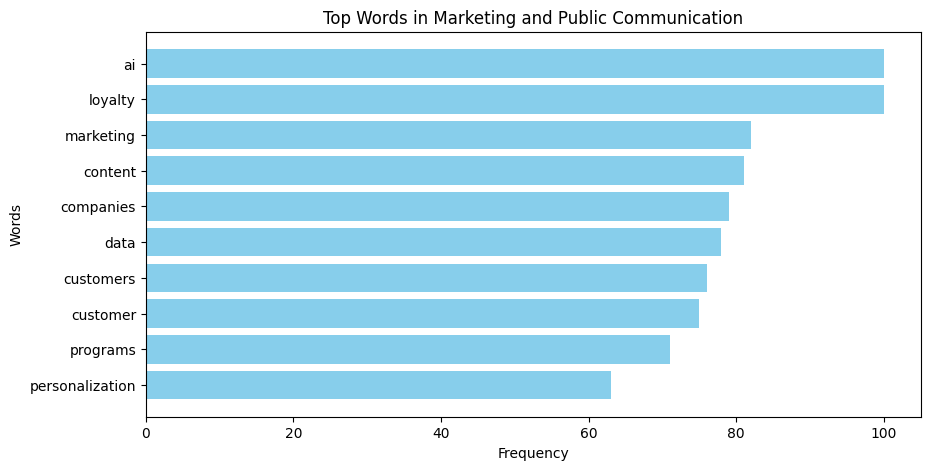

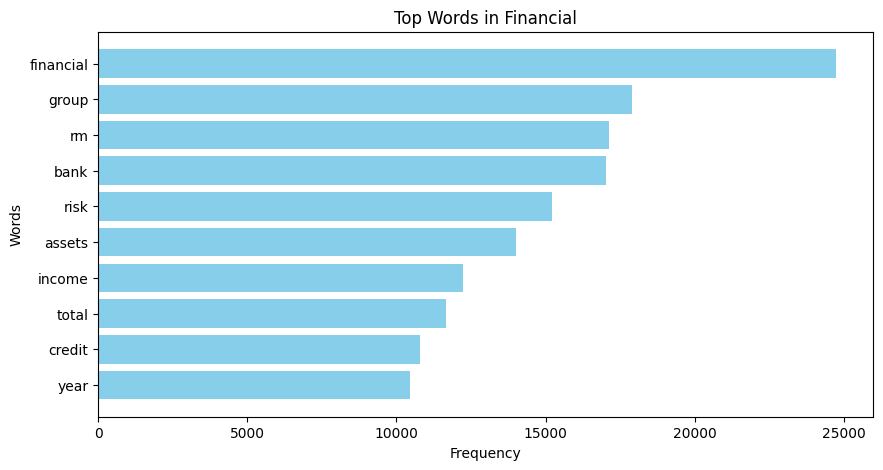

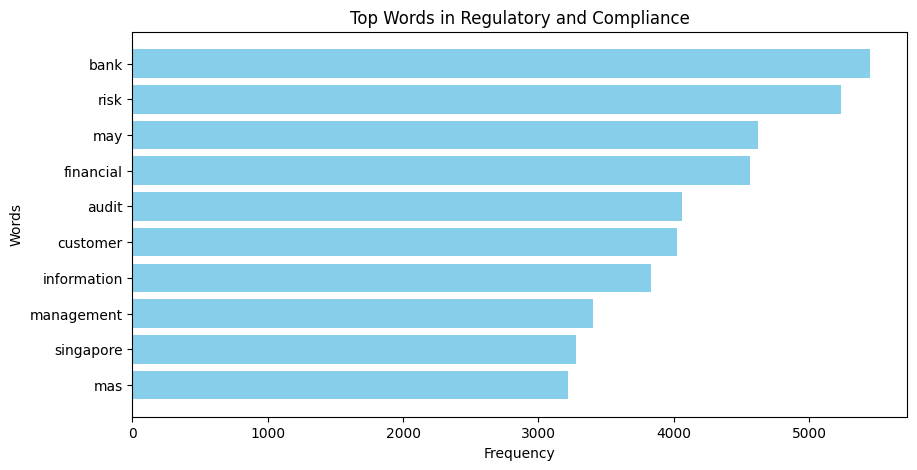

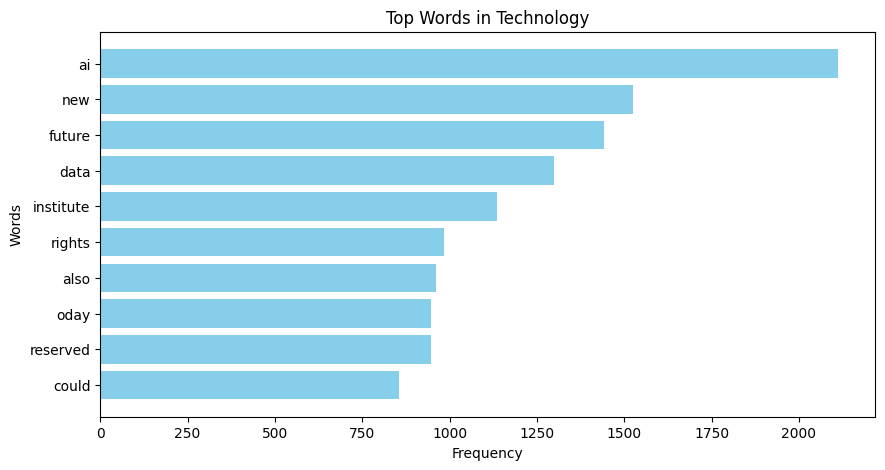

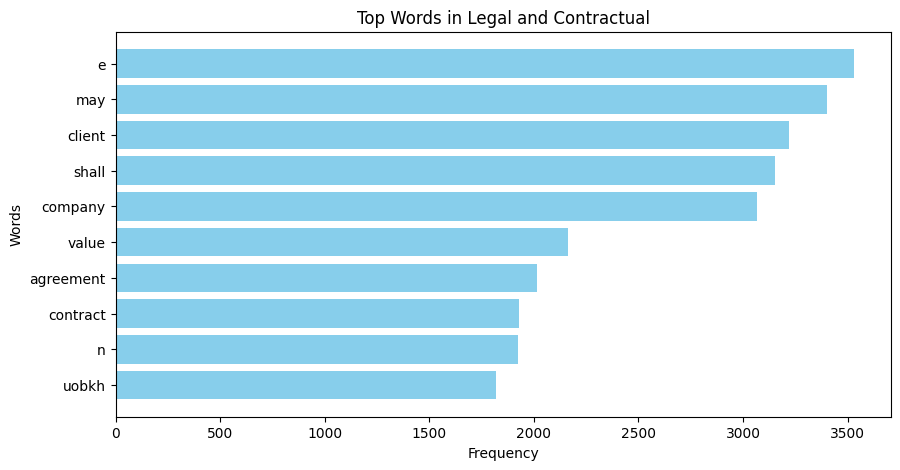

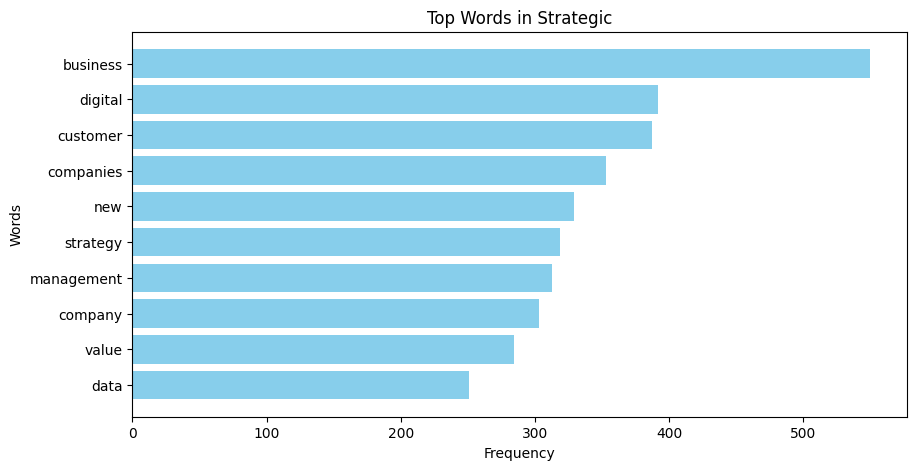

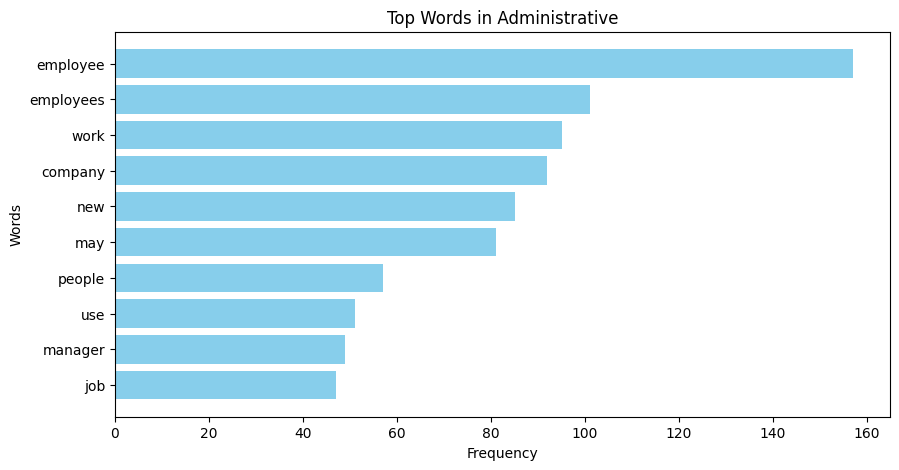

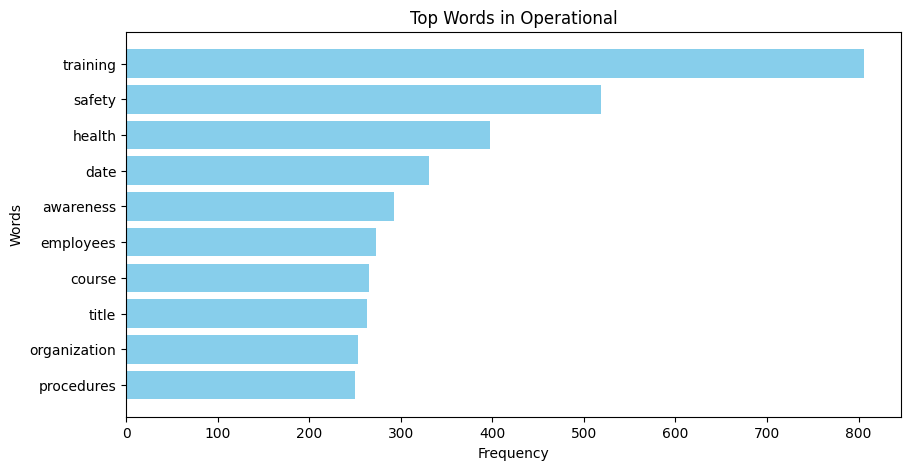

In [40]:
# Generate High-Frequency Words Bar Charts
for topic, words in word_freq_per_topic.items():
    words, counts = zip(*words[:10])  # Get top 10 words
    plt.figure(figsize=(10, 5))
    plt.barh(words, counts, color='skyblue')
    plt.xlabel("Frequency")
    plt.ylabel("Words")
    plt.title(f"Top Words in {topic}")
    plt.gca().invert_yaxis()
    plt.show()


,Topic,Word,Count
0,Marketing and Public Communication,ai,100
1,Marketing and Public Communication,loyalty,100
2,Marketing and Public Communication,marketing,82
3,Marketing and Public Communication,content,81
4,Marketing and Public Communication,companies,79
5,Marketing and Public Communication,data,78
6,Marketing and Public Communication,customers,76
7,Marketing and Public Communication,customer,75
8,Marketing and Public Communication,programs,71
9,Marketing and Public Communication,personalization,63


,Topic,Rare Word
0,Marketing and Public Communication,thrived
1,Marketing and Public Communication,tripled
2,Marketing and Public Communication,bestperforming
3,Marketing and Public Communication,september
4,Marketing and Public Communication,slowing
5,Marketing and Public Communication,wellpublicized
6,Marketing and Public Communication,restructurings
7,Marketing and Public Communication,resilient
8,Marketing and Public Communication,prospects
9,Marketing and Public Communication,confirmed


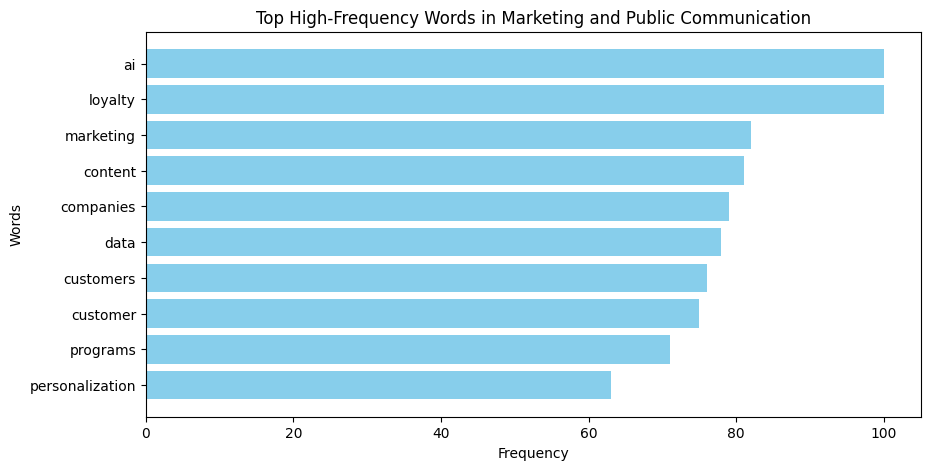

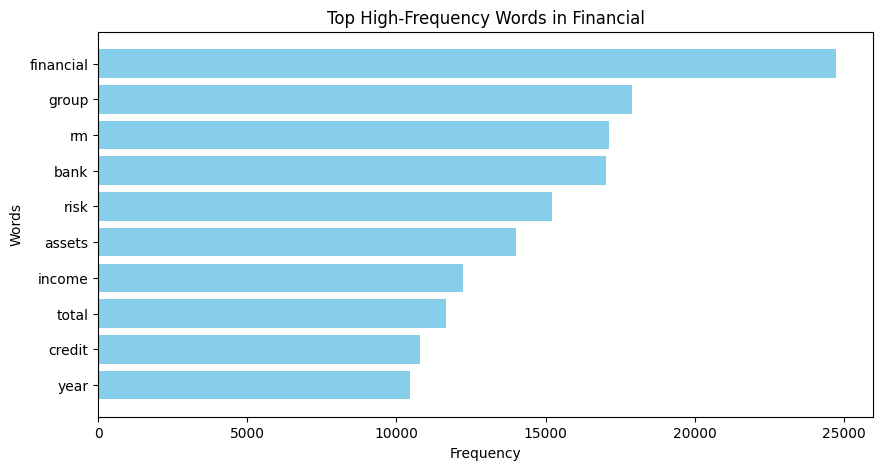

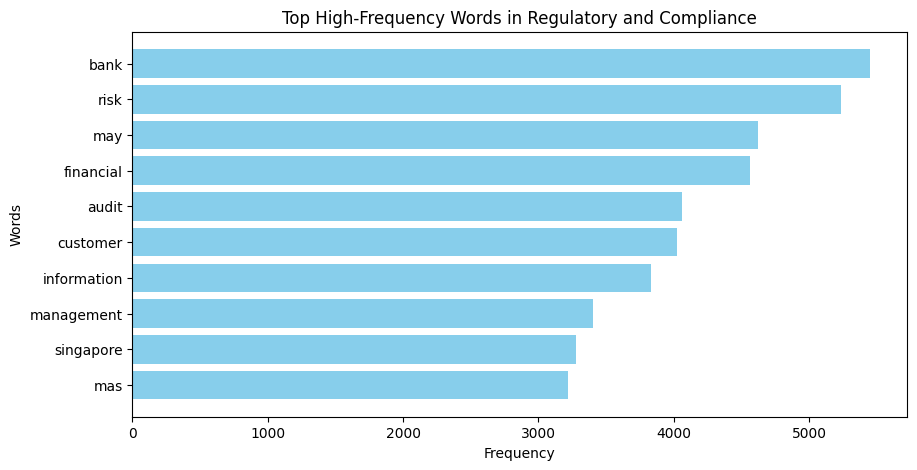

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# Function to count word frequency
def count_word_frequency(text):
    words = text.split()
    return Counter(words)

# Compute word frequency for each topic in batches
word_freq_data = []
rare_word_data = []

for topic, text in combined_texts.items():
    word_counts = count_word_frequency(text)
    sorted_words = word_counts.most_common()

    # Extract top 20 high-frequency words
    for word, count in sorted_words[:20]:
        word_freq_data.append((topic, word, count))

    # Extract rare words (words appearing only once)
    rare_words = [word for word, count in sorted_words if count == 1]
    for word in rare_words[:20]:  # Limit rare words for efficiency
        rare_word_data.append((topic, word))

# Convert to DataFrame
word_freq_df = pd.DataFrame(word_freq_data, columns=["Topic", "Word", "Count"])
rare_word_df = pd.DataFrame(rare_word_data, columns=["Topic", "Rare Word"])

# Save CSVs to avoid reprocessing
word_freq_df.to_csv("high_frequency_words.csv", index=False)
rare_word_df.to_csv("rare_words.csv", index=False)

# Display sample tables for Jupyter Notebook
display(word_freq_df.head(20))  # Show first 20 high-frequency words
display(rare_word_df.head(20))  # Show first 20 rare words

# Generate bar charts for a subset of topics (prevents memory overload)
topics_to_plot = word_freq_df["Topic"].unique()[:3]  # Plot first 3 topics

for topic in topics_to_plot:
    df_topic = word_freq_df[word_freq_df["Topic"] == topic].nlargest(10, "Count")  # Top 10 words per topic

    if not df_topic.empty:
        plt.figure(figsize=(10, 5))
        plt.barh(df_topic["Word"], df_topic["Count"], color="skyblue")
        plt.xlabel("Frequency")
        plt.ylabel("Words")
        plt.title(f"Top High-Frequency Words in {topic}")
        plt.gca().invert_yaxis()
        plt.show()


### Comparing Rare Words vs High Frequency Words

,Topic,Word,Count
0,Marketing and Public Communication,ai,100
1,Marketing and Public Communication,loyalty,100
2,Marketing and Public Communication,marketing,82
3,Marketing and Public Communication,content,81
4,Marketing and Public Communication,companies,79
5,Marketing and Public Communication,data,78
6,Marketing and Public Communication,customers,76
7,Marketing and Public Communication,customer,75
8,Marketing and Public Communication,programs,71
9,Marketing and Public Communication,personalization,63


,Topic,Rare Word
0,Marketing and Public Communication,thrived
1,Marketing and Public Communication,tripled
2,Marketing and Public Communication,bestperforming
3,Marketing and Public Communication,amaryllis
4,Marketing and Public Communication,liampoti
5,Marketing and Public Communication,moritz
6,Marketing and Public Communication,hagenm
7,Marketing and Public Communication,ller
8,Marketing and Public Communication,urs
9,Marketing and Public Communication,rahne


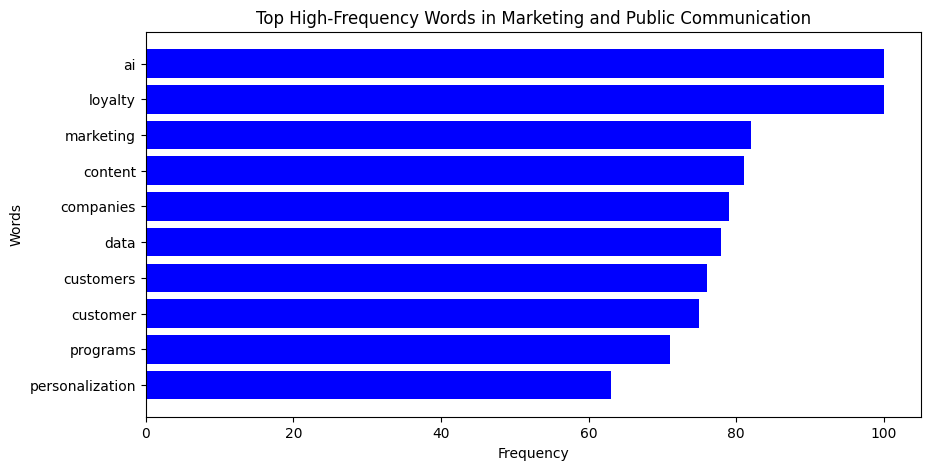

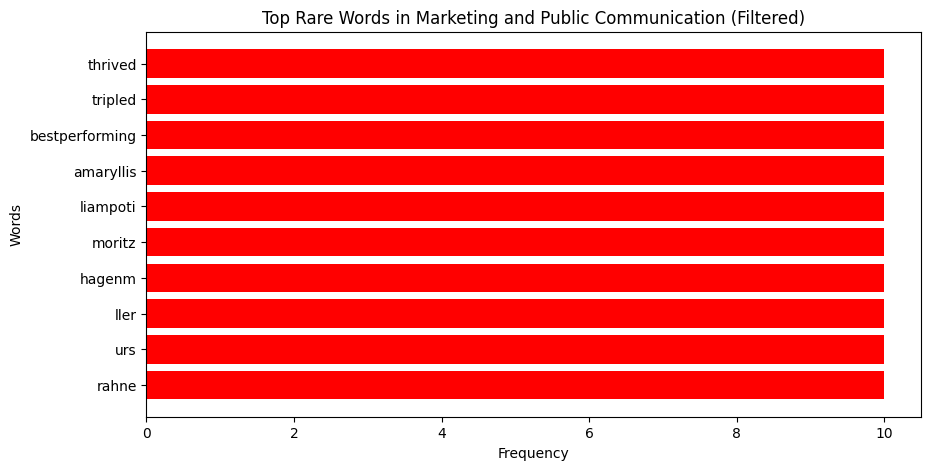

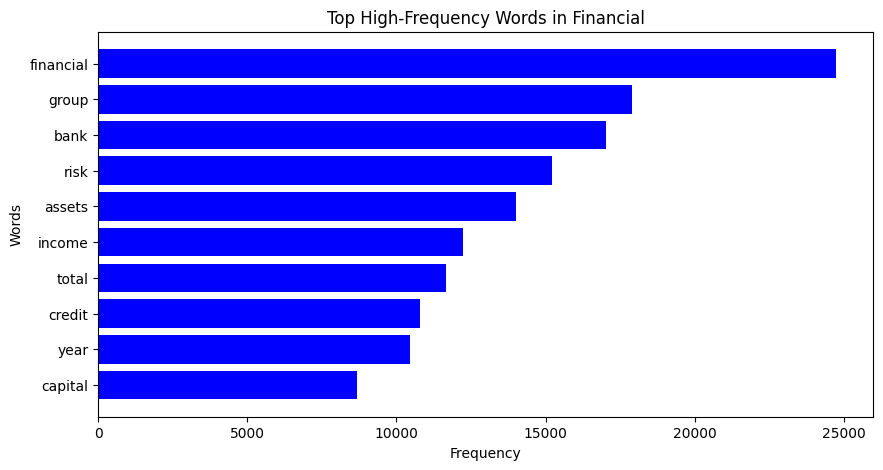

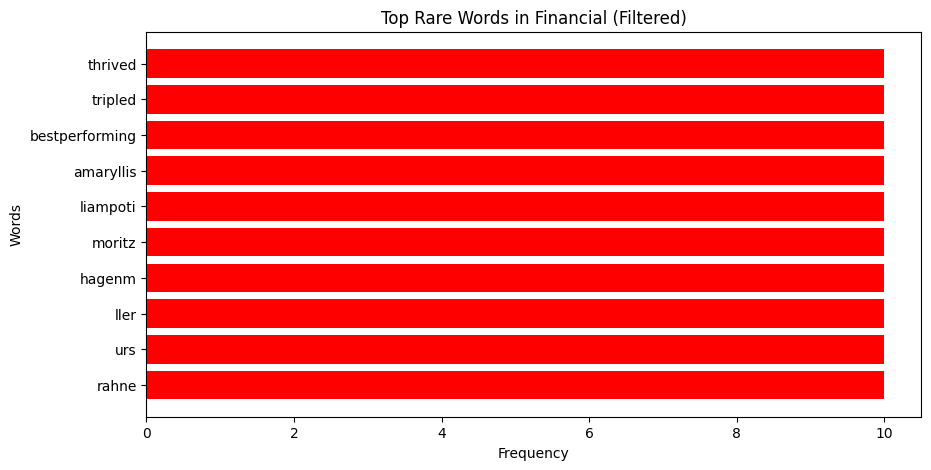

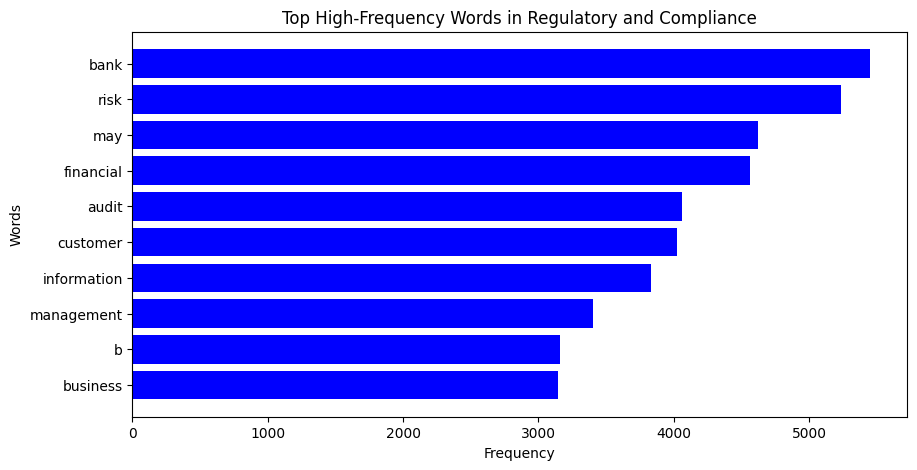

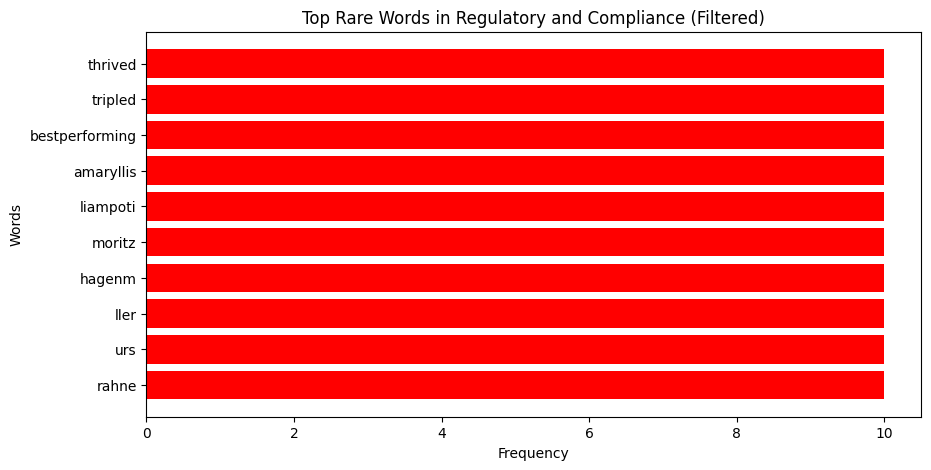

In [51]:
import spacy
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# Load SpaCy NLP model
nlp = spacy.load("en_core_web_sm")

# Increase SpaCy max length to avoid errors (but still use chunking)
nlp.max_length = 2_000_000  # Setting a higher limit, but chunking is still needed

# Define chunk size for processing large texts
CHUNK_SIZE = 500_000

# Define threshold for rare words
RARE_WORD_THRESHOLD = 10  # Words appearing <= 10 times

# Function to extract person names in chunks
def extract_person_names(text):
    person_names = set()
    text_length = len(text)

    for i in range(0, text_length, CHUNK_SIZE):
        chunk = text[i : i + CHUNK_SIZE]  # Process small chunks
        doc = nlp(chunk)
        person_names.update({ent.text.lower() for ent in doc.ents if ent.label_ == "PERSON"})

    return person_names

# Compute overall word frequency across all topics
word_freq_per_topic = {topic: Counter(text.split()) for topic, text in combined_texts.items()}
overall_word_counts = Counter()
for topic_counts in word_freq_per_topic.values():
    overall_word_counts.update(topic_counts)

# Extract names of people from the entire dataset
all_person_names = set()
for text in combined_texts.values():
    all_person_names.update(extract_person_names(text))  # Now processes in chunks

# Extract high-frequency and rare words, filtering out names
word_freq_data = []
rare_word_data = []

for topic, word_counts in word_freq_per_topic.items():
    sorted_words = word_counts.most_common()  # Sort words by frequency

    # Extract top 20 high-frequency words (excluding names)
    for word, count in sorted_words[:20]:
        if word not in all_person_names:  # Remove names
            word_freq_data.append((topic, word, count))

    # Extract rare words (words appearing <= threshold across all topics)
    rare_words = [word for word, count in overall_word_counts.items() if 2 <= count <= RARE_WORD_THRESHOLD]
    for word in rare_words[:20]:  # Limit rare words for visualization
        if word not in all_person_names:  # Remove names
            rare_word_data.append((topic, word))

# Create DataFrames
word_freq_df = pd.DataFrame(word_freq_data, columns=["Topic", "Word", "Count"])
rare_word_df = pd.DataFrame(rare_word_data, columns=["Topic", "Rare Word"])

# Save high-frequency and rare words to CSV
word_freq_df.to_csv("high_frequency_words.csv", index=False)
rare_word_df.to_csv("rare_words.csv", index=False)

# Display sample tables
display(word_freq_df.head(20))  # Show first 20 high-frequency words
display(rare_word_df.head(20))  # Show first 20 rare words

# Generate bar charts for selected topics
topics_to_plot = word_freq_df["Topic"].unique()[:3]  # Limit to 3 topics to prevent memory overload

for topic in topics_to_plot:
    df_high_freq = word_freq_df[word_freq_df["Topic"] == topic].nlargest(10, "Count")
    df_rare = rare_word_df[rare_word_df["Topic"] == topic].head(10)

    # High-Frequency Words Chart
    if not df_high_freq.empty:
        plt.figure(figsize=(10, 5))
        plt.barh(df_high_freq["Word"], df_high_freq["Count"], color="blue")
        plt.xlabel("Frequency")
        plt.ylabel("Words")
        plt.title(f"Top High-Frequency Words in {topic}")
        plt.gca().invert_yaxis()
        plt.show()

    # Rare Words Chart
    if not df_rare.empty:
        plt.figure(figsize=(10, 5))
        plt.barh(df_rare["Rare Word"], [RARE_WORD_THRESHOLD] * len(df_rare), color="red")
        plt.xlabel("Frequency")
        plt.ylabel("Words")
        plt.title(f"Top Rare Words in {topic} (Filtered)")
        plt.gca().invert_yaxis()
        plt.show()


### Generating output into csvs

In [39]:

# Save High-Frequency Words CSV
freq_words_df = pd.DataFrame.from_dict(
    {topic: dict(words) for topic, words in word_freq_per_topic.items()}, orient='index'
).fillna(0)

freq_words_df.to_csv("high_frequency_words.csv")

# Save TF-IDF Words CSV
tfidf_df.to_csv("tfidf_words.csv")

# Save Rare Words CSV
rare_words_df = pd.DataFrame.from_dict(rare_words, orient='index').transpose()
rare_words_df.to_csv("rare_words.csv")

print("✅ CSV files generated successfully!")


✅ CSV files generated successfully!


# Goal 1: Rule-Based Classification

It is intensive and expensive to pass all documents into Large Language Models (LLMs), this section explores the possibility of including a classification algorithm that can classify more obvious classifications. After this preliminary classification, we will then pass the remaining ones with lower confidence into our LLMs for classification.

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Adjusted TF-IDF settings
vectorizer = TfidfVectorizer(stop_words="english", 
                             max_features=2000,  # Reduce feature space
                             max_df=0.85,  # Ignore very frequent words appearing in >85% of docs
                             min_df=2,  # Ignore very rare words appearing in <2 documents
                             ngram_range=(1,2))  # Include bi-grams

# Convert topics into list format for vectorization
topic_texts = {topic: " ".join(text.split()[:10000]) for topic, text in combined_texts.items()}  # Limit words for memory

# Fit TF-IDF on topic texts
tfidf_matrix = vectorizer.fit_transform(topic_texts.values())
feature_names = vectorizer.get_feature_names_out()

# Get top 10 TF-IDF words per topic
tfidf_scores = {}
for idx, topic in enumerate(topic_texts.keys()):
    scores = tfidf_matrix[idx].toarray().flatten()
    top_words = sorted(zip(feature_names, scores), key=lambda x: x[1], reverse=True)[:10]
    tfidf_scores[topic] = top_words

# Convert to DataFrame for visualization
df_tfidf = pd.DataFrame.from_dict(tfidf_scores, orient="index", columns=[f"Word_{i+1}" for i in range(10)])
df_tfidf.to_csv("improved_tfidf_top_words.csv", index=True)

# Print results
print("\n🔹 **Improved TF-IDF Words Per Topic:**")
print(df_tfidf)



🔹 **Improved TF-IDF Words Per Topic:**
                                                              Word_1  \
Marketing and Public Communication         (ai, 0.35988185735564043)   
Financial                              (capital, 0.3881081034069811)   
Regulatory and Compliance           (regulation, 0.5842244410378777)   
Technology                                  (ai, 0.3664477543107853)   
Legal and Contractual                    (shall, 0.6387111716968409)   
Strategic                               (digital, 0.376946208256558)   
Administrative                       (employee, 0.48689139648205015)   
Operational                                 (fi, 0.4786420312449886)   

                                                              Word_2  \
Marketing and Public Communication    (loyalty, 0.35988185735564043)   
Financial                             (exposures, 0.334665540085556)   
Regulatory and Compliance                 (mas, 0.36183484085462064)   
Technology             

Based on TF-IDF top words still seem to have quite low TF-IDF similarity score, might be due to length of document or because of certain stop words still remaining in the corpus. The code below removes more of such stopwords for a cleaner output. We also attributed the low TF-IDF similarity scores to the fact that we are only running it for the main topics and not subtopics, which would be more specific.

### Improved TF-IDF Words

Over here, we improved the TF-IDF similarity scores by trying to remove stop words, common words appearing in multiple documents, as well as computing the scores for all subtopics, and only doing it for main topics if they do not contain subtopics. 

In [98]:
import spacy
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
import re

# Load spaCy model
nlp = spacy.load("en_core_web_sm")

# Function to clean text using NER & POS tagging (processing in chunks)
def clean_text(text, chunk_size=100000):
    """Processes text in chunks to avoid exceeding spaCy's max_length."""
    cleaned_words = []
    
    for i in range(0, len(text), chunk_size):
        chunk = text[i:i + chunk_size]  # Extract chunk
        doc = nlp(chunk)  # Process chunk with spaCy

        for token in doc:
            # Exclude Named Entities that are ORG (Organizations), GPE (Geographical Places), or LAW (Legal terms)
            if token.ent_type_ in {"ORG", "GPE", "LAW"}:
                continue  # Skip organizations, cities, countries, legal references
            
            # Exclude words that are ALL CAPS (acronyms, abbreviations)
            if token.text.isupper() and len(token.text) > 2:  # Avoid single-letter words like "I"
                continue  # Skip words like UOB, MAS, AMLCFT, etc.

            # Keep only **nouns & proper nouns**, exclude stopwords & punctuation
            if token.pos_ in {"NOUN", "PROPN"} and not token.is_stop and not token.is_punct:
                cleaned_words.append(token.text.lower())  # Convert to lowercase
    
    return " ".join(cleaned_words)  # Recombine cleaned words

# Apply cleaning to all subtopics
cleaned_texts = {topic: clean_text(text) for topic, text in combined_texts.items()}

# **🚀 Step 1: Use TF-IDF to Extract Important Words**
vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=3000,  # Limit vocabulary size
    max_df=0.75,  # Ignore very frequent words appearing in >75% of docs
    min_df=6,  # Ignore very rare words appearing in <6 docs
    ngram_range=(1, 3)  # Use unigrams, bigrams, trigrams
)

# Compute TF-IDF scores
tfidf_matrix = vectorizer.fit_transform(cleaned_texts.values())
feature_names = vectorizer.get_feature_names_out()

# Compute document frequency for each word
df_counts = Counter(feature_names)
df_threshold = len(combined_texts) * 0.50  # Appear in at least 50% of subtopics

# **🚀 Step 2: Automatically Remove Generic or Overused Words**
# - Words must be **important (high TF-IDF)**
# - Words must **not appear in most topics (to avoid generic words)**
# - Must be **NOUNS or PROPER NOUNS** (not generic words like "required", "useful")

filtered_features = [
    word for word in feature_names
    if df_counts[word] < df_threshold  # Appear in <50% of all topics (not generic)
]

# Re-run TF-IDF with refined vocabulary
vectorizer = TfidfVectorizer(
    stop_words="english",
    vocabulary=filtered_features,  # Use dynamically filtered words
    ngram_range=(1, 3)
)

tfidf_matrix = vectorizer.fit_transform(cleaned_texts.values())
feature_names = vectorizer.get_feature_names_out()

# Get top 10 TF-IDF words per subtopic
tfidf_scores = {}
top_keywords_per_topic = {}

for idx, topic in enumerate(cleaned_texts.keys()):
    scores = tfidf_matrix[idx].toarray().flatten()
    top_words = sorted(zip(feature_names, scores), key=lambda x: x[1], reverse=True)[:10]
    tfidf_scores[topic] = top_words
    top_keywords_per_topic[topic] = [word for word, score in top_words]  # Store just the keywords

# Convert to DataFrame for visualization
df_tfidf = pd.DataFrame.from_dict(tfidf_scores, orient="index", columns=[f"Word_{i+1}" for i in range(10)])
df_tfidf.to_csv("refined_tfidf_top_words.csv", index=True)

# Print results
print("\n🔹 **Refined TF-IDF Words Per Subtopic:**")
print(df_tfidf)



🔹 **Refined TF-IDF Words Per Subtopic:**
                                                                           Word_1  \
Marketing and Public Communication                  (loyalty, 0.6757462932709384)   
Risk Assessment Reports and Frameworks                 (rwa, 0.43156564084824434)   
Annual Reports                                         (sfrsi, 0.396819235783821)   
Financial Statements                                  (sfrsi, 0.3114810490714159)   
Investment and Market Research                      (outlook, 0.3468084859574872)   
Regulatory and Compliance                             (vote, 0.46966221551882936)   
Taxation                                     (tax treatment, 0.41537981490456366)   
Risk Management                               (merchant bank, 0.5076414942486142)   
Audit Reports                                          (acra, 0.6008916467887446)   
Consumer Finance                                        (uob, 0.5345234199254918)   
Financial Regulations  

We see that the TF-IDF scores are still very low, even for the top words.

In [ ]:
import os
import spacy
import pandas as pd
import re
import nltk
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import defaultdict, Counter
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

# Load NLP models & tools
nltk.download("wordnet")
nltk.download("omw-1.4")
nltk.download("stopwords")
nlp = spacy.load("en_core_web_sm")

# Initialize text preprocessing tools
lemmatizer = WordNetLemmatizer()
base_stopwords = set(stopwords.words("english"))  # Standard stopwords

# **Manually Define Common Bank & Financial Institution Names**
words_to_remove = {
    "sfrsi", "jan", "feb", "mar" ,"apr" ,"may", "jun", "jul", "aug", "sep", "oct", "nov", "dec",
}



# Domain-specific words to **always keep**
domain_specific_words = {"loan", "hedge", "compliance", "tax", "borrower", "derivatives", "equity"}

# -------------------------------------
# **Step 1: Function to Preprocess Text**
# -------------------------------------
def preprocess_text(text):
    """Lemmatizes text, removes stopwords, and excludes numbers/special characters."""
    words = text.split()
    clean_words = [
        lemmatizer.lemmatize(word.lower()) for word in words
        if word.lower() not in base_stopwords
        and word.lower() not in words_to_remove  # 
        and len(word) > 2
        and not re.search(r'\d', word)  # Exclude numbers
    ]
    return " ".join(clean_words)

# -------------------------------------
# **Step 2: Load & Process Documents**
# -------------------------------------
main_directory = "Cleaned_Data_v2"

# Dictionary to store text grouped by topics & subtopics
data = defaultdict(lambda: defaultdict(list))

# Traverse the folder structure
for main_topic in os.listdir(main_directory):
    main_topic_path = os.path.join(main_directory, main_topic)
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            relative_path = os.path.relpath(root, main_directory)  
            main_topic, *subtopic = relative_path.split(os.sep)

            subtopic_name = " - ".join(subtopic) if subtopic else main_topic  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                        # Preprocess text (lemmatization + cleaning)
                        cleaned_text = preprocess_text(content)
                        data[main_topic][subtopic_name].append(cleaned_text)

# Combine all text files under each subtopic into a single string
combined_texts = {subtopic: " ".join(contents) for topic, subtopics in data.items() for subtopic, contents in subtopics.items()}

# -------------------------------------
# **Step 3: Function to Clean Text with NER & POS**
# -------------------------------------
def clean_text(text, chunk_size=100000):
    """Processes text in chunks to avoid exceeding spaCy's max_length."""
    cleaned_words = []
    
    for i in range(0, len(text), chunk_size):
        chunk = text[i:i + chunk_size]  # Extract chunk
        doc = nlp(chunk)  # Process chunk with spaCy

        # Extract nouns & proper nouns, exclude stopwords & punctuation
        cleaned_words.extend([
            token.text.lower() for token in doc
            if token.pos_ in {"NOUN", "PROPN"}  # Keep nouns & proper nouns
            and not token.is_stop and not token.is_punct  # Remove stopwords & punctuation
            and len(token.text) > 2  # Exclude words < 3 characters
            and token.ent_type_ not in {"GPE", "ORG"}  # ✅ Remove companies, banks, and financial institutions
        ])
    
    return " ".join(cleaned_words)  # Recombine cleaned words

# Apply cleaning to all subtopics
cleaned_texts = {topic: clean_text(text) for topic, text in combined_texts.items()}

# -------------------------------------
# **Step 4: Compute TF-IDF Scores**
# -------------------------------------
vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=3000,  # Extract up to 3000 features (previously 3000)
    max_df=0.80,  # Ignore words appearing in >80% of docs
    min_df=4,  # Ignore rare words appearing in <4 docs
    ngram_range=(1, 2)  # Use unigrams, bigrams,
)

# Compute TF-IDF scores
tfidf_matrix = vectorizer.fit_transform(cleaned_texts.values())
feature_names = vectorizer.get_feature_names_out()

# Compute document frequency for each word
df_counts = Counter(feature_names)
df_threshold = len(combined_texts) * 0.50  # Appear in at least 50% of subtopics

# Filter high-frequency words that are NOT domain-specific
filtered_features = [
    word for word in feature_names if df_counts[word] < df_threshold or word in domain_specific_words
]

# Re-run TF-IDF with refined vocabulary
vectorizer = TfidfVectorizer(
    stop_words="english",
    vocabulary=filtered_features,  # Use refined feature list
    ngram_range=(1, 3)
)

tfidf_matrix = vectorizer.fit_transform(cleaned_texts.values())
feature_names = vectorizer.get_feature_names_out()

# Get top **100** TF-IDF words per subtopic
tfidf_scores = {}
for idx, topic in enumerate(cleaned_texts.keys()):
    scores = tfidf_matrix[idx].toarray().flatten()
    top_words = sorted(zip(feature_names, scores), key=lambda x: x[1], reverse=True)[:500]  # **Increased to 300**
    tfidf_scores[topic] = top_words

# -------------------------------------
# **Step 5: Save & Display Results**
# -------------------------------------
# Convert to DataFrame for visualization
df_tfidf = pd.DataFrame.from_dict(
    {topic: [word[0] for word in words] for topic, words in tfidf_scores.items()}, 
    orient="index", 
    columns=[f"Word_{i+1}" for i in range(500)]
)

# Save refined TF-IDF keywords
df_tfidf.to_csv("refined_tfidf_top_words_v6.csv", index=True)

# Print results
print("\n**Refined TF-IDF Words Per Subtopic:**")
print(df_tfidf)


[nltk_data] Downloading package wordnet to /Users/ivan/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/ivan/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/ivan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



**Refined TF-IDF Words Per Subtopic:**
                                           Word_1              Word_2  \
Marketing and Public Communication        loyalty           marketing   
Annual Reports                           exposure         credit risk   
Financial Statements                    allowance                 ecl   
Investment and Market Research            outlook           inflation   
Regulatory and Compliance                    vote            proposal   
Taxation                            tax treatment       trading stock   
Risk Management                          exposure                 rwa   
Audit Reports                                acra          engagement   
Consumer Finance                              uob     credit facility   
Financial Regulations                      holder  market participant   
Anti Money Laundering               merchant bank              amlcft   
Technology                                   tech               space   
Loans      

We tried the refined TF-IDF words, and it did not perform as well for our classifier, hence we will consider taking a combination of TF-IDF and Bigram, for the top 150 words.

### Final Top 150 TF-IDF-Bigram words

This final csv file contains the top 150 words of each subtopic sorted by its rank. The resultant file is referenced for the Rule-Based Classification.

In [16]:
import os
import pandas as pd
import re
import time
import numpy as np
from collections import defaultdict
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import mutual_info_classif

# -------------------------------------
#  **Step 1: Load & Process Documents**
# -------------------------------------

# Initialize Lemmatizer and Stopwords
lemmatizer = WordNetLemmatizer()
base_stopwords = set(stopwords.words("english"))

# Function to preprocess text
def preprocess_text(text):
    """Lemmatizes text, removes stopwords, and excludes numbers/special characters."""
    words = text.split()
    clean_words = [
        lemmatizer.lemmatize(word.lower()) for word in words
        if word.lower() not in base_stopwords
        and len(word) > 2
        and not re.search(r'\d', word)  # Exclude numbers
    ]
    return " ".join(clean_words)

# Path to main data folder
main_directory = "Cleaned_Data_v6"

# Dictionary to store text grouped by topics & subtopics
data = defaultdict(lambda: defaultdict(list))

# Traverse folder structure
for main_topic in os.listdir(main_directory):
    main_topic_path = os.path.join(main_directory, main_topic)
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            relative_path = os.path.relpath(root, main_directory)  
            main_topic, *subtopic = relative_path.split(os.sep)

            subtopic_name = " - ".join(subtopic) if subtopic else main_topic  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                        cleaned_text = preprocess_text(content)
                        if cleaned_text:  # Ensure text is not empty after preprocessing
                            data[main_topic][subtopic_name].append(cleaned_text)

# Combine all text files per subtopic
combined_texts = {subtopic: " ".join(contents) for topic, subtopics in data.items() for subtopic, contents in subtopics.items() if contents}

# Convert to DataFrame for processing
df_data = pd.DataFrame(list(combined_texts.items()), columns=["Subtopic", "Text"])

if df_data.empty:
    raise ValueError("No valid text data found after preprocessing. Check input files.")

print(f"✅ Loaded {len(df_data)} subtopics with processed text.")

# -------------------------------------
#  **Step 2: Compute TF-IDF Scores**
# -------------------------------------

tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=3000,  # Reduce feature space
    max_df=0.85,  # Ignore overly common words
    min_df=3,  # Ignore very rare words
    ngram_range=(1, 2)  # Use unigrams and bigrams
)

try:
    tfidf_matrix = tfidf_vectorizer.fit_transform(df_data["Text"])

    # ✅ Check if TF-IDF matrix is empty before proceeding
    if tfidf_matrix.shape[0] == 0 or tfidf_matrix.shape[1] == 0:
        raise ValueError("TF-IDF matrix is empty. Check preprocessing and vectorizer settings.")

    tfidf_vocab = tfidf_vectorizer.get_feature_names_out()

    # Extract top TF-IDF words per subtopic
    tfidf_scores = {}
    for idx, subtopic in enumerate(df_data["Subtopic"]):
        scores = tfidf_matrix[idx].toarray().flatten()
        top_words = sorted(zip(tfidf_vocab, scores), key=lambda x: x[1], reverse=True)[:100]
        tfidf_scores[subtopic] = top_words

    print(f"✅ Computed TF-IDF scores for {len(tfidf_scores)} subtopics.")

except Exception as e:
    print(f"❌ TF-IDF computation failed: {e}")
    tfidf_scores = {}

# -------------------------------------
#  **Step 3: Extract Bigrams**
# -------------------------------------

bigram_vectorizer = TfidfVectorizer(
    stop_words="english",
    ngram_range=(2, 2),  # Only bigrams
    max_features=1500
)

try:
    bigram_matrix = bigram_vectorizer.fit_transform(df_data["Text"])
    bigram_vocab = bigram_vectorizer.get_feature_names_out()

    # Extract top bigrams per subtopic
    bigram_scores = {}
    for idx, subtopic in enumerate(df_data["Subtopic"]):
        scores = bigram_matrix[idx].toarray().flatten()
        top_bigrams = sorted(zip(bigram_vocab, scores), key=lambda x: x[1], reverse=True)[:50]
        bigram_scores[subtopic] = top_bigrams

    print(f"✅ Extracted top bigrams for {len(bigram_scores)} subtopics.")

except Exception as e:
    print(f"❌ Bigram extraction failed: {e}")
    bigram_scores = {}

# -------------------------------------
#  **Step 4: Merge TF-IDF and Bigrams with Uniform Length**
# -------------------------------------

final_keywords = {}

for subtopic in df_data["Subtopic"]:
    tfidf_words = [word[0] for word in tfidf_scores.get(subtopic, [])]
    bigram_words = [word[0] for word in bigram_scores.get(subtopic, [])]

    # Merge TF-IDF and bigrams (remove duplicates, keep order)
    merged_keywords = list(dict.fromkeys(tfidf_words + bigram_words))

    # Ensure exactly 200 words per subtopic
    if len(merged_keywords) < 200:
        merged_keywords += ["N/A"] * (200 - len(merged_keywords))  # Pad with "N/A"
    else:
        merged_keywords = merged_keywords[:200]  # Trim to 200

    final_keywords[subtopic] = merged_keywords

print(f"✅ Merged TF-IDF and bigrams for {len(final_keywords)} subtopics.")

# -------------------------------------
#  **Step 5: Convert to DataFrame & Export**
# -------------------------------------

df_final = pd.DataFrame.from_dict(
    final_keywords, 
    orient="index",
    columns=[f"Word_{i}" for i in range(1, 201)]
)

df_final.to_csv("refined_tfidf_bigrams_v5.csv", index=True)

print(f"✅ Exported refined keywords to CSV.")


✅ Loaded 20 subtopics with processed text.
✅ Computed TF-IDF scores for 20 subtopics.
✅ Extracted top bigrams for 20 subtopics.
✅ Merged TF-IDF and bigrams for 20 subtopics.
✅ Exported refined keywords to CSV.


### Classification Metrics

In this section, we experimented with the rules and generated the classification metrics and confusion matrices for comparison, to optimise and develop our rule-based classification algorithm.

✅ Loaded 22 topics from extracted words.
✅ Classified 55 documents.
🔸 306 documents (84.76%) require LLM intervention.
✅ Results saved as classification_results_20250218_164835.csv
🔸 LLM-needed cases saved as llm_needed_cases_20250218_164835.csv

🔹 Classification Performance Report (Excluding LLM Needed):
                                    precision  recall  f1-score  support
Administrative                              0       1         0        3
Annual Reports                              0       0         0       12
Anti Money Laundering                       0       0         0        1
Client Agreements                           0       0         0        2
Employment                                  1       1         1        2
Financial Statements                        1       0         0       13
Investment and Market Research              0       1         0        2
Loans                                       1       1         1        1
Marketing and Public Communication  

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

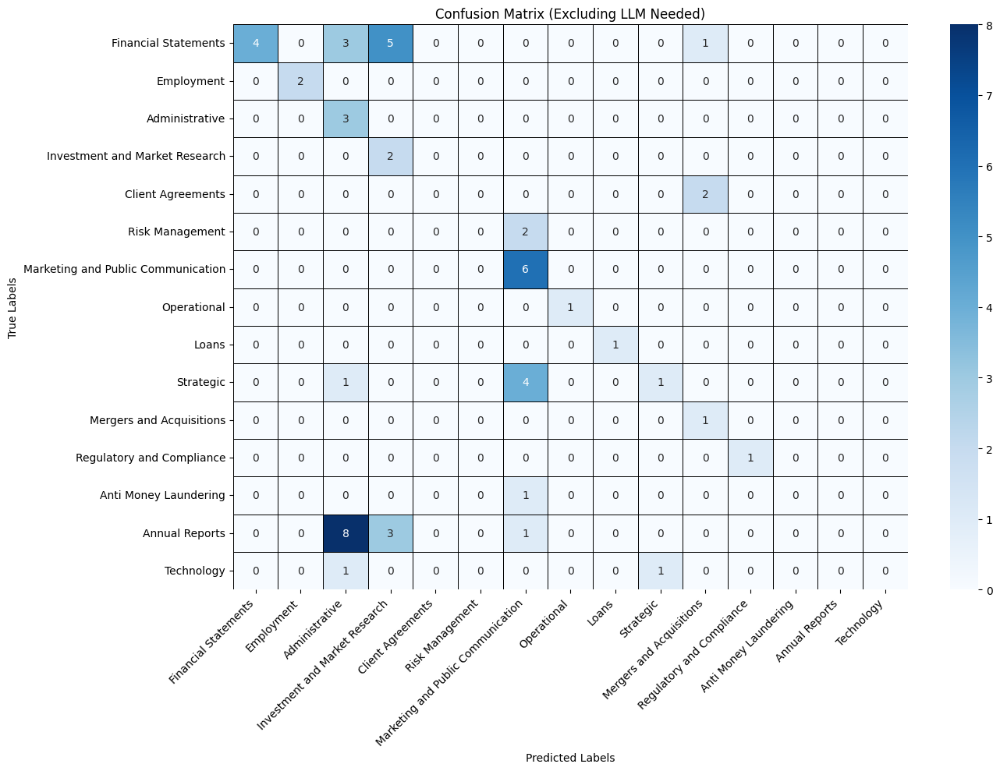

In [121]:
import os
import pandas as pd
import ast
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.metrics import classification_report, confusion_matrix
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

# Load NLTK Lemmatizer (Faster than spaCy for our needs)
lemmatizer = WordNetLemmatizer()

# -------------------------------------
# 🔹 **Step 1: Load Extracted TF-IDF Words**
# -------------------------------------
top_keywords_per_topic = {}
main_topics = set()

df = pd.read_csv("refined_tfidf_top_words.csv")

for index, row in df.iterrows():
    topic_name = row.iloc[0].strip()  # Ensure no extra spaces
    keywords = []
    
    for col in df.columns[1:]:  # Skip the topic name column
        if pd.notna(row[col]):  # Ensure it's not empty
            word_tuple = ast.literal_eval(row[col])  # Convert "(word, score)" to a tuple
            keywords.append(word_tuple[0])  # Extract just the word
    
    if keywords:
        top_keywords_per_topic[topic_name] = keywords[:50]  # Store top 50 words
        main_topics.add(topic_name.split("/")[0])  # Store main topics for hierarchical classification

print(f"✅ Loaded {len(top_keywords_per_topic)} topics from extracted words.")

# -------------------------------------
# 🔹 **Step 2: Fast Tokenization & Preprocessing**
# -------------------------------------
def fast_tokenize(text):
    """Faster tokenizer using regex-based text processing with lemmatization."""
    tokens = word_tokenize(text.lower())  # Tokenize text
    lemmatized_tokens = {lemmatizer.lemmatize(token) for token in tokens if token.isalpha()}  # Keep only words
    return lemmatized_tokens

# -------------------------------------
# 🔹 **Step 3: Optimized Rule-Based Classification**
# -------------------------------------
def classify_document(text):
    """Classifies a document using hierarchical TF-IDF rule-based matching with optimized confidence."""
    doc_words = fast_tokenize(text)  # Use fast tokenizer
    doc_length = len(doc_words)

    # ✅ If document is too short, defer to LLM
    if doc_length < 50:
        return "LLM Needed", 0.0  

    best_main_match = None
    best_main_score = 0
    best_sub_match = None
    best_sub_score = 0

    # ✅ First Pass: Identify the **Main Topic**
    for topic in main_topics:
        topic_keywords = [word for subtopic in top_keywords_per_topic if subtopic.startswith(topic) for word in top_keywords_per_topic[subtopic]]
        topic_keywords = set(topic_keywords)

        weighted_score = sum(1.0 * (0.90 ** idx) for idx, word in enumerate(topic_keywords) if word in doc_words)
        max_possible_score = sum(1.0 * (0.90 ** idx) for idx in range(len(topic_keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0

        if normalized_score > best_main_score:
            best_main_score = normalized_score
            best_main_match = topic

    # ✅ If no confident main topic is found, defer to LLM
    if best_main_score < 0.7:
        return "LLM Needed", best_main_score

    # ✅ Second Pass: Identify the **Subtopic** within the main topic
    for topic, keywords in top_keywords_per_topic.items():
        if not topic.startswith(best_main_match):  # Skip unrelated topics
            continue

        weighted_score = sum(1.0 * (0.95 ** idx) for idx, word in enumerate(keywords) if word in doc_words)
        max_possible_score = sum(1.0 * (0.95 ** idx) for idx in range(len(keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0

        if normalized_score > best_sub_score:
            best_sub_score = normalized_score
            best_sub_match = topic

    # ✅ If subtopic confidence is too low, classify at the main topic level
    final_category = best_sub_match if best_sub_score >= 0.6 else best_main_match
    final_score = max(best_main_score, best_sub_score)

    return final_category, final_score

# -------------------------------------
# 🔹 **Step 4: Process All Documents**
# -------------------------------------
actual_topics = []
predicted_topics = []
document_confidences = []
document_filenames = []

llm_needed_actual = []
llm_needed_filenames = []
llm_needed_confidences = []

data_dir = "Cleaned_Data_v2"

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()  
            
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()

                    # Classify document
                    predicted_category, confidence = classify_document(content)

                    # Extract only the subtopic name for evaluation consistency
                    sub_topic_cleaned = sub_topic.split("/")[-1]  

                    if predicted_category == "LLM Needed":
                        llm_needed_actual.append(sub_topic_cleaned)
                        llm_needed_filenames.append(file)
                        llm_needed_confidences.append(confidence)
                    else:
                        actual_topics.append(sub_topic_cleaned)
                        predicted_topics.append(predicted_category)
                        document_confidences.append(confidence)
                        document_filenames.append(file)

print(f"✅ Classified {len(actual_topics)} documents.")
print(f"🔸 {len(llm_needed_actual)} documents ({len(llm_needed_actual) / (len(actual_topics) + len(llm_needed_actual)) * 100:.2f}%) require LLM intervention.")

# -------------------------------------
# 🔹 **Step 5: Save Classification Results**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")  
output_filename = f"classification_results_{timestamp}.csv"

df_results = pd.DataFrame({
    "Filename": document_filenames,
    "Actual Topic": actual_topics,
    "Predicted Topic": predicted_topics,
    "Confidence": document_confidences
})
df_results.to_csv(output_filename, index=False)
print(f"✅ Results saved as {output_filename}")

# Save LLM-needed cases separately
if llm_needed_actual:
    df_llm = pd.DataFrame({
        "Filename": llm_needed_filenames,
        "Actual Topic": llm_needed_actual, 
        "Confidence": llm_needed_confidences
    })
    llm_filename = f"llm_needed_cases_{timestamp}.csv"
    df_llm.to_csv(llm_filename, index=False)
    print(f"🔸 LLM-needed cases saved as {llm_filename}")

# -------------------------------------
# 🔹 **Step 6: Print & Save Classification Report**
# -------------------------------------
print("\n🔹 Classification Performance Report (Excluding LLM Needed):")
report_df = pd.DataFrame(classification_report(actual_topics, predicted_topics, output_dict=True)).transpose()
report_df.to_csv(f"classification_report_{timestamp}.csv", index=True)
print(report_df)

# -------------------------------------
# 🔹 **Step 7: Improved Confusion Matrix**
# -------------------------------------
plt.figure(figsize=(14, 10))  
conf_matrix = confusion_matrix(actual_topics, predicted_topics, labels=list(set(actual_topics)))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(set(actual_topics)), 
            yticklabels=list(set(actual_topics)),
            linewidths=0.5, linecolor='black')  

plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")  
plt.yticks(rotation=0)  
plt.tight_layout()
plt.show()


 Loaded 22 topics from extracted words.
 Classified 6 documents with high confidence.
 355 documents (98.34%) require LLM intervention.

 Classification Performance Report (Excluding LLM Needed):
                                    precision    recall  f1-score   support
Administrative                       1.000000  1.000000  1.000000  1.000000
Marketing and Public Communication   0.500000  1.000000  0.666667  2.000000
Strategic                            0.000000  0.000000  0.000000  2.000000
Technology                           1.000000  1.000000  1.000000  1.000000
accuracy                             0.666667  0.666667  0.666667  0.666667
macro avg                            0.625000  0.750000  0.666667  6.000000
weighted avg                         0.500000  0.666667  0.555556  6.000000


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

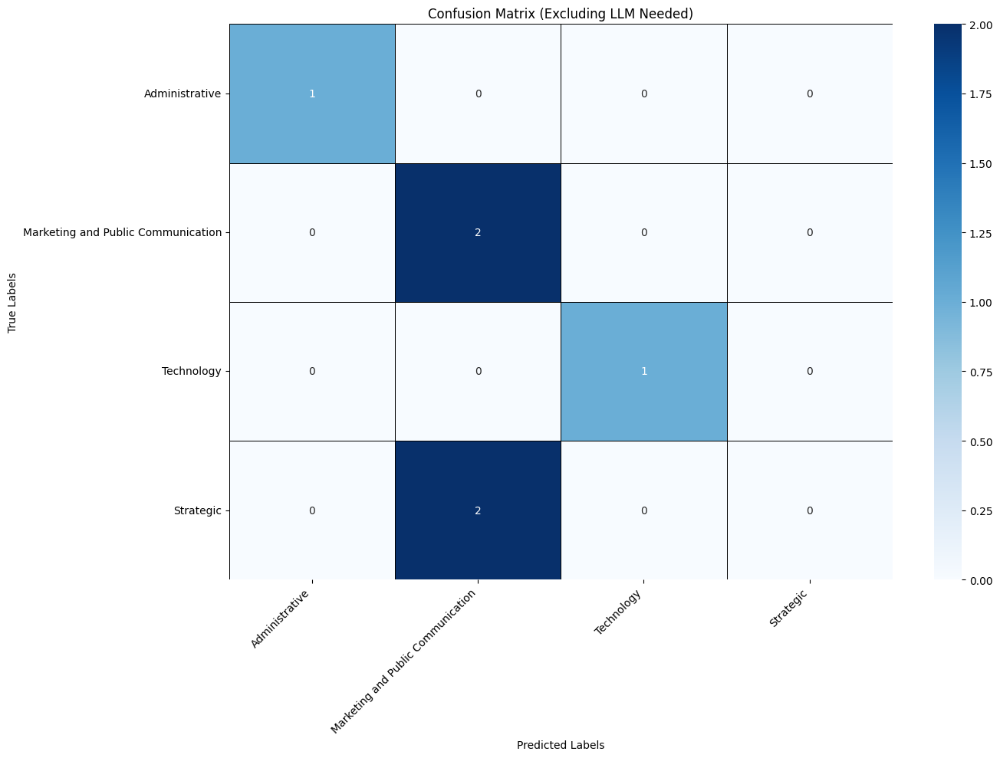

In [4]:
import os
import pandas as pd
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.metrics import classification_report, confusion_matrix
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

# Load NLTK Lemmatizer (Faster than spaCy for our needs)
lemmatizer = WordNetLemmatizer()

# -------------------------------------
#  **Step 1: Load Extracted TF-IDF Words (Now 100 words)**
# -------------------------------------
top_keywords_per_topic = {}
main_topics = set()

df = pd.read_csv("refined_tfidf_top_words_v3.csv")  # Using version with 100 words

for index, row in df.iterrows():
    topic_name = row.iloc[0].strip()
    keywords = [row[col] for col in df.columns[1:] if pd.notna(row[col])]
    
    if keywords:
        top_keywords_per_topic[topic_name] = keywords[:100]  # Store top 100 words
        main_topics.add(topic_name.split("/")[0])  # Store main topics for hierarchical classification

print(f" Loaded {len(top_keywords_per_topic)} topics from extracted words.")

# -------------------------------------
#  **Step 2: Fast Tokenization & Preprocessing**
# -------------------------------------
def fast_tokenize(text):
    """Faster tokenizer using regex-based text processing with lemmatization."""
    tokens = word_tokenize(text.lower())  # Tokenize text
    lemmatized_tokens = {lemmatizer.lemmatize(token) for token in tokens if token.isalpha()}  # Keep only words
    return lemmatized_tokens

# -------------------------------------
#  **Step 3: Adjusted Rule-Based Classification**
# -------------------------------------
def classify_document(text):
    """Classifies a document using rule-based classification with improved confidence filtering."""
    doc_words = fast_tokenize(text)  
    doc_length = len(doc_words)

    #  If document is too short, defer to LLM
    if doc_length < 100:
        return "LLM Needed", 0.0  

    best_main_match = None
    best_main_score = 0
    best_sub_match = None
    best_sub_score = 0
    match_counts = {}

    #  First Pass: Identify the **Main Topic**
    for topic in main_topics:
        topic_keywords = [word for subtopic in top_keywords_per_topic if subtopic.startswith(topic) for word in top_keywords_per_topic[subtopic]]
        
        weighted_score = sum(1.0 * (0.90 ** idx) for idx, word in enumerate(topic_keywords) if word in doc_words)
        max_possible_score = sum(1.0 * (0.90 ** idx) for idx in range(len(topic_keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0

        match_counts[topic] = sum(1 for word in topic_keywords if word in doc_words)

        if normalized_score > best_main_score and match_counts[topic] >= 7:  # Increased match threshold
            best_main_score = normalized_score
            best_main_match = topic

    #  If no confident main topic is found, defer to LLM
    if best_main_score < 0.80:  # Lowered threshold from 0.85 → 0.80
        return "LLM Needed", best_main_score

    #  Second Pass: Identify the **Subtopic** within the main topic
    for topic, keywords in top_keywords_per_topic.items():
        if not topic.startswith(best_main_match):  # Skip unrelated topics
            continue

        weighted_score = sum(1.0 * (0.92 ** idx) for idx, word in enumerate(keywords) if word in doc_words)
        max_possible_score = sum(1.0 * (0.92 ** idx) for idx in range(len(keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0

        match_counts[topic] = sum(1 for word in keywords if word in doc_words)

        if normalized_score > best_sub_score and match_counts[topic] >= 7:
            best_sub_score = normalized_score
            best_sub_match = topic

    #  If subtopic confidence is too low, classify at the main topic level
    final_category = best_sub_match if best_sub_score >= 0.75 else best_main_match
    final_score = max(best_main_score, best_sub_score)

    #  Final strict filter: If confidence < 0.80, defer to LLM to ensure high precision
    if final_score < 0.80:
        return "LLM Needed", final_score

    return final_category, final_score

# -------------------------------------
#  **Step 4: Process All Documents**
# -------------------------------------
actual_topics = []
predicted_topics = []
document_confidences = []
document_filenames = []
llm_needed_actual = []
llm_needed_filenames = []
llm_needed_confidences = []

data_dir = "Cleaned_Data_v2"

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()  
            
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()

                    # Classify document
                    predicted_category, confidence = classify_document(content)

                    # Extract only the subtopic name for evaluation consistency
                    sub_topic_cleaned = sub_topic.split("/")[-1]  

                    if predicted_category == "LLM Needed":
                        llm_needed_actual.append(sub_topic_cleaned)
                        llm_needed_filenames.append(file)
                        llm_needed_confidences.append(confidence)
                    else:
                        actual_topics.append(sub_topic_cleaned)
                        predicted_topics.append(predicted_category)
                        document_confidences.append(confidence)
                        document_filenames.append(file)

print(f" Classified {len(actual_topics)} documents with high confidence.")
print(f" {len(llm_needed_actual)} documents ({len(llm_needed_actual) / (len(actual_topics) + len(llm_needed_actual)) * 100:.2f}%) require LLM intervention.")

# -------------------------------------
#  **Step 5: Save Classification Report**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")  
df_results = pd.DataFrame({
    "Filename": document_filenames,
    "Actual Topic": actual_topics,
    "Predicted Topic": predicted_topics,
    "Confidence": document_confidences
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)

print("\n Classification Performance Report (Excluding LLM Needed):")
report_df = pd.DataFrame(classification_report(actual_topics, predicted_topics, output_dict=True)).transpose()
report_df.to_csv(f"classification_report_{timestamp}.csv", index=True)
print(report_df)

# -------------------------------------
#  **Step 6: Improved Confusion Matrix**
# -------------------------------------
plt.figure(figsize=(14, 10))  
conf_matrix = confusion_matrix(actual_topics, predicted_topics, labels=list(set(actual_topics)))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(set(actual_topics)), 
            yticklabels=list(set(actual_topics)),
            linewidths=0.5, linecolor='black')  

plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")  
plt.yticks(rotation=0)  
plt.tight_layout()
plt.show()


Comments: Only 6 were classified, yet it is still not precise enough, some are still not having precision = 1. From here on, we decided to use the TF-IDF merged with bigrams.

✅ Loaded 21 topics from extracted words.
✅ Classified 111 documents.
💨 250 documents (69.25%) require LLM intervention.

🔹 Classification Performance Report (Excluding LLM Needed):
                                    precision    recall  f1-score     support
Administrative                       1.000000  1.000000  1.000000    3.000000
Anti Money Laundering                0.761905  1.000000  0.864865   16.000000
Client Agreements                    0.833333  0.833333  0.833333    6.000000
Derivatives                          1.000000  1.000000  1.000000    3.000000
Employment                           1.000000  1.000000  1.000000    2.000000
Financial Regulations                0.000000  0.000000  0.000000    4.000000
Financial Statements                 1.000000  0.980392  0.990099   51.000000
Loans                                0.800000  1.000000  0.888889    4.000000
Marketing and Public Communication   1.000000  1.000000  1.000000    6.000000
Mergers and Acquisitions             0.

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

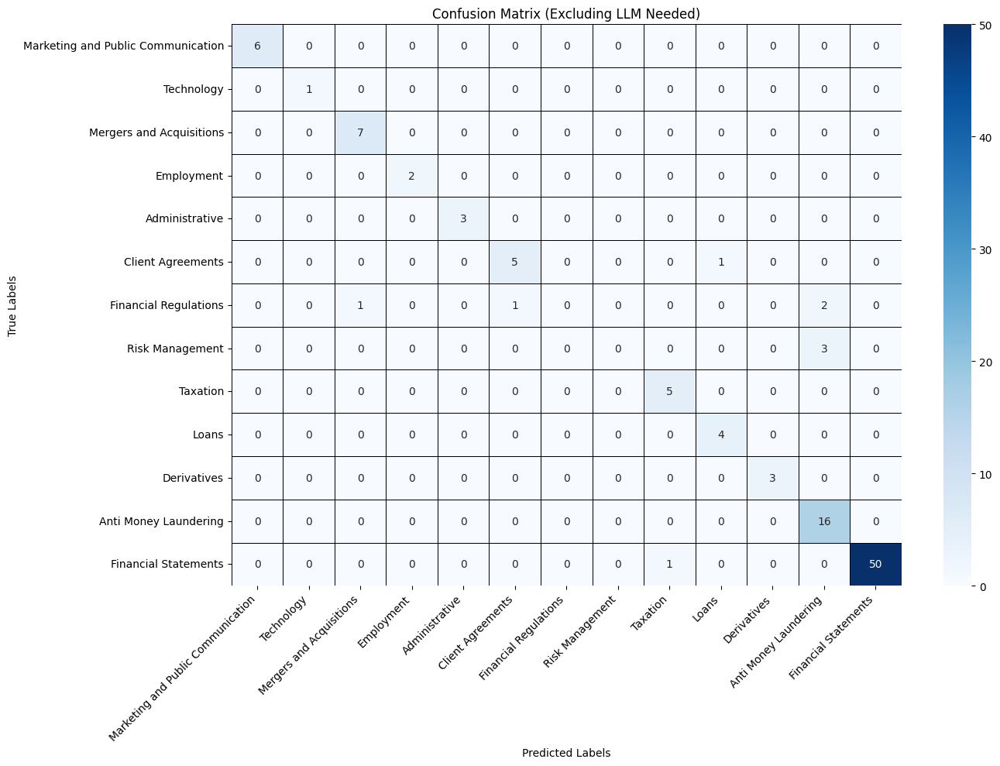

In [ ]:
import os
import pandas as pd
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.metrics import classification_report, confusion_matrix
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer

# Load NLTK Lemmatizer
lemmatizer = WordNetLemmatizer()

# -------------------------------------
# 🔹 **Step 1: Load Extracted TF-IDF + Bigrams**
# -------------------------------------
top_keywords_per_topic = {}
main_topics = set()

# Load refined TF-IDF bigrams file
df = pd.read_csv("refined_tfidf_bigrams_v2.csv")  

for index, row in df.iterrows():
    topic_name = row.iloc[0].strip()
    keywords = [row[col] for col in df.columns[1:] if pd.notna(row[col])]
    
    if keywords:
        top_keywords_per_topic[topic_name] = keywords[:150]  
        main_topics.add(topic_name.split("/")[0])  

print(f"✅ Loaded {len(top_keywords_per_topic)} topics from extracted words.")

# -------------------------------------
# 🔹 **Step 2: Tokenization & Preprocessing**
# -------------------------------------
vectorizer = CountVectorizer(
    stop_words="english",
    lowercase=True,
    token_pattern=r"(?u)\b\w+\b",  
    ngram_range=(1, 2)  
)

def fast_tokenize(text):
    """Tokenizes text using CountVectorizer to include both words & bigrams."""
    return set(vectorizer.build_analyzer()(text))

# -------------------------------------
# 🔹 **Step 3: Adjusted Rule-Based Classification**
# -------------------------------------
low_precision_categories = {
    "Annual Reports", "Financial Regulations", "Investment and Market Research", 
    "Strategic", "Risk Management", "Non-Disclosure Agreements (NDA)", "Operational",
    "Partnerships", "Regulatory and Compliance", "Audit Reports", "Consumer Finance"
}  

# Ensure Risk Management is only classified if it's 20% stronger than the next best category
STRICT_CATEGORIES = {'Risk Management', 'Financial Regulations'}
RISK_MANAGEMENT_THRESHOLD = 40  # Increased match threshold
CONFIDENCE_MARGIN = 1.4  # At least 40% stronger than the next best match


def classify_document(text):
    """Classifies a document using an enhanced rule-based system with stricter confidence filtering."""
    
    doc_words = fast_tokenize(text)  
    doc_length = len(doc_words)

    # ✅ If document is too short, defer to LLM
    if doc_length < 100:
        return "LLM Needed", 0.0  

    best_main_match, best_main_score = None, 0
    second_best_score = 0  # Track second-best topic confidence
    best_sub_match, best_sub_score = None, 0

    # ✅ First Pass: Identify the **Main Topic**
    for topic in main_topics:
        topic_keywords = set(word for subtopic in top_keywords_per_topic if subtopic.startswith(topic) for word in top_keywords_per_topic[subtopic])
        matched_words = doc_words.intersection(topic_keywords)

        weighted_score = sum(1.0 * (0.85 ** idx) for idx, word in enumerate(matched_words))
        max_possible_score = sum(1.0 * (0.85 ** idx) for idx in range(len(topic_keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0

        if normalized_score > best_main_score and len(matched_words) >= 30:
            second_best_score = best_main_score  # Update second-best score
            best_main_score = normalized_score
            best_main_match = topic

    # ✅ Ensure Risk Management is at least 20% stronger than second-best topic
    if best_main_match in STRICT_CATEGORIES and best_main_score < second_best_score * CONFIDENCE_MARGIN:
        return "LLM Needed", best_main_score

    # ✅ If no confident main topic is found, defer to LLM
    if best_main_score < 0.999 or best_main_match in low_precision_categories:
        return "LLM Needed", best_main_score

    return best_main_match, best_main_score

# -------------------------------------
# 🔹 **Step 4: Process All Documents**
# -------------------------------------
actual_topics, predicted_topics, document_confidences, document_filenames = [], [], [], []
llm_needed_actual, llm_needed_filenames, llm_needed_confidences = [], [], []

data_dir = "Cleaned_Data_v3"

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()  
            
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()

                    # Classify document
                    predicted_category, confidence = classify_document(content)
                    sub_topic_cleaned = sub_topic.split("/")[-1]  

                    if predicted_category == "LLM Needed":
                        llm_needed_actual.append(sub_topic_cleaned)
                        llm_needed_filenames.append(file)
                        llm_needed_confidences.append(confidence)
                    else:
                        actual_topics.append(sub_topic_cleaned)
                        predicted_topics.append(predicted_category)
                        document_confidences.append(confidence)
                        document_filenames.append(file)

print(f"✅ Classified {len(actual_topics)} documents.")
print(f"💨 {len(llm_needed_actual)} documents ({len(llm_needed_actual) / (len(actual_topics) + len(llm_needed_actual)) * 100:.2f}%) require LLM intervention.")

# -------------------------------------
# 🔹 **Step 5: Save Classification Report & Confusion Matrix**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")  
df_results = pd.DataFrame({
    "Filename": document_filenames,
    "Actual Topic": actual_topics,
    "Predicted Topic": predicted_topics,
    "Confidence": document_confidences
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)

print("\n🔹 Classification Performance Report (Excluding LLM Needed):")
report_df = pd.DataFrame(classification_report(actual_topics, predicted_topics, output_dict=True)).transpose()
report_df.to_csv(f"classification_report_{timestamp}.csv", index=True)
print(report_df)

# Generate Confusion Matrix
plt.figure(figsize=(14, 10))  
conf_matrix = confusion_matrix(actual_topics, predicted_topics, labels=list(set(actual_topics)))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(set(actual_topics)), 
            yticklabels=list(set(actual_topics)),
            linewidths=0.5, linecolor='black')  

plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")  
plt.yticks(rotation=0)  
plt.tight_layout()
plt.show()


**Analysis**: While the above did decent, we faced the issue where confidence was high, but precision still was not there. This was attributed to the way confidence was being calculated, which failed to consider and account for the length of the document. Longer documents definitely had a higher confidence, just because it had more words and a higher chance of containing those words. This might not be the most ideal way of giving the score since it gives us the illusion that confidence is high but it is not actually being able to classify well.

### Final Rule Based Classification Results

✅ Loaded 20 topics from extracted words.
✅ Classified 60 documents.
💨 301 documents (83.38%) require LLM intervention.

🔹 Classification Performance Report (Excluding LLM Needed):
                                    precision    recall  f1-score    support
Administrative                       1.000000  1.000000  1.000000   1.000000
Annual Reports                       1.000000  0.800000  0.888889  10.000000
Audit Reports                        0.600000  1.000000  0.750000   3.000000
Consumer Finance                     1.000000  1.000000  1.000000   4.000000
Employment                           1.000000  1.000000  1.000000   3.000000
Financial Regulations                1.000000  0.333333  0.500000   3.000000
Investment and Market Research       0.750000  1.000000  0.857143   3.000000
Marketing and Public Communication   1.000000  1.000000  1.000000   6.000000
Non-Disclosure Agreements (NDA)      0.875000  1.000000  0.933333   7.000000
Risk Management                      1.000000  1.0

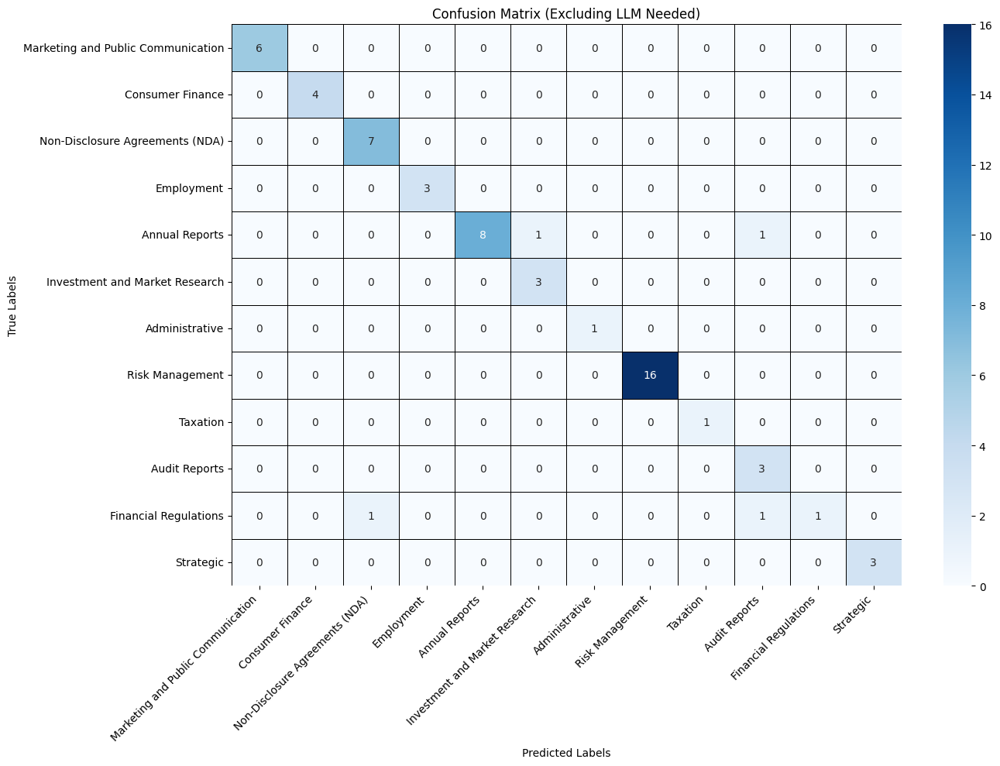

In [ ]:
import os
import pandas as pd
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.metrics import classification_report, confusion_matrix
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
import math

# Load NLTK Lemmatizer
lemmatizer = WordNetLemmatizer()

# -------------------------------------
# 🔹 **Step 1: Load Extracted TF-IDF + Bigrams**
# -------------------------------------
top_keywords_per_topic = {}
main_topics = set()

# Load refined TF-IDF bigrams file
df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  

for index, row in df.iterrows():
    topic_name = row.iloc[0].strip()
    keywords = [row[col] for col in df.columns[1:] if pd.notna(row[col])]
    
    if keywords:
        top_keywords_per_topic[topic_name] = keywords[:150]  
        main_topics.add(topic_name.split("/")[0])  

print(f" Loaded {len(top_keywords_per_topic)} topics from extracted words.")

# -------------------------------------
# 🔹 **Step 2: Tokenization & Preprocessing**
# -------------------------------------
vectorizer = CountVectorizer(
    stop_words="english",
    lowercase=True,
    token_pattern=r"(?u)\b\w+\b",  
    ngram_range=(1, 2)  
)

def fast_tokenize(text):
    """Tokenizes text using CountVectorizer to include both words & bigrams."""
    return set(vectorizer.build_analyzer()(text))

# -------------------------------------
# 🔹 **Step 3: Adjusted Rule-Based Classification**
# -------------------------------------
low_precision_categories = {}  

# Include strict categories here if we wish to have higher confidence for certain topics.
STRICT_CATEGORIES = {}
CONFIDENCE_MARGIN = 1.0  

def apply_length_penalty(score, doc_length):
    """Applies a logarithmic penalty for long documents to prevent inflated confidence."""
    return score / (1 + math.log(1 + doc_length)/70)

def classify_document(text):
    """Classifies a document using an enhanced rule-based system with stricter confidence filtering."""
    
    doc_words = fast_tokenize(text)  
    doc_length = len(doc_words)

    #  If document is too short, defer to LLM
    if doc_length < 100:
        return "LLM Needed", 0.0  

    best_main_match, best_main_score = None, 0
    second_best_score = 0  # Track second-best topic confidence
    
    #  First Pass: Identify the **Main Topic**
    for topic in main_topics:
        topic_keywords = set(word for subtopic in top_keywords_per_topic if subtopic.startswith(topic) for word in top_keywords_per_topic[subtopic])
        matched_words = doc_words.intersection(topic_keywords)

        weighted_score = sum(1.0 * (0.85 ** idx) for idx, word in enumerate(matched_words))
        max_possible_score = sum(1.0 * (0.85 ** idx) for idx in range(len(topic_keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0
        
        #  Apply length penalty
        adjusted_score = apply_length_penalty(normalized_score, doc_length)

        if adjusted_score > best_main_score and len(matched_words) >= 30:
            second_best_score = best_main_score  # Update second-best score
            best_main_score = adjusted_score
            best_main_match = topic

    #  Ensure Strict Categories have higher scores than second-best topic
    if best_main_match in STRICT_CATEGORIES and best_main_score < second_best_score * CONFIDENCE_MARGIN:
        return "LLM Needed", best_main_score

    #  If no confident main topic is found, defer to LLM
    if best_main_score < 0.9 or best_main_match in low_precision_categories:
        return "LLM Needed", best_main_score

    return best_main_match, best_main_score

# -------------------------------------
# 🔹 **Step 4: Process All Documents**
# -------------------------------------
actual_topics, predicted_topics, document_confidences, document_filenames = [], [], [], []
llm_needed_actual, llm_needed_filenames, llm_needed_confidences = [], [], []

data_dir = "Cleaned_Data_v5"

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()  
            
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()

                    # Classify document
                    predicted_category, confidence = classify_document(content)
                    sub_topic_cleaned = sub_topic.split("/")[-1]  

                    if predicted_category == "LLM Needed":
                        llm_needed_actual.append(sub_topic_cleaned)
                        llm_needed_filenames.append(file)
                        llm_needed_confidences.append(confidence)
                    else:
                        actual_topics.append(sub_topic_cleaned)
                        predicted_topics.append(predicted_category)
                        document_confidences.append(confidence)
                        document_filenames.append(file)

print(f" Classified {len(actual_topics)} documents.")
print(f"💨 {len(llm_needed_actual)} documents ({len(llm_needed_actual) / (len(actual_topics) + len(llm_needed_actual)) * 100:.2f}%) require LLM intervention.")

# -------------------------------------
# 🔹 **Step 5: Save Classification Report & Confusion Matrix**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")  
df_results = pd.DataFrame({
    "Filename": document_filenames,
    "Actual Topic": actual_topics,
    "Predicted Topic": predicted_topics,
    "Confidence": document_confidences
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)

print("\n🔹 Classification Performance Report (Excluding LLM Needed):")
report_df = pd.DataFrame(classification_report(actual_topics, predicted_topics, output_dict=True)).transpose()
report_df.to_csv(f"classification_report_{timestamp}.csv", index=True)
print(report_df)

# Generate Confusion Matrix
plt.figure(figsize=(14, 10))  
conf_matrix = confusion_matrix(actual_topics, predicted_topics, labels=list(set(actual_topics)))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(set(actual_topics)), 
            yticklabels=list(set(actual_topics)),
            linewidths=0.5, linecolor='black')  

plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")  
plt.yticks(rotation=0)  
plt.tight_layout()
plt.show()


# Goal 2: Determine Whether Introduction and Conclusion are Sufficient for Classification

In this section, we seek to explore whether we can streamline the process by only passing in the introduction or conclusion, rather than having to pass in the entire documents, which might be lengthy (some up to 400 pages). If this is possible, the efficiency of the algorithm would be improved and savings in costs will also be experienced.

In [5]:
def extract_intro_conclusion(text):
    words = text.split()
    total_words = len(words)

    # Adjust intro/conclusion length dynamically based on document size
    if total_words < 1000:
        intro_ratio, conclusion_ratio = 0.15, 0.15  # 15% for short docs
    elif total_words < 10000:
        intro_ratio, conclusion_ratio = 0.07, 0.07  # 7% for medium docs
    elif total_words < 50000:
        intro_ratio, conclusion_ratio = 0.03, 0.03  # 3% for long docs
    else:
        intro_ratio, conclusion_ratio = 0.01, 0.01  # 1% for very long docs

    # Ensure we extract at least 50 words (for very small docs)
    min_length = 50
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    intro_text = " ".join(words[:intro_end])
    conclusion_text = " ".join(words[conclusion_start:])

    return intro_text, conclusion_text

# Apply to all topics
intro_conclusion_texts = {topic: extract_intro_conclusion(text) for topic, text in combined_texts.items()}


## Word Overlap Analysis

In [6]:
# Store word overlap results
overlap_results = []

for topic, text in combined_texts.items():
    intro, conclusion = extract_intro_conclusion(text)
    
    full_words = set(text.split())
    intro_words = set(intro.split())
    conclusion_words = set(conclusion.split())

    intro_overlap = len(intro_words & full_words) / len(full_words)
    conclusion_overlap = len(conclusion_words & full_words) / len(full_words)

    overlap_results.append([topic, intro_overlap, conclusion_overlap])

# Convert to DataFrame
df_overlap = pd.DataFrame(overlap_results, columns=["Topic", "Intro Overlap", "Conclusion Overlap"])

# Save results
df_overlap.to_csv("word_overlap_analysis.csv", index=False)

# Print results
print(df_overlap)


                                Topic  Intro Overlap  Conclusion Overlap
0  Marketing and Public Communication       0.144756            0.016248
1                           Financial       0.114626            0.001762
2           Regulatory and Compliance       0.095931            0.002514
3                          Technology       0.046548            0.001206
4               Legal and Contractual       0.078174            0.003431
5                           Strategic       0.037505            0.004569
6                      Administrative       0.074445            0.013601
7                         Operational       0.095621            0.006792


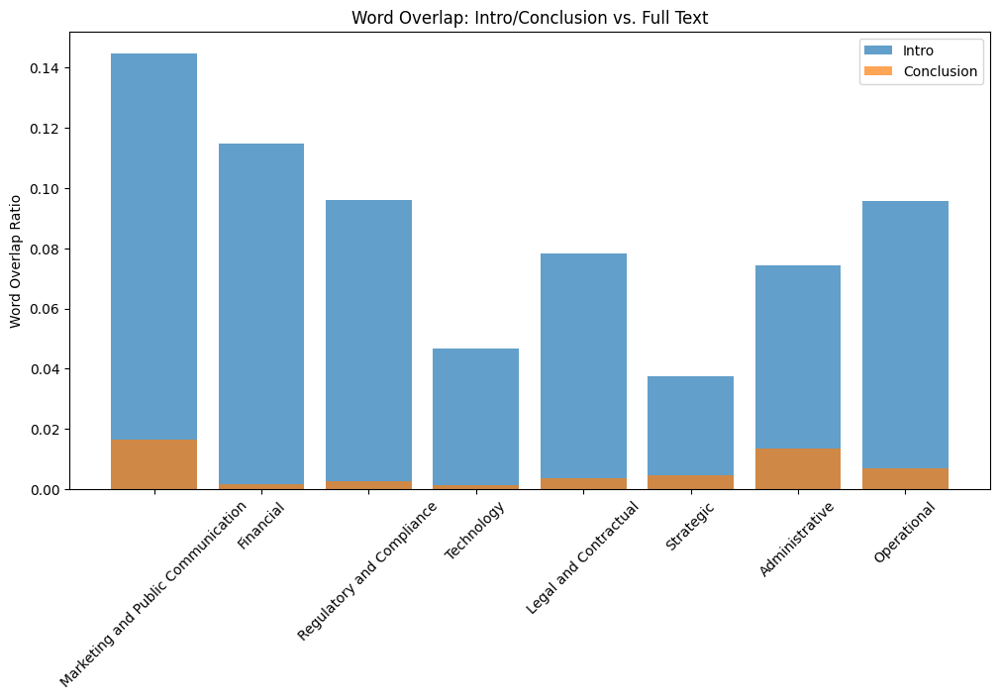

In [7]:
plt.figure(figsize=(12, 6))
plt.bar(df_overlap["Topic"], df_overlap["Intro Overlap"], label="Intro", alpha=0.7)
plt.bar(df_overlap["Topic"], df_overlap["Conclusion Overlap"], label="Conclusion", alpha=0.7)
plt.xticks(rotation=45)
plt.ylabel("Word Overlap Ratio")
plt.title("Word Overlap: Intro/Conclusion vs. Full Text")
plt.legend()
plt.show()


## Tf-IDF Similarity Analysis

In [10]:
tfidf_vectorizer = TfidfVectorizer()

# Store similarity scores and TF-IDF values
similarity_results = []
tfidf_scores = []

for topic, text in combined_texts.items():
    intro, conclusion = extract_intro_conclusion(text)  # Dynamic extraction

    # List of documents for TF-IDF
    docs = [intro, conclusion, text]  # Only Intro, Conclusion, and Full Text
    tfidf_matrix = tfidf_vectorizer.fit_transform(docs)  # Convert to TF-IDF

    # Compute cosine similarity
    intro_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[2])[0][0]  # Intro vs Full
    conclusion_sim = cosine_similarity(tfidf_matrix[1], tfidf_matrix[2])[0][0]  # Conclusion vs Full
    intro_conclusion_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[1])[0][0]  # Intro vs Conclusion

    # Get top 10 TF-IDF words for each section
    feature_names = tfidf_vectorizer.get_feature_names_out()
    
    def get_top_tfidf_words(tfidf_array):
        return sorted(zip(feature_names, tfidf_array), key=lambda x: x[1], reverse=True)[:10]

    intro_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[0])
    conclusion_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[1])
    full_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[2])

    similarity_results.append([topic, intro_sim, conclusion_sim, intro_conclusion_sim])
    tfidf_scores.append([topic, intro_tfidf_scores, conclusion_tfidf_scores, full_tfidf_scores])

# Convert to DataFrame for similarity results
df_similarity = pd.DataFrame(similarity_results, 
                             columns=["Topic", "Intro Similarity", "Conclusion Similarity", "Intro vs Conclusion Similarity"])
df_similarity.to_csv("tfidf_similarity_analysis.csv", index=False)

# Convert to DataFrame for TF-IDF scores
df_tfidf = pd.DataFrame(tfidf_scores, 
                        columns=["Topic", "Intro TF-IDF", "Conclusion TF-IDF", "Full Text TF-IDF"])
df_tfidf.to_csv("tfidf_top_words.csv", index=False)

# Print results
print("\n🔹 TF-IDF Similarity Scores:")
print(df_similarity)

print("\n🔹 Top TF-IDF Words Per Section:")
print(df_tfidf)



🔹 TF-IDF Similarity Scores:
                                Topic  Intro Similarity  \
0  Marketing and Public Communication          0.403282   
1                           Financial          0.558840   
2           Regulatory and Compliance          0.458854   
3                          Technology          0.410518   
4               Legal and Contractual          0.374976   
5                           Strategic          0.448657   
6                      Administrative          0.479142   
7                         Operational          0.176636   

   Conclusion Similarity  Intro vs Conclusion Similarity  
0               0.152504                        0.026900  
1               0.099098                        0.071256  
2               0.155308                        0.029396  
3               0.034671                        0.066606  
4               0.042661                        0.047210  
5               0.071389                        0.022139  
6               0.169440  

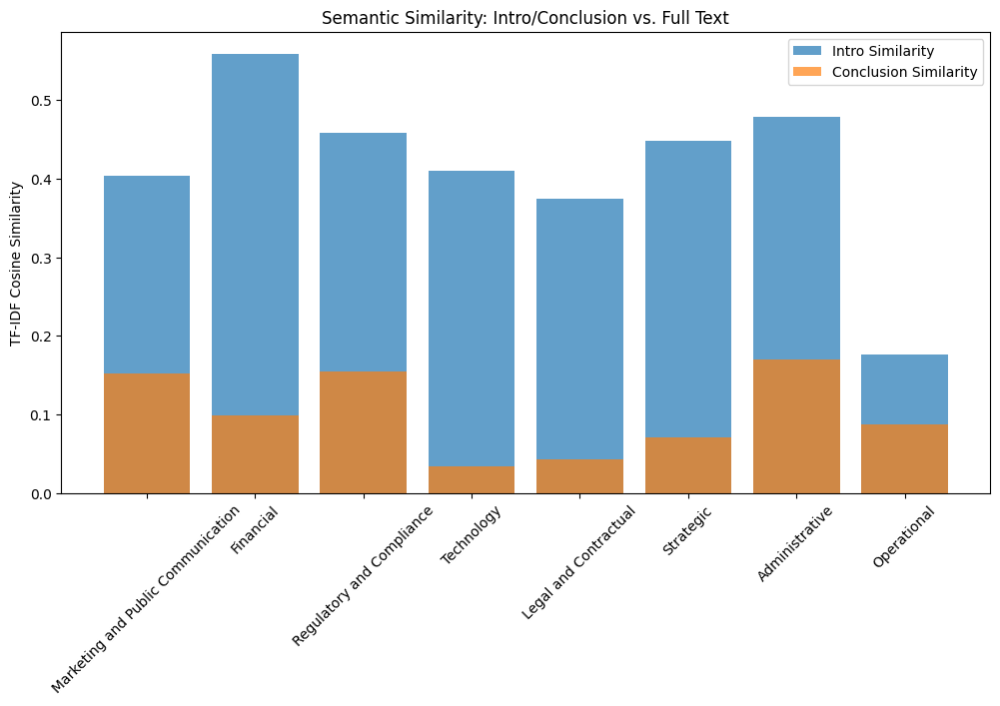

In [11]:
plt.figure(figsize=(12, 6))
plt.bar(df_similarity["Topic"], df_similarity["Intro Similarity"], label="Intro Similarity", alpha=0.7)
plt.bar(df_similarity["Topic"], df_similarity["Conclusion Similarity"], label="Conclusion Similarity", alpha=0.7)
plt.xticks(rotation=45)
plt.ylabel("TF-IDF Cosine Similarity")
plt.title("Semantic Similarity: Intro/Conclusion vs. Full Text")
plt.legend()
plt.show()

### Testing different length ratio

In [12]:
def extract_intro_conclusion_v3(text):
    words = text.split()
    total_words = len(words)

    if total_words < 5000:
        intro_ratio, conclusion_ratio = 0.12, 0.12  # 12% for small docs
    elif total_words < 20000:
        intro_ratio, conclusion_ratio = 0.06, 0.06  # 6% for medium docs
    elif total_words < 50000:
        intro_ratio, conclusion_ratio = 0.03, 0.03  # 3% for long docs
    else:
        intro_ratio, conclusion_ratio = 0.02, 0.02  # 2% for very long docs

    min_length = 75  # Ensure at least 75 words extracted
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    return " ".join(words[:intro_end]), " ".join(words[conclusion_start:])


In [14]:
tfidf_vectorizer = TfidfVectorizer()

# Store similarity scores and TF-IDF values
similarity_results = []
tfidf_scores = []

for topic, text in combined_texts.items():
    intro, conclusion = extract_intro_conclusion_v3(text)  # Dynamic extraction

    # List of documents for TF-IDF
    docs = [intro, conclusion, text]  # Only Intro, Conclusion, and Full Text
    tfidf_matrix = tfidf_vectorizer.fit_transform(docs)  # Convert to TF-IDF

    # Compute cosine similarity
    intro_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[2])[0][0]  # Intro vs Full
    conclusion_sim = cosine_similarity(tfidf_matrix[1], tfidf_matrix[2])[0][0]  # Conclusion vs Full
    intro_conclusion_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[1])[0][0]  # Intro vs Conclusion

    # Get top 10 TF-IDF words for each section
    feature_names = tfidf_vectorizer.get_feature_names_out()
    
    def get_top_tfidf_words(tfidf_array):
        return sorted(zip(feature_names, tfidf_array), key=lambda x: x[1], reverse=True)[:10]

    intro_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[0])
    conclusion_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[1])
    full_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[2])

    similarity_results.append([topic, intro_sim, conclusion_sim, intro_conclusion_sim])
    tfidf_scores.append([topic, intro_tfidf_scores, conclusion_tfidf_scores, full_tfidf_scores])

# Convert to DataFrame for similarity results
df_similarity = pd.DataFrame(similarity_results, 
                             columns=["Topic", "Intro Similarity", "Conclusion Similarity", "Intro vs Conclusion Similarity"])
df_similarity.to_csv("tfidf_similarity_analysis.csv", index=False)

# Convert to DataFrame for TF-IDF scores
df_tfidf = pd.DataFrame(tfidf_scores, 
                        columns=["Topic", "Intro TF-IDF", "Conclusion TF-IDF", "Full Text TF-IDF"])
df_tfidf.to_csv("tfidf_top_words.csv", index=False)

# Print results
print("\n🔹 TF-IDF Similarity Scores:")
print(df_similarity)

print("\n🔹 Top TF-IDF Words Per Section:")
print(df_tfidf)



🔹 TF-IDF Similarity Scores:
                                Topic  Intro Similarity  \
0  Marketing and Public Communication          0.389604   
1                           Financial          0.551690   
2           Regulatory and Compliance          0.531994   
3                          Technology          0.534535   
4               Legal and Contractual          0.473815   
5                           Strategic          0.489884   
6                      Administrative          0.589908   
7                         Operational          0.176152   

   Conclusion Similarity  Intro vs Conclusion Similarity  
0               0.172365                        0.035321  
1               0.098548                        0.079446  
2               0.166781                        0.038482  
3               0.038667                        0.057986  
4               0.080463                        0.094901  
5               0.100482                        0.020636  
6               0.158872  

In [17]:
def extract_intro_conclusion_v4(text, topic):
    words = text.split()
    total_words = len(words)

    # Set dynamic extraction based on document length
    if total_words < 5000:
        intro_ratio, conclusion_ratio = 0.15, 0.15  # 15% for small docs
    elif total_words < 20000:
        intro_ratio, conclusion_ratio = 0.08, 0.08  # 8% for medium docs
    elif total_words < 50000:
        intro_ratio, conclusion_ratio = 0.04, 0.04  # 4% for long docs
    else:
        intro_ratio, conclusion_ratio = 0.02, 0.02  # 2% for very long docs

    # **Topic-Specific Adjustments**
    if topic in {"Marketing and Public Communication", "Financial"}:
        intro_ratio += 0.03  # Extract more from intro
        conclusion_ratio += 0.03  # Extract more from conclusion
    elif topic in {"Operational"}:
        intro_ratio += 0.05  # Extract significantly more
        conclusion_ratio += 0.05

    # **Ensure at least 100 words extracted**
    min_length = 100
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    return " ".join(words[:intro_end]), " ".join(words[conclusion_start:])

# Apply to all topics
intro_conclusion_texts = {topic: extract_intro_conclusion_v4(text, topic) for topic, text in combined_texts.items()}


In [18]:
tfidf_vectorizer = TfidfVectorizer()

# Store similarity scores and TF-IDF values
similarity_results = []
tfidf_scores = []

for topic, text in combined_texts.items():
    intro, conclusion = extract_intro_conclusion_v4(text,topic)  # Dynamic extraction

    # List of documents for TF-IDF
    docs = [intro, conclusion, text]  # Only Intro, Conclusion, and Full Text
    tfidf_matrix = tfidf_vectorizer.fit_transform(docs)  # Convert to TF-IDF

    # Compute cosine similarity
    intro_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[2])[0][0]  # Intro vs Full
    conclusion_sim = cosine_similarity(tfidf_matrix[1], tfidf_matrix[2])[0][0]  # Conclusion vs Full
    intro_conclusion_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[1])[0][0]  # Intro vs Conclusion

    # Get top 10 TF-IDF words for each section
    feature_names = tfidf_vectorizer.get_feature_names_out()
    
    def get_top_tfidf_words(tfidf_array):
        return sorted(zip(feature_names, tfidf_array), key=lambda x: x[1], reverse=True)[:10]

    intro_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[0])
    conclusion_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[1])
    full_tfidf_scores = get_top_tfidf_words(tfidf_matrix.toarray()[2])

    similarity_results.append([topic, intro_sim, conclusion_sim, intro_conclusion_sim])
    tfidf_scores.append([topic, intro_tfidf_scores, conclusion_tfidf_scores, full_tfidf_scores])

# Convert to DataFrame for similarity results
df_similarity = pd.DataFrame(similarity_results, 
                             columns=["Topic", "Intro Similarity", "Conclusion Similarity", "Intro vs Conclusion Similarity"])
df_similarity.to_csv("tfidf_similarity_analysis.csv", index=False)

# Convert to DataFrame for TF-IDF scores
df_tfidf = pd.DataFrame(tfidf_scores, 
                        columns=["Topic", "Intro TF-IDF", "Conclusion TF-IDF", "Full Text TF-IDF"])
df_tfidf.to_csv("tfidf_top_words.csv", index=False)

# Print results
print("\n🔹 TF-IDF Similarity Scores:")
print(df_similarity)

print("\n🔹 Top TF-IDF Words Per Section:")
print(df_tfidf)



🔹 TF-IDF Similarity Scores:
                                Topic  Intro Similarity  \
0  Marketing and Public Communication          0.482821   
1                           Financial          0.594394   
2           Regulatory and Compliance          0.532239   
3                          Technology          0.537068   
4               Legal and Contractual          0.464002   
5                           Strategic          0.489702   
6                      Administrative          0.632842   
7                         Operational          0.350940   

   Conclusion Similarity  Intro vs Conclusion Similarity  
0               0.192927                        0.066941  
1               0.143955                        0.108025  
2               0.176159                        0.042049  
3               0.050545                        0.071065  
4               0.130701                        0.114604  
5               0.112607                        0.029104  
6               0.164711  

## Measuring Entity Overlap

The code below measures the Entity overlap between:
1. Introduction vs Entire Text
2. Conclusion vs Entire Text

Named Entity Recognition (NER) is used to extract entities, and their overlap is calculated to understand how much key information is retained in different parts of the document.

In [20]:
import spacy
import pandas as pd

# Load SpaCy model for Named Entity Recognition
nlp = spacy.load("en_core_web_sm")
nlp.max_length = 2_000_000  # Adjust to a safer limit

# Function to extract named entities in chunks
def extract_named_entities(text, chunk_size=500_000):
    entities = set()
    text_length = len(text)
    
    for i in range(0, text_length, chunk_size):
        chunk = text[i:i + chunk_size]
        doc = nlp(chunk)
        entities.update(ent.text.lower() for ent in doc.ents)  # Convert to lowercase for consistency
    
    return entities

# Store entity overlap results
entity_overlap_results = []

for topic, text in combined_texts.items():
    intro, conclusion = extract_intro_conclusion(text)  # Get dynamic intro/conclusion

    # Extract named entities from each section using chunking
    full_entities = extract_named_entities(text)
    intro_entities = extract_named_entities(intro)
    conclusion_entities = extract_named_entities(conclusion)

    # Compute entity overlap ratios
    intro_entity_overlap = len(intro_entities & full_entities) / len(full_entities) if full_entities else 0
    conclusion_entity_overlap = len(conclusion_entities & full_entities) / len(full_entities) if full_entities else 0

    entity_overlap_results.append([topic, intro_entity_overlap, conclusion_entity_overlap])

# Convert to DataFrame
df_entity_overlap = pd.DataFrame(entity_overlap_results, columns=["Topic", "Intro Entity Overlap", "Conclusion Entity Overlap"])

# Save results
df_entity_overlap.to_csv("entity_overlap_analysis.csv", index=False)

# Print results
print(df_entity_overlap)


                                Topic  Intro Entity Overlap  \
0  Marketing and Public Communication              0.084507   
1                           Financial              0.024131   
2           Regulatory and Compliance              0.015300   
3                          Technology              0.023304   
4               Legal and Contractual              0.008379   
5                           Strategic              0.009073   
6                      Administrative              0.058394   
7                         Operational              0.037333   

   Conclusion Entity Overlap  
0                   0.021127  
1                   0.000273  
2                   0.000000  
3                   0.000299  
4                   0.005446  
5                   0.003024  
6                   0.000000  
7                   0.002667  


From the above results, we can see that the entity overlap is low, and using only the introduction and conclusion might not be sufficient, further reinforcing the earlier TF-IDF similarity results. Similar to before, the introduction is more informative than the conclusion, but still lacks full entity coverage.

## Hybrid Approach 

Since we have concluded above that the introduction itself might not be sufficient, we tried to combine the introduction with a sample of the body text. Below are the resepective TF-IDF and entity overlap results.

In [21]:
import random
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import spacy
import pandas as pd

# Load SpaCy for Named Entity Recognition
nlp = spacy.load("en_core_web_sm")

def extract_intro_middle_conclusion_v5(text, topic):
    words = text.split()
    total_words = len(words)

    # **Set dynamic extraction ratios based on document length**
    if total_words < 5000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.15, 0.15, 0.15  # Small docs
    elif total_words < 20000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.08, 0.12, 0.08  # Medium docs
    elif total_words < 50000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.04, 0.08, 0.04  # Large docs
    else:
        intro_ratio, middle_ratio, conclusion_ratio = 0.02, 0.06, 0.02  # Very large docs

    # **Topic-Specific Adjustments**
    if topic in {"Marketing and Public Communication", "Financial"}:
        intro_ratio += 0.03  # Extract more from intro
        conclusion_ratio += 0.03  # Extract more from conclusion
    elif topic in {"Operational"}:
        intro_ratio += 0.05  # Extract significantly more
        conclusion_ratio += 0.05  # Extract significantly more

    # **Ensure at least 100 words extracted**
    min_length = 100
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    # **Middle Section Sampling**
    middle_start = intro_end
    middle_end = conclusion_start
    middle_range = words[middle_start:middle_end]
    
    if len(middle_range) > min_length:
        middle_sample_size = int(len(middle_range) * middle_ratio)  # Take a sample
        middle_sample = random.sample(middle_range, min(middle_sample_size, len(middle_range)))
    else:
        middle_sample = middle_range  # Use full middle if it's already small

    return " ".join(words[:intro_end]), " ".join(middle_sample), " ".join(words[conclusion_start:])

# Apply function to all topics
intro_middle_conclusion_texts = {topic: extract_intro_middle_conclusion_v5(text, topic) for topic, text in combined_texts.items()}


In [22]:
tfidf_vectorizer = TfidfVectorizer()

# Store similarity scores
similarity_results = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v5(text, topic)

    # Combine intro + middle + conclusion
    hybrid_text = f"{intro} {middle} {conclusion}"

    # List of documents for TF-IDF
    docs = [intro, conclusion, hybrid_text, text]  # Hybrid approach vs full text
    tfidf_matrix = tfidf_vectorizer.fit_transform(docs)  # Convert to TF-IDF

    # Compute cosine similarity
    intro_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[3])[0][0]  # Intro vs Full
    conclusion_sim = cosine_similarity(tfidf_matrix[1], tfidf_matrix[3])[0][0]  # Conclusion vs Full
    hybrid_sim = cosine_similarity(tfidf_matrix[2], tfidf_matrix[3])[0][0]  # Hybrid vs Full

    similarity_results.append([topic, intro_sim, conclusion_sim, hybrid_sim])

# Convert to DataFrame
df_similarity = pd.DataFrame(similarity_results, 
                             columns=["Topic", "Intro Similarity", "Conclusion Similarity", "Hybrid Similarity"])
df_similarity.to_csv("tfidf_hybrid_similarity_analysis.csv", index=False)

# Print results
print("\n🔹 TF-IDF Similarity Scores for Hybrid Approach:")
print(df_similarity)



🔹 TF-IDF Similarity Scores for Hybrid Approach:
                                Topic  Intro Similarity  \
0  Marketing and Public Communication          0.487802   
1                           Financial          0.600554   
2           Regulatory and Compliance          0.536203   
3                          Technology          0.544022   
4               Legal and Contractual          0.476740   
5                           Strategic          0.495275   
6                      Administrative          0.629078   
7                         Operational          0.356604   

   Conclusion Similarity  Hybrid Similarity  
0               0.199893           0.792714  
1               0.154260           0.922218  
2               0.186955           0.944176  
3               0.054488           0.925184  
4               0.140776           0.923695  
5               0.117412           0.841264  
6               0.169924           0.829902  
7               0.159749           0.799902  


In [24]:
import spacy
import pandas as pd

# Load SpaCy model for Named Entity Recognition
nlp = spacy.load("en_core_web_sm")
nlp.max_length = 2_000_000  # Adjust limit to a safer value

# Function to extract named entities in chunks
def extract_named_entities(text, chunk_size=500_000):
    entities = set()
    text_length = len(text)
    
    for i in range(0, text_length, chunk_size):
        chunk = text[i:i + chunk_size]
        doc = nlp(chunk)
        entities.update(ent.text.lower() for ent in doc.ents)  # Convert to lowercase for consistency
    
    return entities

# Store entity overlap results
entity_overlap_results = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v5(text, topic)  # Get dynamic sections

    # Extract named entities from each section using chunking
    full_entities = extract_named_entities(text)
    hybrid_entities = extract_named_entities(f"{intro} {middle} {conclusion}")

    # Compute entity overlap ratios
    hybrid_entity_overlap = len(hybrid_entities & full_entities) / len(full_entities) if full_entities else 0

    entity_overlap_results.append([topic, hybrid_entity_overlap])

# Convert to DataFrame
df_entity_overlap = pd.DataFrame(entity_overlap_results, columns=["Topic", "Hybrid Entity Overlap"])

# Save results
df_entity_overlap.to_csv("hybrid_entity_overlap.csv", index=False)

# Print results
print("\n🔹 Entity Overlap Results for Hybrid Approach:")
print(df_entity_overlap)



🔹 Entity Overlap Results for Hybrid Approach:
                                Topic  Hybrid Entity Overlap
0  Marketing and Public Communication               0.281690
1                           Financial               0.105112
2           Regulatory and Compliance               0.063323
3                          Technology               0.068718
4               Legal and Contractual               0.058232
5                           Strategic               0.068548
6                      Administrative               0.189781
7                         Operational               0.168000


## Final Hybrid Extraction

In [25]:
def extract_intro_middle_conclusion_v6(text, topic):
    words = text.split()
    total_words = len(words)

    # Set base ratios for different document lengths
    if total_words < 5000:
        intro_ratio, conclusion_ratio = 0.12, 0.12  # 12% for small docs
    elif total_words < 20000:
        intro_ratio, conclusion_ratio = 0.08, 0.08  # 8% for medium docs
    elif total_words < 50000:
        intro_ratio, conclusion_ratio = 0.05, 0.05  # 5% for long docs
    else:
        intro_ratio, conclusion_ratio = 0.03, 0.03  # 3% for very long docs

    # **Topic-Specific Adjustments**
    if topic in {"Marketing and Public Communication", "Financial"}:
        intro_ratio += 0.02  # Extract more from intro
        conclusion_ratio += 0.02  # Extract more from conclusion
    elif topic in {"Operational"}:
        intro_ratio += 0.03  # Extract significantly more
        conclusion_ratio += 0.03

    # **Ensure total extraction does not exceed 40%**
    max_allowed_ratio = 0.40  # Maximum allowable extraction ratio
    remaining_ratio = max_allowed_ratio - (intro_ratio + conclusion_ratio)

    # If intro + conclusion already exceed 40%, reduce their impact
    if remaining_ratio < 0:
        scale_factor = max_allowed_ratio / (intro_ratio + conclusion_ratio)
        intro_ratio *= scale_factor
        conclusion_ratio *= scale_factor
        middle_ratio = 0  # No middle extracted in this case
    else:
        middle_ratio = remaining_ratio  # Use remaining available space for middle

    # Ensure at least 100 words extracted
    min_length = 100
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    # Extract middle portion dynamically
    remaining_middle_words = total_words - (intro_end + (total_words - conclusion_start))
    middle_size = max(int(remaining_middle_words * middle_ratio), min_length // 2)  # At least 50 words for middle
    middle_start = intro_end + (remaining_middle_words // 2 - middle_size // 2)
    middle_end = middle_start + middle_size

    return " ".join(words[:intro_end]), " ".join(words[middle_start:middle_end]), " ".join(words[conclusion_start:])


In [26]:
tfidf_vectorizer = TfidfVectorizer()

# Store similarity scores
similarity_results = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v6(text, topic)

    # Combine intro + middle + conclusion
    hybrid_text = f"{intro} {middle} {conclusion}"

    # List of documents for TF-IDF
    docs = [intro, conclusion, hybrid_text, text]  # Hybrid approach vs full text
    tfidf_matrix = tfidf_vectorizer.fit_transform(docs)  # Convert to TF-IDF

    # Compute cosine similarity
    intro_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[3])[0][0]  # Intro vs Full
    conclusion_sim = cosine_similarity(tfidf_matrix[1], tfidf_matrix[3])[0][0]  # Conclusion vs Full
    hybrid_sim = cosine_similarity(tfidf_matrix[2], tfidf_matrix[3])[0][0]  # Hybrid vs Full

    similarity_results.append([topic, intro_sim, conclusion_sim, hybrid_sim])

# Convert to DataFrame
df_similarity = pd.DataFrame(similarity_results, 
                             columns=["Topic", "Intro Similarity", "Conclusion Similarity", "Hybrid Similarity"])
df_similarity.to_csv("tfidf_hybrid_similarity_analysis.csv", index=False)

# Print results
print("\n🔹 TF-IDF Similarity Scores for Hybrid Approach:")
print(df_similarity)



🔹 TF-IDF Similarity Scores for Hybrid Approach:
                                Topic  Intro Similarity  \
0  Marketing and Public Communication          0.475394   
1                           Financial          0.600508   
2           Regulatory and Compliance          0.577998   
3                          Technology          0.521336   
4               Legal and Contractual          0.476143   
5                           Strategic          0.563489   
6                      Administrative          0.624371   
7                         Operational          0.328149   

   Conclusion Similarity  Hybrid Similarity  
0               0.200666           0.810676  
1               0.154248           0.979255  
2               0.188341           0.889072  
3               0.054508           0.929198  
4               0.138493           0.831236  
5               0.112970           0.840405  
6               0.168653           0.823956  
7               0.157234           0.874599  


In [27]:
import spacy
import pandas as pd

# Load SpaCy model for Named Entity Recognition
nlp = spacy.load("en_core_web_sm")
nlp.max_length = 2_000_000  # Adjust limit to a safer value

# Function to extract named entities in chunks
def extract_named_entities(text, chunk_size=500_000):
    entities = set()
    text_length = len(text)
    
    for i in range(0, text_length, chunk_size):
        chunk = text[i:i + chunk_size]
        doc = nlp(chunk)
        entities.update(ent.text.lower() for ent in doc.ents)  # Convert to lowercase for consistency
    
    return entities

# Store entity overlap results
entity_overlap_results = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v5(text, topic)  # Get dynamic sections

    # Extract named entities from each section using chunking
    full_entities = extract_named_entities(text)
    hybrid_entities = extract_named_entities(f"{intro} {middle} {conclusion}")

    # Compute entity overlap ratios
    hybrid_entity_overlap = len(hybrid_entities & full_entities) / len(full_entities) if full_entities else 0

    entity_overlap_results.append([topic, hybrid_entity_overlap])

# Convert to DataFrame
df_entity_overlap = pd.DataFrame(entity_overlap_results, columns=["Topic", "Hybrid Entity Overlap"])

# Save results
df_entity_overlap.to_csv("hybrid_entity_overlap.csv", index=False)

# Print results
print("\n🔹 Entity Overlap Results for Hybrid Approach:")
print(df_entity_overlap)



🔹 Entity Overlap Results for Hybrid Approach:
                                Topic  Hybrid Entity Overlap
0  Marketing and Public Communication               0.274648
1                           Financial               0.104294
2           Regulatory and Compliance               0.062048
3                          Technology               0.063340
4               Legal and Contractual               0.061165
5                           Strategic               0.061492
6                      Administrative               0.226277
7                         Operational               0.162667


## Ensure Hybrid Extraction does not exceed Token Limit

In [7]:
def extract_intro_middle_conclusion_v6(text, topic):
    words = text.split()
    total_words = len(words)

    # Set base ratios for different document lengths
    if total_words < 5000:
        intro_ratio, conclusion_ratio = 0.12, 0.12  # 12% for small docs
    elif total_words < 20000:
        intro_ratio, conclusion_ratio = 0.08, 0.08  # 8% for medium docs
    elif total_words < 50000:
        intro_ratio, conclusion_ratio = 0.05, 0.05  # 5% for long docs
    else:
        intro_ratio, conclusion_ratio = 0.03, 0.03  # 3% for very long docs

    # **Topic-Specific Adjustments**
    if topic in {"Marketing and Public Communication", "Financial"}:
        intro_ratio += 0.02  # Extract more from intro
        conclusion_ratio += 0.02  # Extract more from conclusion
    elif topic in {"Operational"}:
        intro_ratio += 0.03  # Extract significantly more
        conclusion_ratio += 0.03

    # **Ensure total extraction does not exceed 40%**
    max_allowed_ratio = 0.40  # Maximum allowable extraction ratio
    remaining_ratio = max_allowed_ratio - (intro_ratio + conclusion_ratio)

    # If intro + conclusion already exceed 40%, reduce their impact
    if remaining_ratio < 0:
        scale_factor = max_allowed_ratio / (intro_ratio + conclusion_ratio)
        intro_ratio *= scale_factor
        conclusion_ratio *= scale_factor
        middle_ratio = 0  # No middle extracted in this case
    else:
        middle_ratio = remaining_ratio  # Use remaining available space for middle

    # Ensure at least 100 words extracted
    min_length = 100
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    # Extract middle portion dynamically
    remaining_middle_words = total_words - (intro_end + (total_words - conclusion_start))
    middle_size = max(int(remaining_middle_words * middle_ratio), min_length // 2)  # At least 50 words for middle
    middle_start = intro_end + (remaining_middle_words // 2 - middle_size // 2)
    middle_end = middle_start + middle_size

    return " ".join(words[:intro_end]), " ".join(words[middle_start:middle_end]), " ".join(words[conclusion_start:])


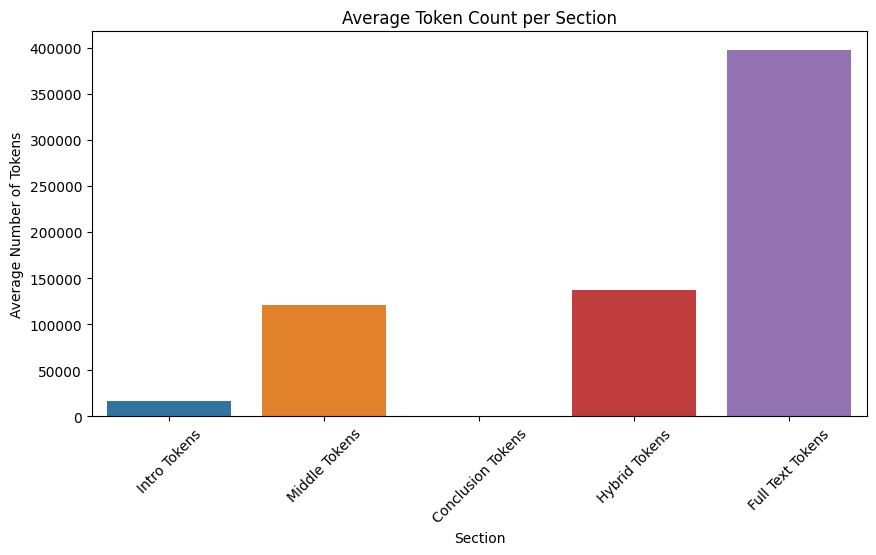

,Section,Average Tokens
0,Intro Tokens,16696.25
1,Middle Tokens,120477.00
2,Conclusion Tokens,100.00
3,Hybrid Tokens,137273.25
4,Full Text Tokens,397679.25


In [ ]:
# Function to count tokens (words) in a text sample
def count_tokens(text):
    return len(text.split())

# Store token counts
token_counts = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v6(text, topic)
    hybrid_text = f"{intro} {middle} {conclusion}"

    intro_tokens = count_tokens(intro)
    middle_tokens = count_tokens(middle)
    conclusion_tokens = count_tokens(conclusion)
    hybrid_tokens = count_tokens(hybrid_text)
    full_text_tokens = count_tokens(text)

    token_counts.append([topic, intro_tokens, middle_tokens, conclusion_tokens, hybrid_tokens, full_text_tokens])

# Convert to DataFrame
df_tokens = pd.DataFrame(token_counts, 
                         columns=["Topic", "Intro Tokens", "Middle Tokens", "Conclusion Tokens", 
                                  "Hybrid Tokens", "Full Text Tokens"])

# Compute average number of tokens per section
df_avg_tokens = df_tokens.drop(columns=["Topic"]).mean().reset_index()
df_avg_tokens.columns = ["Section", "Average Tokens"]

# Display the table of average token counts
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.barplot(x=df_avg_tokens["Section"], y=df_avg_tokens["Average Tokens"])
plt.title("Average Token Count per Section")
plt.ylabel("Average Number of Tokens")
plt.xlabel("Section")
plt.xticks(rotation=45)
plt.show()

# Display the dataframe
df_avg_tokens


<Figure size 1200x600 with 0 Axes>

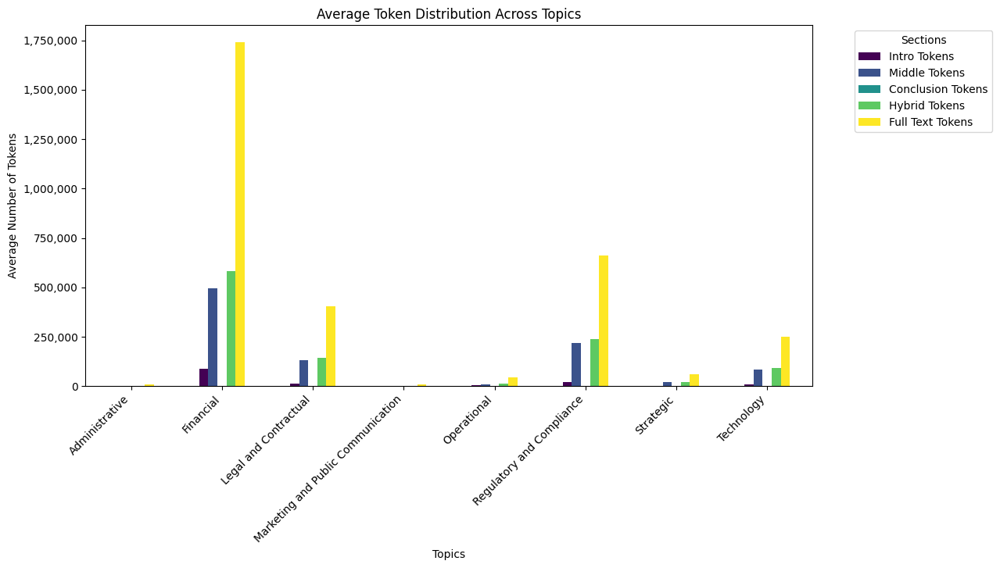

                                Topic  Hybrid Tokens
0                      Administrative         3089.0
1                           Financial       582780.0
2               Legal and Contractual       145420.0
3  Marketing and Public Communication         2793.0
4                         Operational        13088.0
5           Regulatory and Compliance       238686.0
6                           Strategic        21794.0
7                          Technology        90536.0


In [ ]:

# Compute average number of tokens per topic and section
df_avg_tokens_per_topic = df_tokens.groupby("Topic").mean()

# Reset index for better visualization
df_avg_tokens_per_topic = df_avg_tokens_per_topic.reset_index()

# Plot average token distribution across topics
plt.figure(figsize=(12, 6))
ax = df_avg_tokens_per_topic.set_index("Topic").plot(kind="bar", figsize=(12, 6), colormap="viridis")
plt.title("Average Token Distribution Across Topics")
plt.ylabel("Average Number of Tokens")
plt.xlabel("Topics")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Sections", bbox_to_anchor=(1.05, 1), loc='upper left')

# Format y-axis to show whole numbers instead of scientific notation
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.show()

# Display the table of average hybrid tokens per topic
df_avg_hybrid_tokens = df_avg_tokens_per_topic[["Topic", "Hybrid Tokens"]]
print(df_avg_hybrid_tokens)

### Setting Token Limit for Sample

In [ ]:
# Modify function to enforce 4k token limit while returning separate intro, middle, and conclusion
def extract_intro_middle_conclusion_v7(text, topic, max_tokens=20000):  
    words = text.split()
    total_words = len(words)

    # **Set dynamic extraction ratios based on document length**
    if total_words < 5000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.15, 0.15, 0.15
    elif total_words < 20000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.08, 0.12, 0.08
    elif total_words < 50000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.04, 0.08, 0.04
    else:
        intro_ratio, middle_ratio, conclusion_ratio = 0.02, 0.06, 0.02

    # **Ensure at least 100 words extracted**
    min_length = 100
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    # **Middle Section Sampling**
    middle_start = intro_end
    middle_end = conclusion_start
    middle_range = words[middle_start:middle_end]

    if len(middle_range) > min_length:
        middle_sample_size = int(len(middle_range) * middle_ratio)
        middle_sample = random.sample(middle_range, min(middle_sample_size, len(middle_range)))
    else:
        middle_sample = middle_range

    # **Assemble Hybrid Text**
    intro_text = words[:intro_end]
    middle_text = middle_sample
    conclusion_text = words[conclusion_start:]
    
    hybrid_text_words = intro_text + middle_text + conclusion_text

    # **Estimate Token Usage**
    estimated_tokens = len(hybrid_text_words) * 1.3  # Approximate token count

    # **Truncate if Exceeding Token Limit**
    if estimated_tokens > max_tokens:
        allowed_words = int(max_tokens / 1.3)  # Adjust word limit based on estimated tokens
        hybrid_text_words = hybrid_text_words[:allowed_words]

        # **Redistribute to keep sections separate but within limit**
        new_intro_end = max(int(len(hybrid_text_words) * (intro_ratio / (intro_ratio + middle_ratio + conclusion_ratio))), min_length)
        new_conclusion_start = max(len(hybrid_text_words) - int(len(hybrid_text_words) * (conclusion_ratio / (intro_ratio + middle_ratio + conclusion_ratio))), min_length)

        intro_text = hybrid_text_words[:new_intro_end]
        middle_text = hybrid_text_words[new_intro_end:new_conclusion_start]
        conclusion_text = hybrid_text_words[new_conclusion_start:]

    return " ".join(intro_text), " ".join(middle_text), " ".join(conclusion_text)


In [57]:
tfidf_vectorizer = TfidfVectorizer()

# Store similarity scores
similarity_results = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v7(text, topic)

    # Combine intro + middle + conclusion
    hybrid_text = f"{intro} {middle} {conclusion}"

    # List of documents for TF-IDF
    docs = [intro, conclusion, hybrid_text, text]  # Hybrid approach vs full text
    tfidf_matrix = tfidf_vectorizer.fit_transform(docs)  # Convert to TF-IDF

    # Compute cosine similarity
    intro_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[3])[0][0]  # Intro vs Full
    conclusion_sim = cosine_similarity(tfidf_matrix[1], tfidf_matrix[3])[0][0]  # Conclusion vs Full
    hybrid_sim = cosine_similarity(tfidf_matrix[2], tfidf_matrix[3])[0][0]  # Hybrid vs Full

    similarity_results.append([topic, intro_sim, conclusion_sim, hybrid_sim])

# Convert to DataFrame
df_similarity = pd.DataFrame(similarity_results, 
                             columns=["Topic", "Intro Similarity", "Conclusion Similarity", "Hybrid Similarity"])
df_similarity.to_csv("tfidf_hybrid_similarity_analysis.csv", index=False)

# Print results
print("\n🔹 TF-IDF Similarity Scores for Hybrid Approach:")
print(df_similarity)



🔹 TF-IDF Similarity Scores for Hybrid Approach:
                                Topic  Intro Similarity  \
0  Marketing and Public Communication          0.423573   
1                           Financial          0.475450   
2           Regulatory and Compliance          0.357229   
3                          Technology          0.448838   
4               Legal and Contractual          0.355849   
5                           Strategic          0.495608   
6                      Administrative          0.627807   
7                         Operational          0.221393   

   Conclusion Similarity  Hybrid Similarity  
0               0.197392           0.789810  
1               0.244258           0.508881  
2               0.868327           0.608133  
3               0.775922           0.883586  
4               0.875819           0.757165  
5               0.117491           0.849386  
6               0.169581           0.828290  
7               0.157906           0.803313  


<Figure size 1200x600 with 0 Axes>

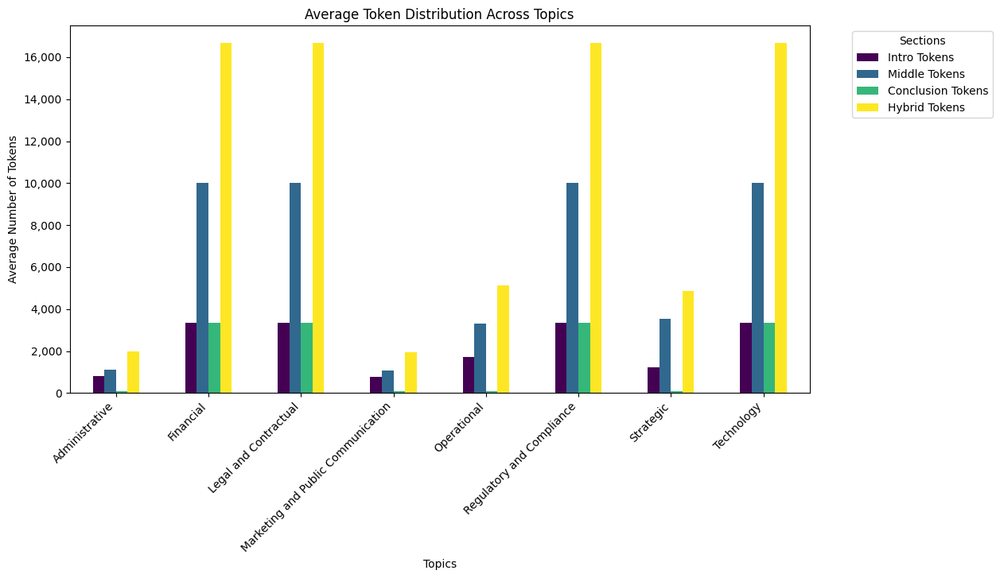


🔹 Average Hybrid Tokens Per Topic:
                                Topic  Intro Tokens  Middle Tokens  \
0                      Administrative         801.0         1094.0   
1                           Financial        3333.0        10000.0   
2               Legal and Contractual        3333.0        10000.0   
3  Marketing and Public Communication         775.0         1057.0   
4                         Operational        1730.0         3314.0   
5           Regulatory and Compliance        3333.0        10000.0   
6                           Strategic        1207.0         3545.0   
7                          Technology        3333.0        10000.0   

   Conclusion Tokens  Hybrid Tokens  
0              100.0         1995.0  
1             3333.0        16666.0  
2             3333.0        16666.0  
3              100.0         1932.0  
4              100.0         5144.0  
5             3333.0        16666.0  
6              100.0         4852.0  
7             3333.0        1

In [58]:
import matplotlib.pyplot as plt
import pandas as pd

# Function to count tokens (words) in a text sample
def count_tokens(text):
    return len(text.split())

# Store token counts
token_counts = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v7(text, topic)
    hybrid_text = f"{intro} {middle} {conclusion}"

    intro_tokens = count_tokens(intro)
    middle_tokens = count_tokens(middle)
    conclusion_tokens = count_tokens(conclusion)
    hybrid_tokens = count_tokens(hybrid_text)

    token_counts.append([topic, intro_tokens, middle_tokens, conclusion_tokens, hybrid_tokens])

# Convert to DataFrame
df_tokens = pd.DataFrame(token_counts, 
                         columns=["Topic", "Intro Tokens", "Middle Tokens", "Conclusion Tokens", "Hybrid Tokens"])

# Compute average number of tokens per topic
df_avg_tokens_per_topic = df_tokens.groupby("Topic").mean().reset_index()

# Plot average token distribution across topics
plt.figure(figsize=(12, 6))
ax = df_avg_tokens_per_topic.set_index("Topic").plot(kind="bar", figsize=(12, 6), colormap="viridis")
plt.title("Average Token Distribution Across Topics")
plt.ylabel("Average Number of Tokens")
plt.xlabel("Topics")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Sections", bbox_to_anchor=(1.05, 1), loc='upper left')

# Format y-axis to show whole numbers instead of scientific notation
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.show()

# Display table of average hybrid tokens per topic
print("\n🔹 Average Hybrid Tokens Per Topic:")
print(df_avg_tokens_per_topic)


### Optimising Number of Max_Tokens


In [93]:
# Modify function to enforce 4k token limit while returning separate intro, middle, and conclusion
def extract_intro_middle_conclusion_v7(text, topic, max_tokens=15000):  
    words = text.split()
    total_words = len(words)

    # **Set dynamic extraction ratios based on document length**
    if total_words < 5000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.15, 0.15, 0.15
    elif total_words < 20000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.08, 0.12, 0.08
    elif total_words < 50000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.04, 0.08, 0.04
    else:
        intro_ratio, middle_ratio, conclusion_ratio = 0.02, 0.06, 0.02

    # **Ensure at least 100 words extracted**
    min_length = 100
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    # **Middle Section Sampling**
    middle_start = intro_end
    middle_end = conclusion_start
    middle_range = words[middle_start:middle_end]

    if len(middle_range) > min_length:
        middle_sample_size = int(len(middle_range) * middle_ratio)
        middle_sample = random.sample(middle_range, min(middle_sample_size, len(middle_range)))
    else:
        middle_sample = middle_range

    # **Assemble Hybrid Text**
    intro_text = words[:intro_end]
    middle_text = middle_sample
    conclusion_text = words[conclusion_start:]
    
    hybrid_text_words = intro_text + middle_text + conclusion_text

    # **Estimate Token Usage**
    estimated_tokens = len(hybrid_text_words) * 1.3  # Approximate token count

    # **Truncate if Exceeding Token Limit**
    if estimated_tokens > max_tokens:
        allowed_words = int(max_tokens / 1.3)  # Adjust word limit based on estimated tokens
        hybrid_text_words = hybrid_text_words[:allowed_words]

        # **Redistribute to keep sections separate but within limit**
        new_intro_end = max(int(len(hybrid_text_words) * (intro_ratio / (intro_ratio + middle_ratio + conclusion_ratio))), min_length)
        new_conclusion_start = max(len(hybrid_text_words) - int(len(hybrid_text_words) * (conclusion_ratio / (intro_ratio + middle_ratio + conclusion_ratio))), min_length)

        intro_text = hybrid_text_words[:new_intro_end]
        middle_text = hybrid_text_words[new_intro_end:new_conclusion_start]
        conclusion_text = hybrid_text_words[new_conclusion_start:]

    return " ".join(intro_text), " ".join(middle_text), " ".join(conclusion_text)


In [64]:
tfidf_vectorizer = TfidfVectorizer()

# Store similarity scores
similarity_results = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v7(text, topic)

    # Combine intro + middle + conclusion
    hybrid_text = f"{intro} {middle} {conclusion}"

    # List of documents for TF-IDF
    docs = [intro, conclusion, hybrid_text, text]  # Hybrid approach vs full text
    tfidf_matrix = tfidf_vectorizer.fit_transform(docs)  # Convert to TF-IDF

    # Compute cosine similarity
    intro_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[3])[0][0]  # Intro vs Full
    conclusion_sim = cosine_similarity(tfidf_matrix[1], tfidf_matrix[3])[0][0]  # Conclusion vs Full
    hybrid_sim = cosine_similarity(tfidf_matrix[2], tfidf_matrix[3])[0][0]  # Hybrid vs Full

    similarity_results.append([topic, intro_sim, conclusion_sim, hybrid_sim])

# Convert to DataFrame
df_similarity = pd.DataFrame(similarity_results, 
                             columns=["Topic", "Intro Similarity", "Conclusion Similarity", "Hybrid Similarity"])
df_similarity.to_csv("tfidf_hybrid_similarity_analysis.csv", index=False)

# Print results
print("\n🔹 TF-IDF Similarity Scores for Hybrid Approach:")
print(df_similarity)



🔹 TF-IDF Similarity Scores for Hybrid Approach:
                                Topic  Intro Similarity  \
0  Marketing and Public Communication          0.423030   
1                           Financial          0.486202   
2           Regulatory and Compliance          0.309444   
3                          Technology          0.392352   
4               Legal and Contractual          0.359106   
5                           Strategic          0.495840   
6                      Administrative          0.628683   
7                         Operational          0.221411   

   Conclusion Similarity  Hybrid Similarity  
0               0.197139           0.797032  
1               0.217713           0.513340  
2               0.236202           0.445950  
3               0.721605           0.799280  
4               0.837620           0.617490  
5               0.117546           0.854083  
6               0.169818           0.830639  
7               0.157918           0.825063  


<Figure size 1200x600 with 0 Axes>

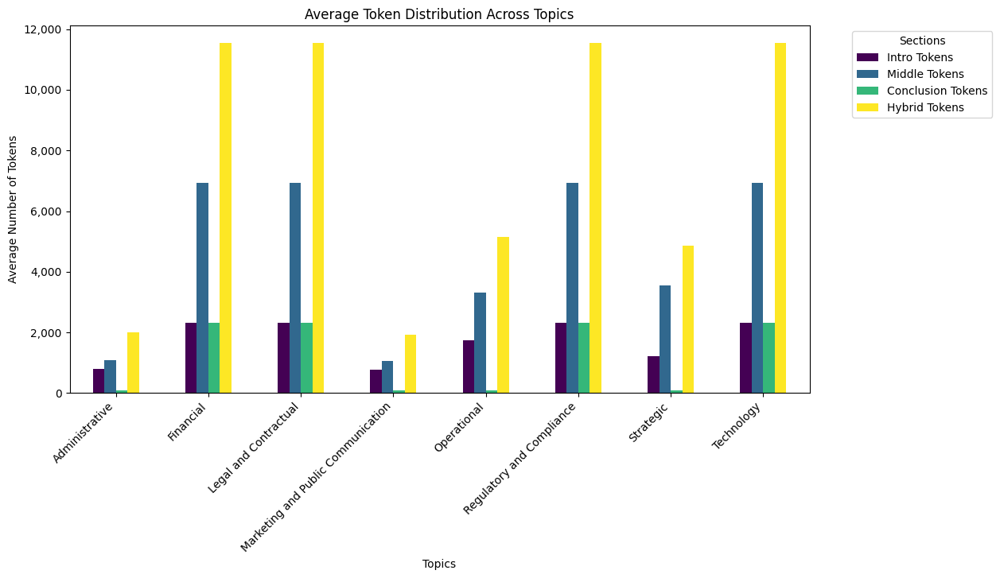


🔹 Average Hybrid Tokens Per Topic:
                                Topic  Intro Tokens  Middle Tokens  \
0                      Administrative         801.0         1094.0   
1                           Financial        2307.0         6924.0   
2               Legal and Contractual        2307.0         6924.0   
3  Marketing and Public Communication         775.0         1057.0   
4                         Operational        1730.0         3314.0   
5           Regulatory and Compliance        2307.0         6924.0   
6                           Strategic        1207.0         3545.0   
7                          Technology        2307.0         6924.0   

   Conclusion Tokens  Hybrid Tokens  
0              100.0         1995.0  
1             2307.0        11538.0  
2             2307.0        11538.0  
3              100.0         1932.0  
4              100.0         5144.0  
5             2307.0        11538.0  
6              100.0         4852.0  
7             2307.0        1

In [65]:
import matplotlib.pyplot as plt
import pandas as pd

# Function to count tokens (words) in a text sample
def count_tokens(text):
    return len(text.split())

# Store token counts
token_counts = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v7(text, topic)
    hybrid_text = f"{intro} {middle} {conclusion}"

    intro_tokens = count_tokens(intro)
    middle_tokens = count_tokens(middle)
    conclusion_tokens = count_tokens(conclusion)
    hybrid_tokens = count_tokens(hybrid_text)

    token_counts.append([topic, intro_tokens, middle_tokens, conclusion_tokens, hybrid_tokens])

# Convert to DataFrame
df_tokens = pd.DataFrame(token_counts, 
                         columns=["Topic", "Intro Tokens", "Middle Tokens", "Conclusion Tokens", "Hybrid Tokens"])

# Compute average number of tokens per topic
df_avg_tokens_per_topic = df_tokens.groupby("Topic").mean().reset_index()

# Plot average token distribution across topics
plt.figure(figsize=(12, 6))
ax = df_avg_tokens_per_topic.set_index("Topic").plot(kind="bar", figsize=(12, 6), colormap="viridis")
plt.title("Average Token Distribution Across Topics")
plt.ylabel("Average Number of Tokens")
plt.xlabel("Topics")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Sections", bbox_to_anchor=(1.05, 1), loc='upper left')

# Format y-axis to show whole numbers instead of scientific notation
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.show()

# Display table of average hybrid tokens per topic
print("\n🔹 Average Hybrid Tokens Per Topic:")
print(df_avg_tokens_per_topic)


### Modified Code to Display Similarity for Subtopics

In [77]:
import random

# Modify function to enforce token limit while returning separate intro, middle, and conclusion
def extract_intro_middle_conclusion_v8(text, topic, max_tokens=20000):  
    words = text.split()
    total_words = len(words)

    # **Set dynamic extraction ratios based on document length**
    if total_words < 5000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.15, 0.15, 0.15
    elif total_words < 20000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.08, 0.12, 0.08
    elif total_words < 50000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.04, 0.08, 0.04
    else:
        intro_ratio, middle_ratio, conclusion_ratio = 0.02, 0.06, 0.02

    # **Ensure at least 100 words extracted**
    min_length = 100
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    # **Middle Section Sampling**
    middle_start = intro_end
    middle_end = conclusion_start
    middle_range = words[middle_start:middle_end]

    if len(middle_range) > min_length:
        middle_sample_size = int(len(middle_range) * middle_ratio)
        middle_sample = random.sample(middle_range, min(middle_sample_size, len(middle_range)))
    else:
        middle_sample = middle_range

    # **Assemble Hybrid Text**
    intro_text = words[:intro_end]
    middle_text = middle_sample
    conclusion_text = words[conclusion_start:]
    
    hybrid_text_words = intro_text + middle_text + conclusion_text

    # **Estimate Token Usage**
    estimated_tokens = len(hybrid_text_words) * 1.3  # Approximate token count

    # **Truncate if Exceeding Token Limit**
    if estimated_tokens > max_tokens:
        allowed_words = int(max_tokens / 1.3)  # Adjust word limit based on estimated tokens
        hybrid_text_words = hybrid_text_words[:allowed_words]

        # **Redistribute to keep sections separate but within limit**
        new_intro_end = max(int(len(hybrid_text_words) * (intro_ratio / (intro_ratio + middle_ratio + conclusion_ratio))), min_length)
        new_conclusion_start = max(len(hybrid_text_words) - int(len(hybrid_text_words) * (conclusion_ratio / (intro_ratio + middle_ratio + conclusion_ratio))), min_length)

        intro_text = hybrid_text_words[:new_intro_end]
        middle_text = hybrid_text_words[new_intro_end:new_conclusion_start]
        conclusion_text = hybrid_text_words[new_conclusion_start:]

    return " ".join(intro_text), " ".join(middle_text), " ".join(conclusion_text)


In [78]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

tfidf_vectorizer = TfidfVectorizer()

# Store similarity scores
similarity_results = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v8(text, topic)

    # Combine extracted sections
    hybrid_text = f"{intro} {middle} {conclusion}"

    # List of documents for TF-IDF
    docs = [intro, conclusion, hybrid_text, text]  # Hybrid approach vs full text
    tfidf_matrix = tfidf_vectorizer.fit_transform(docs)  # Convert to TF-IDF

    # Compute cosine similarity
    intro_sim = cosine_similarity(tfidf_matrix[0], tfidf_matrix[3])[0][0]  # Intro vs Full
    conclusion_sim = cosine_similarity(tfidf_matrix[1], tfidf_matrix[3])[0][0]  # Conclusion vs Full
    hybrid_sim = cosine_similarity(tfidf_matrix[2], tfidf_matrix[3])[0][0]  # Hybrid vs Full

    similarity_results.append([topic, intro_sim, conclusion_sim, hybrid_sim])

# Convert to DataFrame
df_similarity = pd.DataFrame(similarity_results, 
                             columns=["Topic", "Intro Similarity", "Conclusion Similarity", "Hybrid Similarity"])

# **Sort by Topic for better comparison**
df_similarity = df_similarity.sort_values(by="Topic").reset_index(drop=True)

# Save results
df_similarity.to_csv("tfidf_hybrid_similarity_analysis.csv", index=False)

# **Pretty Print DataFrame for Comparison**
pd.set_option("display.float_format", "{:,.6f}".format)  # Ensures uniform decimal places
print("\n🔹 TF-IDF Similarity Scores for Hybrid Approach:\n")
print(df_similarity.to_string(index=False, justify="left"))  # Ensures clean alignment



🔹 TF-IDF Similarity Scores for Hybrid Approach:

Topic                                                    Intro Similarity  Conclusion Similarity  Hybrid Similarity
                                         Administrative 0.630968          0.170435               0.843923          
                             Financial - Annual Reports 0.403886          0.800028               0.839125          
                       Financial - Financial Statements 0.793882          0.323598               0.837099          
             Financial - Investment and Market Research 0.510064          0.217807               0.863231          
     Financial - Risk Assessment Reports and Frameworks 0.740117          0.896069               0.948112          
              Legal and Contractual - Client Agreements 0.591685          0.144353               0.940797          
                    Legal and Contractual - Derivatives 0.630865          0.210446               0.954033          
                     L

<Figure size 1200x600 with 0 Axes>

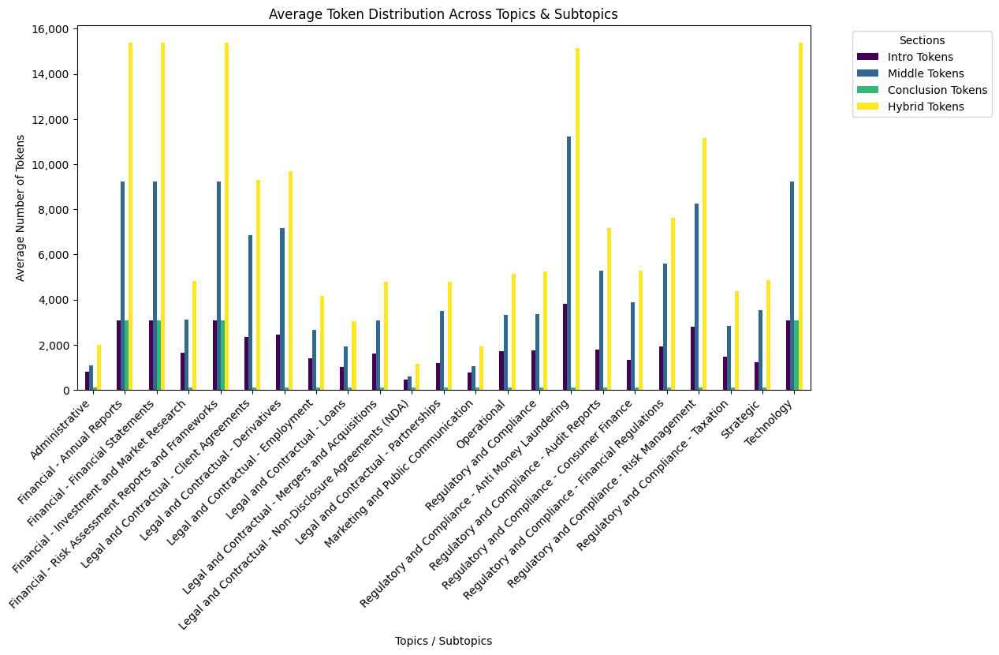


🔹 Average Hybrid Tokens Per Topic:
                                                Topic  Intro Tokens  \
0                                      Administrative           801   
1                          Financial - Annual Reports          3076   
2                    Financial - Financial Statements          3076   
3          Financial - Investment and Market Research          1627   
4   Financial - Risk Assessment Reports and Framew...          3076   
5           Legal and Contractual - Client Agreements          2337   
6                 Legal and Contractual - Derivatives          2435   
7                  Legal and Contractual - Employment          1388   
8                       Legal and Contractual - Loans          1009   
9    Legal and Contractual - Mergers and Acquisitions          1608   
10  Legal and Contractual - Non-Disclosure Agreeme...           450   
11               Legal and Contractual - Partnerships          1191   
12                 Marketing and Public C

In [88]:
import matplotlib.pyplot as plt
import pandas as pd

# Function to count tokens (words) in a text sample
def count_tokens(text):
    return len(text.split())

# Store token counts
token_counts = []

for topic, text in combined_texts.items():
    intro, middle, conclusion = extract_intro_middle_conclusion_v8(text, topic)
    hybrid_text = f"{intro} {middle} {conclusion}"

    intro_tokens = count_tokens(intro)
    middle_tokens = count_tokens(middle)
    conclusion_tokens = count_tokens(conclusion)
    hybrid_tokens = count_tokens(hybrid_text)

    token_counts.append([topic, intro_tokens, middle_tokens, conclusion_tokens, hybrid_tokens])

# Convert to DataFrame
df_tokens = pd.DataFrame(token_counts, 
                         columns=["Topic", "Intro Tokens", "Middle Tokens", "Conclusion Tokens", "Hybrid Tokens"])

# **Round numerical columns only (exclude "Topic")**
numeric_columns = ["Intro Tokens", "Middle Tokens", "Conclusion Tokens", "Hybrid Tokens"]
df_tokens[numeric_columns] = df_tokens[numeric_columns].round(0).astype(int)

# Compute average number of tokens per topic
df_avg_tokens_per_topic = df_tokens.groupby("Topic")[numeric_columns].mean().reset_index()

# **Ensure averages are also whole numbers**
df_avg_tokens_per_topic[numeric_columns] = df_avg_tokens_per_topic[numeric_columns].round(0).astype(int)

# **Plot average token distribution across topics and subtopics**
plt.figure(figsize=(12, 6))
ax = df_avg_tokens_per_topic.set_index("Topic").plot(kind="bar", figsize=(12, 6), colormap="viridis")
plt.title("Average Token Distribution Across Topics & Subtopics")
plt.ylabel("Average Number of Tokens")
plt.xlabel("Topics / Subtopics")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Sections", bbox_to_anchor=(1.05, 1), loc='upper left')

# **Format y-axis to show whole numbers instead of scientific notation**
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.show()

# **Display table of average hybrid tokens per topic without decimals**
pd.set_option("display.float_format", "{:,.0f}".format)  # No decimals
print("\n🔹 Average Hybrid Tokens Per Topic:")
print(df_avg_tokens_per_topic)


## Final Code to Extract Samples

In [95]:
import random

# Modify function to enforce token limit while returning separate intro, middle, and conclusion
def extract_intro_middle_conclusion_v8(text, topic, max_tokens=20000):  
    words = text.split()
    total_words = len(words)

    # **Set dynamic extraction ratios based on document length**
    if total_words < 5000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.15, 0.15, 0.15
    elif total_words < 20000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.08, 0.12, 0.08
    elif total_words < 50000:
        intro_ratio, middle_ratio, conclusion_ratio = 0.04, 0.08, 0.04
    else:
        intro_ratio, middle_ratio, conclusion_ratio = 0.02, 0.06, 0.02

    # **Ensure at least 100 words extracted**
    min_length = 100
    intro_end = max(int(total_words * intro_ratio), min_length)
    conclusion_start = max(int(total_words * (1 - conclusion_ratio)), total_words - min_length)

    # **Middle Section Sampling**
    middle_start = intro_end
    middle_end = conclusion_start
    middle_range = words[middle_start:middle_end]

    if len(middle_range) > min_length:
        middle_sample_size = int(len(middle_range) * middle_ratio)
        middle_sample = random.sample(middle_range, min(middle_sample_size, len(middle_range)))
    else:
        middle_sample = middle_range

    # **Assemble Hybrid Text**
    intro_text = words[:intro_end]
    middle_text = middle_sample
    conclusion_text = words[conclusion_start:]
    
    hybrid_text_words = intro_text + middle_text + conclusion_text

    # **Estimate Token Usage**
    estimated_tokens = len(hybrid_text_words) * 1.3  # Approximate token count

    # **Truncate if Exceeding Token Limit**
    if estimated_tokens > max_tokens:
        allowed_words = int(max_tokens / 1.3)  # Adjust word limit based on estimated tokens
        hybrid_text_words = hybrid_text_words[:allowed_words]

        # **Redistribute to keep sections separate but within limit**
        new_intro_end = max(int(len(hybrid_text_words) * (intro_ratio / (intro_ratio + middle_ratio + conclusion_ratio))), min_length)
        new_conclusion_start = max(len(hybrid_text_words) - int(len(hybrid_text_words) * (conclusion_ratio / (intro_ratio + middle_ratio + conclusion_ratio))), min_length)

        intro_text = hybrid_text_words[:new_intro_end]
        middle_text = hybrid_text_words[new_intro_end:new_conclusion_start]
        conclusion_text = hybrid_text_words[new_conclusion_start:]

    return " ".join(intro_text), " ".join(middle_text), " ".join(conclusion_text)


In [ ]:

# Define input and output directories
input_directory = "Cleaned_Data_v5"  # Please enter raw text folder
output_directory = "Extracted_Sample_Data"  # Please enter folder to store extracted hybrid texts

# Ensure output directory exists
os.makedirs(output_directory, exist_ok=True)

def process_text_files(input_directory, output_directory):
    """
    Reads text files from the input directory, applies hybrid text extraction, 
    and saves the hybrid extracted text into a structured output directory.
    """
    for main_topic in os.listdir(input_directory):
        main_topic_path = os.path.join(input_directory, main_topic)
        output_main_topic_path = os.path.join(output_directory, main_topic)

        if os.path.isdir(main_topic_path): 
            for root, _, files in os.walk(main_topic_path):
                relative_path = os.path.relpath(root, input_directory)  
                output_subfolder_path = os.path.join(output_directory, relative_path)

                os.makedirs(output_subfolder_path, exist_ok=True)  # Create output folder

                for file in files:
                    if file.endswith(".txt"):
                        file_path = os.path.join(root, file)

                        with open(file_path, "r", encoding="utf-8") as f:
                            content = f.read()

                        # Extract hybrid section
                        intro, middle, conclusion = extract_intro_middle_conclusion_v8(content, main_topic)
                        hybrid_text = f"{intro} {middle} {conclusion}"

                        # Define new filename for hybrid text
                        base_filename = os.path.splitext(file)[0]  # Remove .txt extension
                        hybrid_path = os.path.join(output_subfolder_path, f"{base_filename}_extracted.txt")

                        # Save hybrid text
                        with open(hybrid_path, "w", encoding="utf-8") as f:
                            f.write(hybrid_text)

                        print(f"Processed: {file} → Hybrid text saved to {output_subfolder_path}")

# Run the extraction process
process_text_files(input_directory, output_directory)


Processed: 243 - Winning Strategies for B2B SaaS Companies - BCG - www.bcg.com.txt → Hybrid text saved to Extracted_Data_v2/Marketing and Public Communication
Processed: 244 - Global Search Engine Decision on The Future of Third-Party Cookies - BCG - www.bcg.com.txt → Hybrid text saved to Extracted_Data_v2/Marketing and Public Communication
Processed: personalization-in-action.txt → Hybrid text saved to Extracted_Data_v2/Marketing and Public Communication
Processed: 242 - Loyalty Programs and Customer Expectations Are Growing - BCG - www.bcg.com.txt → Hybrid text saved to Extracted_Data_v2/Marketing and Public Communication
Processed: 245 - GenAI’s Influence on Future Creativity in Marketing - BCG - www.bcg.com.txt → Hybrid text saved to Extracted_Data_v2/Marketing and Public Communication
Processed: what-consumers-want-from-personalization.txt → Hybrid text saved to Extracted_Data_v2/Marketing and Public Communication
Processed: the-blueprint-for-ai-powered-marketing.txt → Hybrid text

### Evaluating Rule-Based Classification Results on Sample

 Loaded 20 topics from extracted words.
 Classified 157 documents.
 204 documents (56.51%) require LLM intervention.

🔹 Classification Performance Report (Excluding LLM Needed):
                                    precision    recall  f1-score     support
Administrative                       1.000000  1.000000  1.000000    3.000000
Annual Reports                       1.000000  0.934426  0.966102   61.000000
Anti Money Laundering                1.000000  0.888889  0.941176    9.000000
Audit Reports                        0.800000  1.000000  0.888889    8.000000
Client Agreements                    1.000000  1.000000  1.000000    3.000000
Consumer Finance                     0.666667  1.000000  0.800000    4.000000
Employment                           1.000000  1.000000  1.000000    1.000000
Financial Regulations                0.500000  0.800000  0.615385    5.000000
Investment and Market Research       0.666667  1.000000  0.800000    6.000000
Loans                                1.000

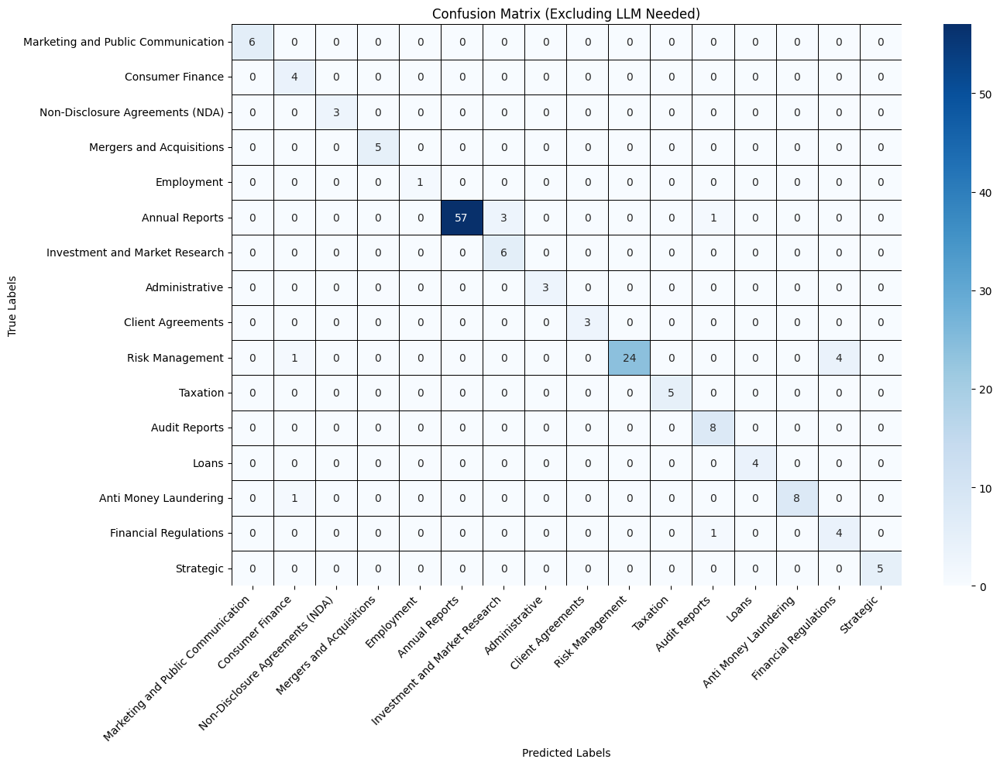

In [99]:
import os
import pandas as pd
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.metrics import classification_report, confusion_matrix
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
import math

# Load NLTK Lemmatizer
lemmatizer = WordNetLemmatizer()

# -------------------------------------
# 🔹 **Step 1: Load Extracted TF-IDF + Bigrams**
# -------------------------------------
top_keywords_per_topic = {}
main_topics = set()

# Load refined TF-IDF bigrams file
df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  

for index, row in df.iterrows():
    topic_name = row.iloc[0].strip()
    keywords = [row[col] for col in df.columns[1:] if pd.notna(row[col])]
    
    if keywords:
        top_keywords_per_topic[topic_name] = keywords[:150]  
        main_topics.add(topic_name.split("/")[0])  

print(f" Loaded {len(top_keywords_per_topic)} topics from extracted words.")

# -------------------------------------
# 🔹 **Step 2: Tokenization & Preprocessing**
# -------------------------------------
vectorizer = CountVectorizer(
    stop_words="english",
    lowercase=True,
    token_pattern=r"(?u)\b\w+\b",  
    ngram_range=(1, 2)  
)

def fast_tokenize(text):
    """Tokenizes text using CountVectorizer to include both words & bigrams."""
    return set(vectorizer.build_analyzer()(text))

# -------------------------------------
# 🔹 **Step 3: Adjusted Rule-Based Classification**
# -------------------------------------
low_precision_categories = {}  

# Include strict categories here if we wish to have higher confidence for certain topics.
STRICT_CATEGORIES = {}
CONFIDENCE_MARGIN = 1.0  

def apply_length_penalty(score, doc_length):
    """Applies a logarithmic penalty for long documents to prevent inflated confidence."""
    return score / (1 + math.log(1 + doc_length)/70)

def classify_document(text):
    """Classifies a document using an enhanced rule-based system with stricter confidence filtering."""
    
    doc_words = fast_tokenize(text)  
    doc_length = len(doc_words)

    #  If document is too short, defer to LLM
    if doc_length < 100:
        return "LLM Needed", 0.0  

    best_main_match, best_main_score = None, 0
    second_best_score = 0  # Track second-best topic confidence
    
    #  First Pass: Identify the **Main Topic**
    for topic in main_topics:
        topic_keywords = set(word for subtopic in top_keywords_per_topic if subtopic.startswith(topic) for word in top_keywords_per_topic[subtopic])
        matched_words = doc_words.intersection(topic_keywords)

        weighted_score = sum(1.0 * (0.85 ** idx) for idx, word in enumerate(matched_words))
        max_possible_score = sum(1.0 * (0.85 ** idx) for idx in range(len(topic_keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0
        
        #  Apply length penalty
        adjusted_score = apply_length_penalty(normalized_score, doc_length)

        if adjusted_score > best_main_score and len(matched_words) >= 30:
            second_best_score = best_main_score  # Update second-best score
            best_main_score = adjusted_score
            best_main_match = topic

    #  Ensure Strict Categories have higher scores than second-best topic
    if best_main_match in STRICT_CATEGORIES and best_main_score < second_best_score * CONFIDENCE_MARGIN:
        return "LLM Needed", best_main_score

    #  If no confident main topic is found, defer to LLM
    if best_main_score < 0.9 or best_main_match in low_precision_categories:
        return "LLM Needed", best_main_score

    return best_main_match, best_main_score

# -------------------------------------
# 🔹 **Step 4: Process All Documents**
# -------------------------------------
actual_topics, predicted_topics, document_confidences, document_filenames = [], [], [], []
llm_needed_actual, llm_needed_filenames, llm_needed_confidences = [], [], []

data_dir = "Extracted_Sample_Data"

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()  
            
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()

                    # Classify document
                    predicted_category, confidence = classify_document(content)
                    sub_topic_cleaned = sub_topic.split("/")[-1]  

                    if predicted_category == "LLM Needed":
                        llm_needed_actual.append(sub_topic_cleaned)
                        llm_needed_filenames.append(file)
                        llm_needed_confidences.append(confidence)
                    else:
                        actual_topics.append(sub_topic_cleaned)
                        predicted_topics.append(predicted_category)
                        document_confidences.append(confidence)
                        document_filenames.append(file)

print(f" Classified {len(actual_topics)} documents.")
print(f" {len(llm_needed_actual)} documents ({len(llm_needed_actual) / (len(actual_topics) + len(llm_needed_actual)) * 100:.2f}%) require LLM intervention.")

# -------------------------------------
# 🔹 **Step 5: Save Classification Report & Confusion Matrix**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")  
df_results = pd.DataFrame({
    "Filename": document_filenames,
    "Actual Topic": actual_topics,
    "Predicted Topic": predicted_topics,
    "Confidence": document_confidences
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)

print("\n🔹 Classification Performance Report (Excluding LLM Needed):")
report_df = pd.DataFrame(classification_report(actual_topics, predicted_topics, output_dict=True)).transpose()
report_df.to_csv(f"classification_report_{timestamp}.csv", index=True)
print(report_df)

# Generate Confusion Matrix
plt.figure(figsize=(14, 10))  
conf_matrix = confusion_matrix(actual_topics, predicted_topics, labels=list(set(actual_topics)))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(set(actual_topics)), 
            yticklabels=list(set(actual_topics)),
            linewidths=0.5, linecolor='black')  

plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")  
plt.yticks(rotation=0)  
plt.tight_layout()
plt.show()


# Goal 3: Closing the Feedback Loop

In [ ]:
from sklearn.tree import DecisionTreeClassifier
import pandas as pd
import numpy as np

# Load previous rule-based classification results & feedback
df_rules = pd.read_csv("refined_tfidf_bigrams.csv")
df_feedback = pd.read_csv("user_feedback.csv")

# Merge user feedback with original classification results
df_combined = pd.concat([df_rules, df_feedback], ignore_index=True)

# Convert TF-IDF word presence into feature vectors (simplified)
feature_columns = [col for col in df_rules.columns if "Word_" in col]  
X = df_combined[feature_columns].fillna(0)  # Use TF-IDF scores as features
y = df_combined["User Corrected Label"].fillna(df_combined["Predicted Category"])  # Use feedback when available

# Train Decision Tree
clf = DecisionTreeClassifier(max_depth=10)
clf.fit(X, y)

# Save model
import joblib
joblib.dump(clf, "trained_rule_based_classifier.pkl")


 Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 361 documents for classification.
Extracting TF-IDF Features...
Training Decision Tree Model...
Classifying Test Documents...
Classification results saved as classification_results_20250310_173236.csv
5 documents (6.85%) require LLM intervention.
68 documents (93.15%) were classified.
Evaluating Model (Excluding LLM Needed)...

 Classification Report:
                                    precision    recall  f1-score    support
Administrative                       0.000000  0.000000  0.000000   1.000000
Annual Reports                       1.000000  0.916667  0.956522  24.000000
Anti Money Laundering                1.000000  0.833333  0.909091   6.000000
Audit Reports                        0.400000  0.666667  0.500000   3.000000
Client Agreements                    0.000000  0.000000  0.000000   1.000000
Consumer Finance                     0.500000  0.500000  0.500000   2.000000
Employment                           0.00

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

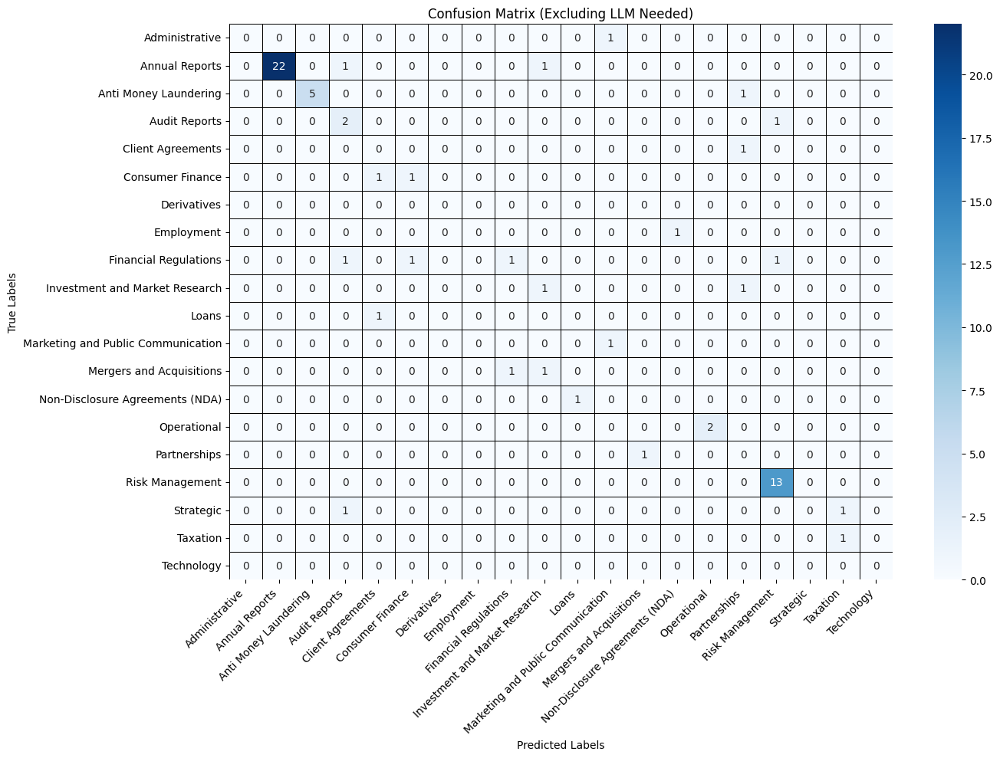

Model Training & Classification Complete!


In [116]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from nltk.tokenize import word_tokenize

# -------------------------------------
#  **Step 1: Load & Preprocess Data**
# -------------------------------------
print(" Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# -------------------------------------
#  **Step 2: Load & Process Documents**
# -------------------------------------
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# -------------------------------------
#  **Step 3: Extract TF-IDF Features**
# -------------------------------------
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=3000,  
    max_df=0.85,
    min_df=3,
    ngram_range=(1, 2)  
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# -------------------------------------
#  **Step 4: Train Decision Tree Classifier**
# -------------------------------------
print("Training Decision Tree Model...")
dt_model = DecisionTreeClassifier(max_depth=25, random_state=42)
dt_model.fit(X_train, y_train)

# -------------------------------------
#  **Step 5: Classify Unseen Test Documents**
# -------------------------------------
print("Classifying Test Documents...")
y_pred_proba = dt_model.predict_proba(X_test)  # Get confidence scores
confidence_threshold = 0.6  # Threshold for LLM deferral

y_pred_final = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
    else:
        y_pred_final.append(dt_model.classes_[np.argmax(probs)])

# -------------------------------------
#  **Step 6: Store Classification Results**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# -------------------------------------
#  **Step 7: Compute LLM Needed Documents**
# -------------------------------------
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"{len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified.")

# -------------------------------------
#  **Step 8: Evaluate Model (Excluding LLM Deferrals)**
# -------------------------------------
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\n Classification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=dt_model.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=dt_model.classes_, 
            yticklabels=dt_model.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")


### Decision Trees

Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 361 documents for classification.
Extracting TF-IDF Features...
Training Decision Tree Model...
Classifying Test Documents...
Classification results saved as classification_results_20250310_194352.csv
⚡ 53 documents (72.60%) require LLM intervention.
20 documents (27.40%) were classified with high confidence.
Evaluating Model (Excluding LLM Needed)...

Classification Report:
                                    precision    recall  f1-score  support
Administrative                       0.000000  0.000000  0.000000     1.00
Annual Reports                       0.000000  0.000000  0.000000     2.00
Anti Money Laundering                1.000000  1.000000  1.000000     3.00
Audit Reports                        0.500000  1.000000  0.666667     2.00
Client Agreements                    0.000000  0.000000  0.000000     0.00
Consumer Finance                     0.333333  0.500000  0.400000     2.00
Employment                      

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_pr

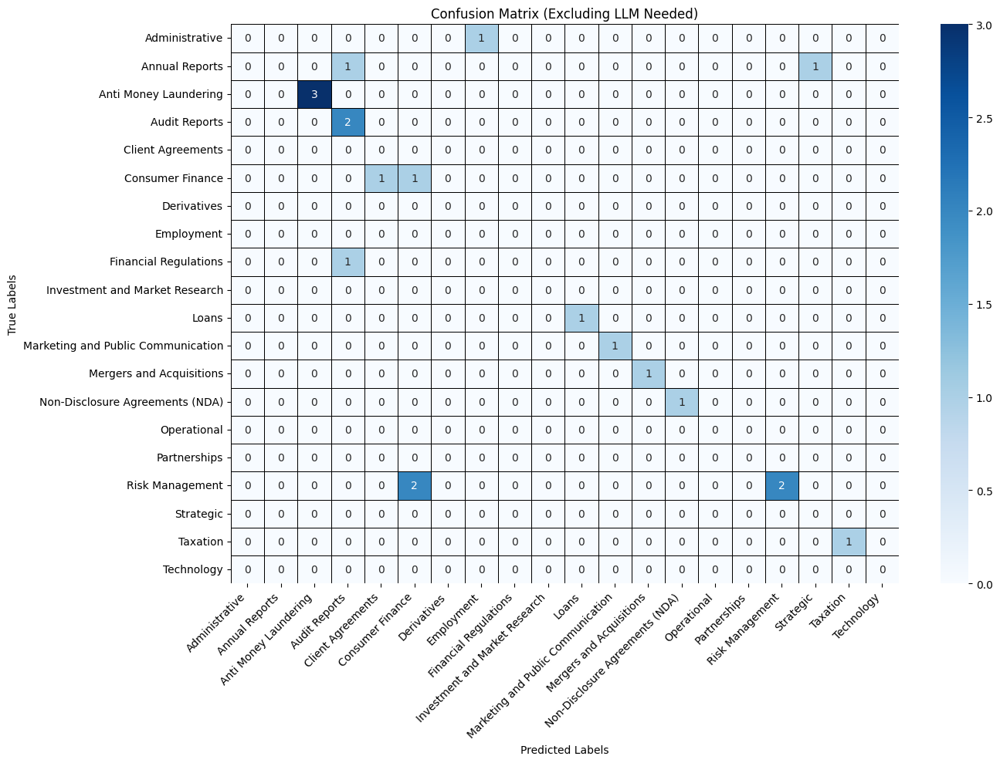

Model Training & Classification Complete!


In [129]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from nltk.tokenize import word_tokenize

# -------------------------------------
# **Step 1: Load & Preprocess Data**
# -------------------------------------
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# -------------------------------------
# **Step 2: Load & Process Documents**
# -------------------------------------
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# -------------------------------------
# **Step 3: Extract TF-IDF Features**
# -------------------------------------
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=3000,  
    max_df=0.85,
    min_df=3,
    ngram_range=(1, 2)  
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# -------------------------------------
# **Step 4: Train Optimized Decision Tree Classifier**
# -------------------------------------
print("Training Decision Tree Model...")
dt_model = DecisionTreeClassifier(
    max_depth=15,  # Prevent overfitting
    min_samples_split=5,  # Require more samples before splitting
    min_samples_leaf=5,  # Avoid too small leaves (helps with probability smoothing)
    class_weight="balanced",  # Handle class imbalance
    random_state=42
)
dt_model.fit(X_train, y_train)

# -------------------------------------
# **Step 5: Classify Unseen Test Documents with High Confidence Only**
# -------------------------------------
print("Classifying Test Documents...")
y_pred_proba = dt_model.predict_proba(X_test)  # Get probability scores
confidence_threshold = 0.95  # **Super High Confidence Required**

y_pred_final = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    sorted_probs = sorted(probs, reverse=True)
    second_best_prob = sorted_probs[1] if len(sorted_probs) > 1 else 0

    # **Ensure the classifier is VERY confident before making a decision**
    if max_prob < confidence_threshold or (max_prob - second_best_prob) < 0.15:
        y_pred_final.append("LLM Needed")  # Defer to LLM
    else:
        y_pred_final.append(dt_model.classes_[np.argmax(probs)])

# -------------------------------------
# **Step 6: Store Classification Results**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# -------------------------------------
# **Step 7: Compute LLM Needed Documents**
# -------------------------------------
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"⚡ {len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# -------------------------------------
# **Step 8: Evaluate Model (Excluding LLM Deferrals)**
# -------------------------------------
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\nClassification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=dt_model.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=dt_model.classes_, 
            yticklabels=dt_model.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")


### Random Forest

🔹 Loading Refined TF-IDF Bigrams...
🔹 Processing Documents...
✅ Loaded 361 documents for classification.
🔹 Extracting TF-IDF Features...
🔹 Training Random Forest Model...
🔹 Calibrating Model with Isotonic Regression...
🔹 Classifying Test Documents...
✅ Classification results saved as classification_results_20250310_200353.csv
⚡ 19 documents (26.03%) require LLM intervention.
✅ 54 documents (73.97%) were classified with high confidence.
🔹 Evaluating Model (Excluding LLM Needed)...

🔹 Classification Report:
                                    precision    recall  f1-score    support
Annual Reports                       1.000000  1.000000  1.000000  23.000000
Anti Money Laundering                1.000000  1.000000  1.000000   5.000000
Audit Reports                        0.500000  0.500000  0.500000   2.000000
Client Agreements                    0.400000  1.000000  0.571429   2.000000
Consumer Finance                     0.500000  0.500000  0.500000   2.000000
Financial Regulations      

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

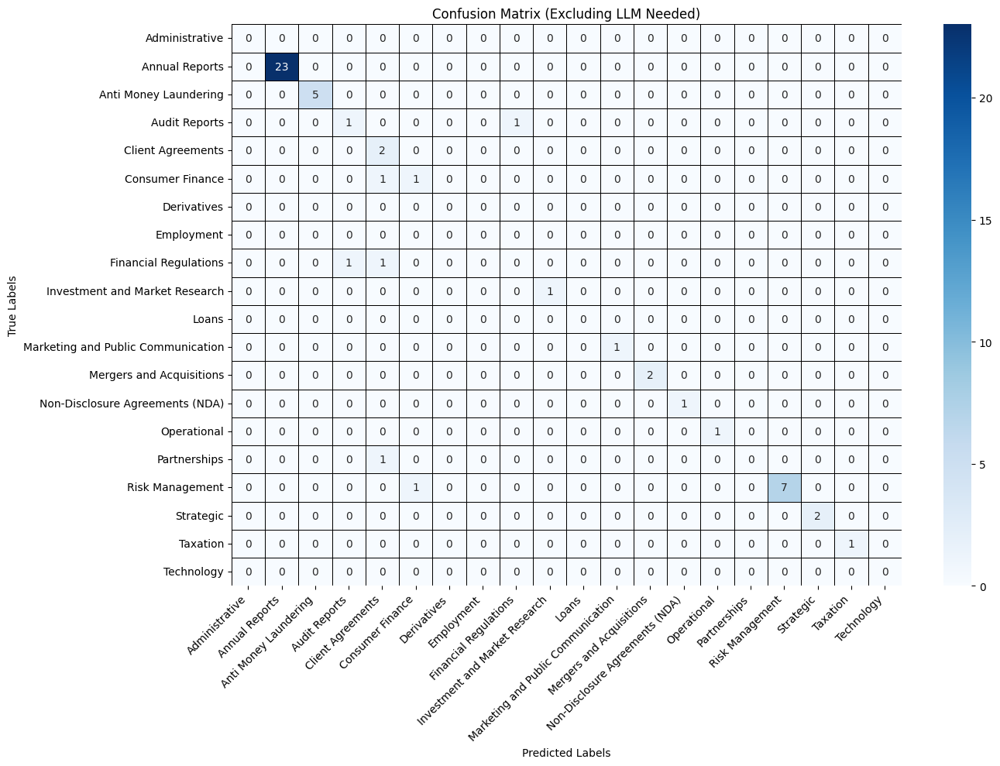

🚀 Model Training & Classification Complete!


In [134]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from nltk.tokenize import word_tokenize

# -------------------------------------
# 🔹 **Step 1: Load & Preprocess Data**
# -------------------------------------
print("🔹 Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# -------------------------------------
# 🔹 **Step 2: Load & Process Documents**
# -------------------------------------
print("🔹 Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"✅ Loaded {len(df)} documents for classification.")

# -------------------------------------
# 🔹 **Step 3: Extract TF-IDF Features**
# -------------------------------------
print("🔹 Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  # Reduce requirement for minimum occurrences
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# -------------------------------------
# 🔹 **Step 4: Train Random Forest Classifier**
# -------------------------------------
print("🔹 Training Random Forest Model...")
rf_model = RandomForestClassifier(
    n_estimators=300,  # **Increase trees for better stability**
    max_depth=20,  # Prevent overfitting
    min_samples_split=3,
    min_samples_leaf=2,
    class_weight="balanced",  # Handle class imbalance
    random_state=42,
    n_jobs=-1  # Use all CPU cores
)

rf_model.fit(X_train, y_train)  # Train the RandomForest model first

# ✅ **Fix: Ensure Model is Fully Trained Before Calibration**
print("🔹 Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")  # Use prefit since we can't use cross-validation
calibrated_rf.fit(X_train, y_train)  # Calibrate the probabilities

# -------------------------------------
# 🔹 **Step 5: Classify Test Documents**
# -------------------------------------
print("🔹 Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test)  # Get probability scores
confidence_threshold = 0.90  # **Higher Confidence Required**

y_pred_final = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is very high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])

# -------------------------------------
# 🔹 **Step 6: Store Classification Results**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"✅ Classification results saved as classification_results_{timestamp}.csv")

# -------------------------------------
# 🔹 **Step 7: Compute LLM Needed Documents**
# -------------------------------------
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"⚡ {len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"✅ {len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# -------------------------------------
# 🔹 **Step 8: Evaluate Model (Excluding LLM Deferrals)**
# -------------------------------------
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("🔹 Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\n🔹 Classification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("🚀 Model Training & Classification Complete!")


🔹 Loading Refined TF-IDF Bigrams...
🔹 Processing Documents...
✅ Loaded 361 documents for classification.
🔹 Extracting TF-IDF Features...
🔹 Performing Hyperparameter Tuning...
Fitting 3 folds for each of 81 candidates, totalling 243 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=3.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/

✅ Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 500}
🔹 Calibrating Model with Isotonic Regression...
🔹 Classifying Test Documents...
✅ Classification results saved as classification_results_20250310_202307.csv
⚡ 20 documents (27.40%) require LLM intervention.
✅ 53 documents (72.60%) were classified with high confidence.
🔹 Evaluating Model (Excluding LLM Needed)...

🔹 Classification Report:
                                    precision    recall  f1-score   support
Annual Reports                       1.000000  1.000000  1.000000  24.00000
Anti Money Laundering                0.857143  1.000000  0.923077   6.00000
Audit Reports                        0.500000  1.000000  0.666667   1.00000
Client Agreements                    0.500000  1.000000  0.666667   2.00000
Consumer Finance                     1.000000  0.500000  0.666667   2.00000
Financial Regulations                0.000000  0.000000  0.000000   3.00000
Investment and Mar

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

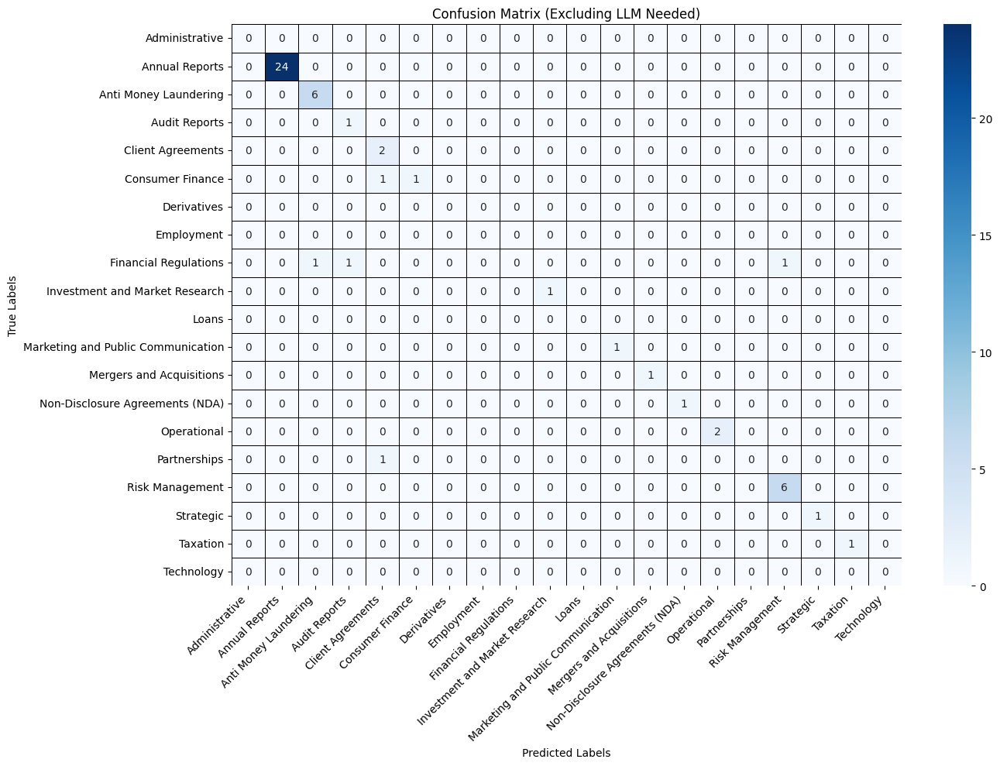

🚀 Model Training & Classification Complete!


In [135]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score
from nltk.tokenize import word_tokenize

# -------------------------------------
# 🔹 **Step 1: Load & Preprocess Data**
# -------------------------------------
print("🔹 Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# -------------------------------------
# 🔹 **Step 2: Load & Process Documents**
# -------------------------------------
print("🔹 Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"✅ Loaded {len(df)} documents for classification.")

# -------------------------------------
# 🔹 **Step 3: Extract TF-IDF Features**
# -------------------------------------
print("🔹 Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# -------------------------------------
# 🔹 **Step 4: Hyperparameter Tuning for Precision**
# -------------------------------------
print("🔹 Performing Hyperparameter Tuning...")

param_grid = {
    "n_estimators": [100, 300, 500],  
    "max_depth": [10, 20, 30],  
    "min_samples_split": [2, 3, 5],  
    "min_samples_leaf": [1, 2, 5]
}

rf_model = RandomForestClassifier(
    class_weight="balanced",  
    random_state=42,
    n_jobs=-1
)

grid_search = GridSearchCV(
    rf_model, 
    param_grid, 
    scoring="precision_macro",  
    cv=3,  
    verbose=1,  
    n_jobs=-1  
)

grid_search.fit(X_train, y_train)  

best_params = grid_search.best_params_
print(f"✅ Best Hyperparameters: {best_params}")

# Train Best Model
rf_model = RandomForestClassifier(**best_params, class_weight="balanced", random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

# ✅ **Fix: Ensure Model is Fully Trained Before Calibration**
print("🔹 Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")  
calibrated_rf.fit(X_train, y_train)

# -------------------------------------
# 🔹 **Step 5: Classify Test Documents**
# -------------------------------------
print("🔹 Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test)  
confidence_threshold = 0.90  

y_pred_final = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])

# -------------------------------------
# 🔹 **Step 6: Store Classification Results**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"✅ Classification results saved as classification_results_{timestamp}.csv")

# -------------------------------------
# 🔹 **Step 7: Compute LLM Needed Documents**
# -------------------------------------
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"⚡ {len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"✅ {len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# -------------------------------------
# 🔹 **Step 8: Evaluate Model (Excluding LLM Deferrals)**
# -------------------------------------
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("🔹 Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\n🔹 Classification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("🚀 Model Training & Classification Complete!")


🔹 Loading Refined TF-IDF Bigrams...
🔹 Processing Documents...
✅ Loaded 361 documents for classification.
🔹 Extracting TF-IDF Features...
🔹 Performing Hyperparameter Tuning...
Fitting 3 folds for each of 81 candidates, totalling 243 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=3.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/

✅ Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 500}
🔹 Calibrating Model with Isotonic Regression...
🔹 Classifying Test Documents...
✅ Classification results saved as classification_results_20250310_202307.csv
⚡ 20 documents (27.40%) require LLM intervention.
✅ 53 documents (72.60%) were classified with high confidence.
🔹 Evaluating Model (Excluding LLM Needed)...

🔹 Classification Report:
                                    precision    recall  f1-score   support
Annual Reports                       1.000000  1.000000  1.000000  24.00000
Anti Money Laundering                0.857143  1.000000  0.923077   6.00000
Audit Reports                        0.500000  1.000000  0.666667   1.00000
Client Agreements                    0.500000  1.000000  0.666667   2.00000
Consumer Finance                     1.000000  0.500000  0.666667   2.00000
Financial Regulations                0.000000  0.000000  0.000000   3.00000
Investment and Mar

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

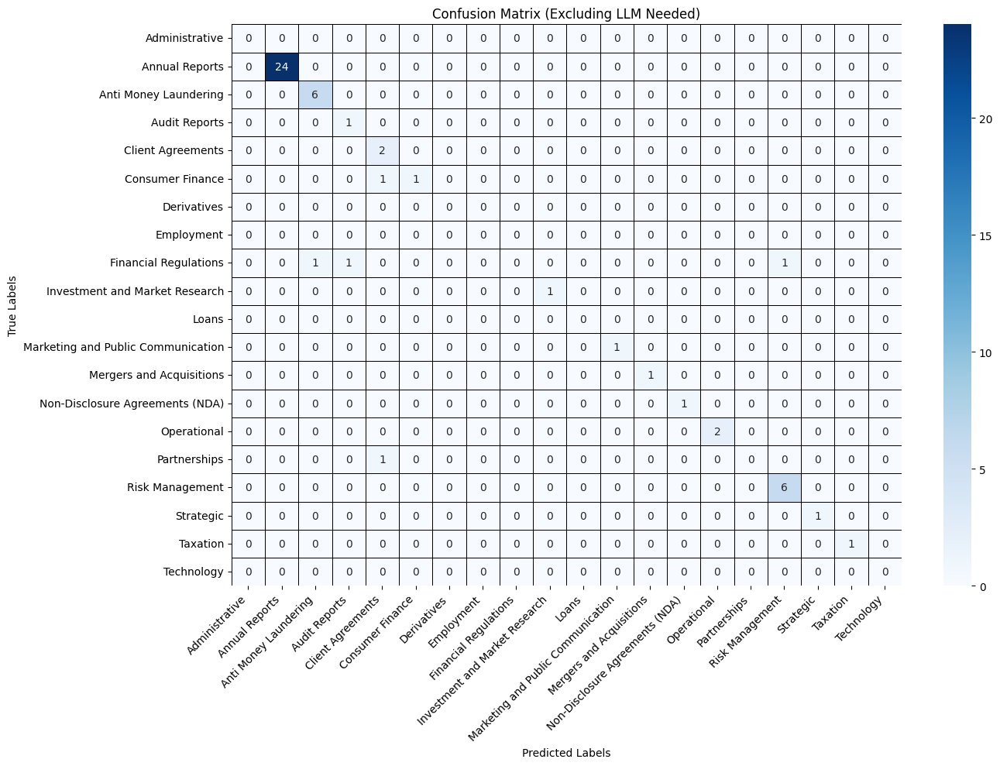

🚀 Model Training & Classification Complete!


In [ ]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score
from nltk.tokenize import word_tokenize

# -------------------------------------
# 🔹 **Step 1: Load & Preprocess Data**
# -------------------------------------
print("🔹 Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# -------------------------------------
# 🔹 **Step 2: Load & Process Documents**
# -------------------------------------
print("🔹 Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"✅ Loaded {len(df)} documents for classification.")

# -------------------------------------
# 🔹 **Step 3: Extract TF-IDF Features**
# -------------------------------------
print("🔹 Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# -------------------------------------
# 🔹 **Step 4: Hyperparameter Tuning for Precision**
# -------------------------------------
print("🔹 Performing Hyperparameter Tuning...")

param_grid = {
    "n_estimators": [100, 300, 500],  
    "max_depth": [10, 20, 30],  
    "min_samples_split": [2, 3, 5],  
    "min_samples_leaf": [1, 2, 5]
}

rf_model = RandomForestClassifier(
    class_weight="balanced",  
    random_state=42,
    n_jobs=-1
)

grid_search = GridSearchCV(
    rf_model, 
    param_grid, 
    scoring="precision_macro",  
    cv=3,  
    verbose=1,  
    n_jobs=-1  
)

grid_search.fit(X_train, y_train)  

best_params = grid_search.best_params_
print(f"✅ Best Hyperparameters: {best_params}")

# Train Best Model
rf_model = RandomForestClassifier(**best_params, class_weight="balanced", random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

# ✅ **Fix: Ensure Model is Fully Trained Before Calibration**
print("🔹 Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")  
calibrated_rf.fit(X_train, y_train)

# -------------------------------------
# 🔹 **Step 5: Classify Test Documents**
# -------------------------------------
print("🔹 Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test)  
confidence_threshold = 0.90  

y_pred_final = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])

# -------------------------------------
# 🔹 **Step 6: Store Classification Results**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"✅ Classification results saved as classification_results_{timestamp}.csv")

# -------------------------------------
# 🔹 **Step 7: Compute LLM Needed Documents**
# -------------------------------------
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"⚡ {len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"✅ {len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# -------------------------------------
# 🔹 **Step 8: Evaluate Model (Excluding LLM Deferrals)**
# -------------------------------------
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("🔹 Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\n🔹 Classification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("🚀 Model Training & Classification Complete!")


### Best Params

Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 361 documents for classification.
Extracting TF-IDF Features...
Training Random Forest Model...
Calibrating Model with Isotonic Regression...
Classifying Test Documents...
Classification results saved as classification_results_20250314_162605.csv
⚡ 32 documents (43.84%) require LLM intervention.
41 documents (56.16%) were classified with high confidence.
Evaluating Model (Excluding LLM Needed)...

Classification Report:
                                    precision    recall  f1-score   support
Annual Reports                       1.000000  1.000000  1.000000  21.00000
Anti Money Laundering                0.750000  1.000000  0.857143   3.00000
Audit Reports                        0.500000  1.000000  0.666667   1.00000
Client Agreements                    1.000000  1.000000  1.000000   2.00000
Consumer Finance                     1.000000  1.000000  1.000000   1.00000
Financial Regulations                0.000000  0.000000

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

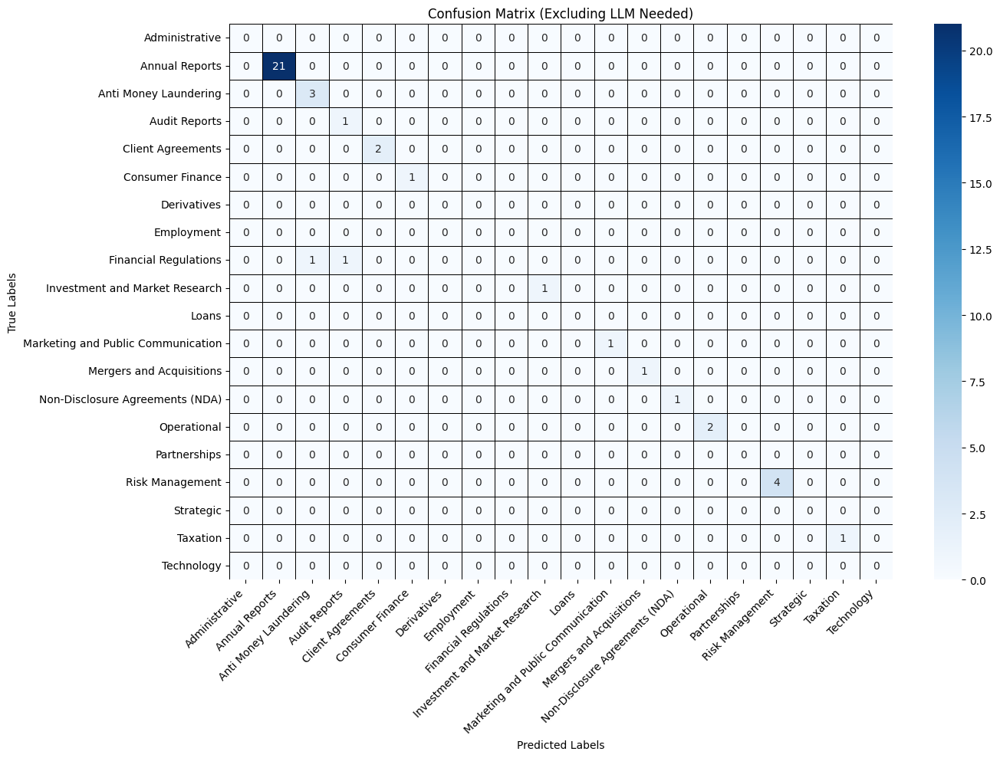

Model Training & Classification Complete!


In [ ]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from nltk.tokenize import word_tokenize

# -------------------------------------
# **Step 1: Load & Preprocess Data**
# -------------------------------------
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# -------------------------------------
# **Step 2: Load & Process Documents**
# -------------------------------------
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# -------------------------------------
# **Step 3: Extract TF-IDF Features**
# -------------------------------------
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  # Reduce requirement for minimum occurrences
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# -------------------------------------
# **Step 4: Train Random Forest Classifier**
# -------------------------------------
print("Training Random Forest Model...")
rf_model = RandomForestClassifier(
    n_estimators=500,  # **Increase trees for better stability**
    max_depth=10,  # Prevent overfitting
    min_samples_split=5,
    min_samples_leaf=2,
    class_weight="balanced",  # Handle class imbalance
    random_state=42,
    n_jobs=-1  # Use all CPU cores
)

rf_model.fit(X_train, y_train)  # Train the RandomForest model first

# **Fix: Ensure Model is Fully Trained Before Calibration**
print("Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")  # Use prefit since we can't use cross-validation
calibrated_rf.fit(X_train, y_train)  # Calibrate the probabilities

# -------------------------------------
# **Step 5: Classify Test Documents**
# -------------------------------------
print("Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test)  # Get probability scores
confidence_threshold = 0.99  # **Higher Confidence Required**

y_pred_final = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is very high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])

# -------------------------------------
# **Step 6: Store Classification Results**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# -------------------------------------
# **Step 7: Compute LLM Needed Documents**
# -------------------------------------
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"⚡ {len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# -------------------------------------
# **Step 8: Evaluate Model (Excluding LLM Deferrals)**
# -------------------------------------
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\nClassification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")


### Comparison with Initial Rule-Based Classification

Loaded 20 topics from extracted words.
Classified 34 documents.
⚡ 39 documents (53.42%) require LLM intervention.

Classification Performance Report (Excluding LLM Needed):
                                    precision    recall  f1-score    support
Administrative                       1.000000  1.000000  1.000000   1.000000
Annual Reports                       1.000000  1.000000  1.000000  15.000000
Anti Money Laundering                1.000000  1.000000  1.000000   1.000000
Audit Reports                        0.500000  1.000000  0.666667   1.000000
Client Agreements                    1.000000  1.000000  1.000000   1.000000
Financial Regulations                0.500000  0.500000  0.500000   2.000000
Investment and Market Research       1.000000  1.000000  1.000000   2.000000
Loans                                1.000000  1.000000  1.000000   1.000000
Marketing and Public Communication   1.000000  1.000000  1.000000   1.000000
Mergers and Acquisitions             1.000000  1.000000  

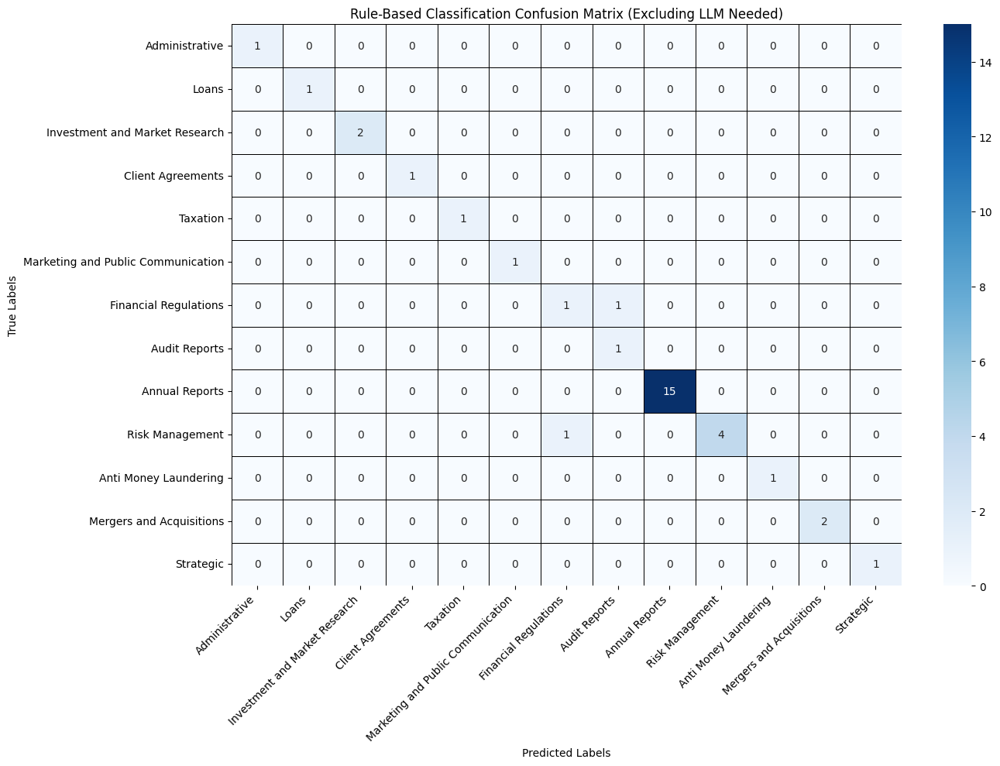

Rule-Based Classification Complete!


In [4]:
import os
import pandas as pd
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.metrics import classification_report, confusion_matrix
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
import math
from sklearn.model_selection import train_test_split

# Load NLTK Lemmatizer
lemmatizer = WordNetLemmatizer()

# -------------------------------------
# **Step 1: Load Extracted TF-IDF + Bigrams**
# -------------------------------------
top_keywords_per_topic = {}
main_topics = set()

# Load refined TF-IDF bigrams file
df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  

for index, row in df.iterrows():
    topic_name = row.iloc[0].strip()
    keywords = [row[col] for col in df.columns[1:] if pd.notna(row[col])]
    
    if keywords:
        top_keywords_per_topic[topic_name] = keywords[:150]  
        main_topics.add(topic_name.split("/")[0])  

print(f"Loaded {len(top_keywords_per_topic)} topics from extracted words.")

# -------------------------------------
# **Step 2: Tokenization & Preprocessing**
# -------------------------------------
vectorizer = CountVectorizer(
    stop_words="english",
    lowercase=True,
    token_pattern=r"(?u)\b\w+\b",  
    ngram_range=(1, 2)  
)

def fast_tokenize(text):
    """Tokenizes text using CountVectorizer to include both words & bigrams."""
    return set(vectorizer.build_analyzer()(text))

# -------------------------------------
# **Step 3: Adjusted Rule-Based Classification**
# -------------------------------------
low_precision_categories = {}  
STRICT_CATEGORIES = {}
CONFIDENCE_MARGIN = 1.0  

def apply_length_penalty(score, doc_length):
    """Applies a logarithmic penalty for long documents to prevent inflated confidence."""
    return score / (1 + math.log(1 + doc_length)/70)

def classify_document(text):
    """Classifies a document using an enhanced rule-based system with stricter confidence filtering."""
    
    doc_words = fast_tokenize(text)  
    doc_length = len(doc_words)

    #  If document is too short, defer to LLM
    if doc_length < 100:
        return "LLM Needed", 0.0  

    best_main_match, best_main_score = None, 0
    second_best_score = 0  

    #  Identify the **Main Topic**
    for topic in main_topics:
        topic_keywords = set(word for subtopic in top_keywords_per_topic if subtopic.startswith(topic) for word in top_keywords_per_topic[subtopic])
        matched_words = doc_words.intersection(topic_keywords)

        weighted_score = sum(1.0 * (0.85 ** idx) for idx, word in enumerate(matched_words))
        max_possible_score = sum(1.0 * (0.85 ** idx) for idx in range(len(topic_keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0
        
        #  Apply length penalty
        adjusted_score = apply_length_penalty(normalized_score, doc_length)

        if adjusted_score > best_main_score and len(matched_words) >= 30:
            second_best_score = best_main_score  
            best_main_score = adjusted_score
            best_main_match = topic

    #  Ensure Strict Categories have higher scores than second-best topic
    if best_main_match in STRICT_CATEGORIES and best_main_score < second_best_score * CONFIDENCE_MARGIN:
        return "LLM Needed", best_main_score

    #  If no confident main topic is found, defer to LLM
    if best_main_score < 0.9 or best_main_match in low_precision_categories:
        return "LLM Needed", best_main_score

    return best_main_match, best_main_score

# -------------------------------------
# **Step 4: Load & Process Documents (Ensure Same 20% Test Set)**
# -------------------------------------
actual_topics, predicted_topics, document_confidences, document_filenames = [], [], [], []
llm_needed_actual, llm_needed_filenames, llm_needed_confidences = [], [], []

data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()  
            
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()

                    documents.append(content)
                    labels.append(sub_topic.split("/")[-1])
                    filenames.append(file)

# Convert to DataFrame
df_all = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})

# **Ensure we split the dataset the same way as the Random Forest**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    df_all["Text"], df_all["Label"], df_all["Filename"], test_size=0.2, stratify=df_all["Label"], random_state=42
)

# **Apply Rule-Based Classification only on the 20% test set**
for i in range(len(filenames_test)):
    doc_text = X_test.iloc[i]
    filename = filenames_test.iloc[i]
    actual_topic = y_test.iloc[i]

    predicted_category, confidence = classify_document(doc_text)

    if predicted_category == "LLM Needed":
        llm_needed_actual.append(actual_topic)
        llm_needed_filenames.append(filename)
        llm_needed_confidences.append(confidence)
    else:
        actual_topics.append(actual_topic)
        predicted_topics.append(predicted_category)
        document_confidences.append(confidence)
        document_filenames.append(filename)

print(f"Classified {len(actual_topics)} documents.")
print(f"⚡ {len(llm_needed_actual)} documents ({len(llm_needed_actual) / (len(actual_topics) + len(llm_needed_actual)) * 100:.2f}%) require LLM intervention.")

# -------------------------------------
# **Step 5: Save Classification Report & Confusion Matrix**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")  
df_results = pd.DataFrame({
    "Filename": document_filenames,
    "Actual Topic": actual_topics,
    "Predicted Topic": predicted_topics,
    "Confidence": document_confidences
})
df_results.to_csv(f"rule_based_classification_results_{timestamp}.csv", index=False)

print("\nClassification Performance Report (Excluding LLM Needed):")
report_df = pd.DataFrame(classification_report(actual_topics, predicted_topics, output_dict=True)).transpose()
report_df.to_csv(f"rule_based_classification_report_{timestamp}.csv", index=True)
print(report_df)

# Generate Confusion Matrix
plt.figure(figsize=(14, 10))  
conf_matrix = confusion_matrix(actual_topics, predicted_topics, labels=list(set(actual_topics)))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(set(actual_topics)), 
            yticklabels=list(set(actual_topics)),
            linewidths=0.5, linecolor='black')  

plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Rule-Based Classification Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")  
plt.yticks(rotation=0)  
plt.tight_layout()
plt.savefig(f"rule_based_confusion_matrix_{timestamp}.png")
plt.show()

print("Rule-Based Classification Complete!")


### Final Hyper Parameter Tuning with Cross Fold Validation

#### GridSearch

Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 361 documents for classification.
Extracting TF-IDF Features...
Performing Hyperparameter Tuning...
Fitting 10 folds for each of 180 candidates, totalling 1800 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=10.
  warnings.warn(


Best Hyperparameters: {'class_weight': 'balanced', 'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 1000}
Best Cross-Validation Accuracy: 0.8092
Training Final Random Forest Model with Best Hyperparameters...
Calibrating Model with Isotonic Regression...
Classifying Test Documents...
Classification results saved as classification_results_20250314_165157.csv
⚡ 26 documents (35.62%) require LLM intervention.
47 documents (64.38%) were classified with high confidence.
Evaluating Model (Excluding LLM Needed)...

Classification Report:
                                    precision    recall  f1-score    support
Annual Reports                       1.000000  1.000000  1.000000  22.000000
Anti Money Laundering                1.000000  1.000000  1.000000   5.000000
Audit Reports                        0.500000  0.500000  0.500000   2.000000
Client Agreements                    1.000000  1.000000  1.000000   1.000000
Consumer Finance                     0.333333  

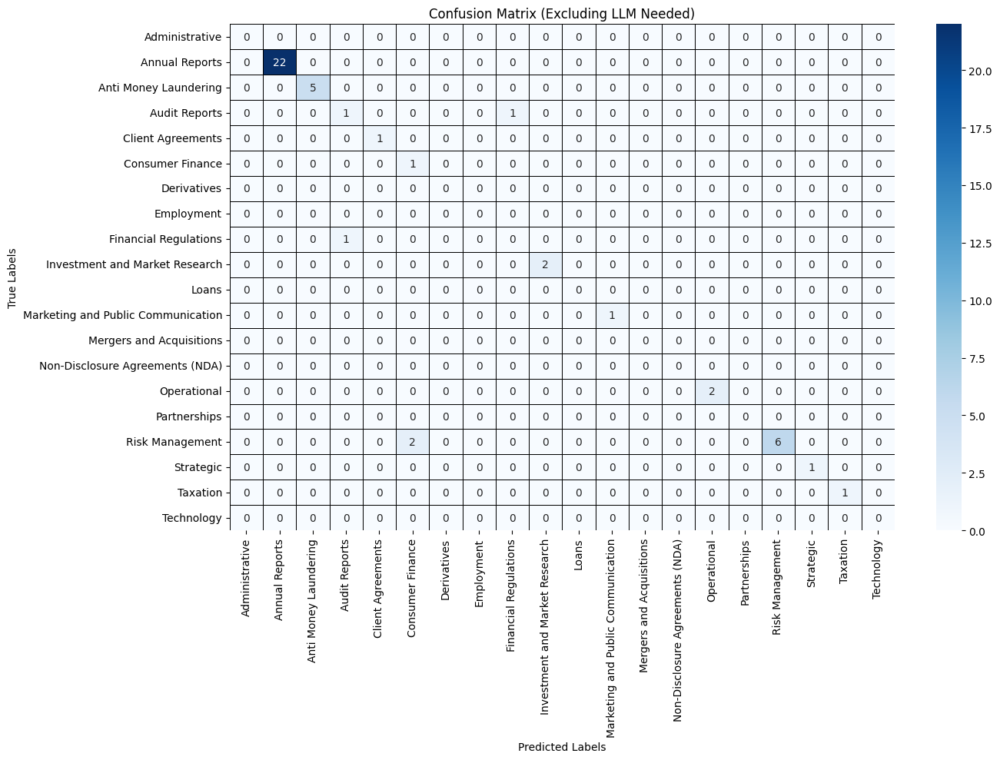

Model Training & Classification Complete!


In [11]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from nltk.tokenize import word_tokenize

# -------------------------------------
# **Step 1: Load & Preprocess Data**
# -------------------------------------
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# -------------------------------------
# **Step 2: Load & Process Documents**
# -------------------------------------
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# -------------------------------------
# **Step 3: Extract TF-IDF Features**
# -------------------------------------
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  # Reduce requirement for minimum occurrences
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# -------------------------------------
# **Step 4: Hyperparameter Tuning with GridSearchCV**
# -------------------------------------
print("Performing Hyperparameter Tuning...")

param_grid = {
    "n_estimators": [200, 500, 1000],  # Number of trees in the forest
    "max_depth": [10, 20, 30, 40, None],  # Maximum depth of trees
    "min_samples_split": [2, 5, 10, 15],  # Minimum samples required to split an internal node
    "min_samples_leaf": [1, 2, 4],  # Minimum samples required at a leaf node
    "class_weight": ["balanced"],  # Handle class imbalance
}

rf_model_cv = RandomForestClassifier(random_state=42, n_jobs=-1)

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
grid_search = GridSearchCV(rf_model_cv, param_grid, cv=cv, scoring="accuracy", n_jobs=-1, verbose=1)

# **Fit GridSearchCV on Training Data**
grid_search.fit(X_train, y_train)

# **Best Parameters and Performance**
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print(f"Best Hyperparameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# -------------------------------------
# **Step 5: Train Final Model with Best Parameters**
# -------------------------------------
print("Training Final Random Forest Model with Best Hyperparameters...")
rf_model = RandomForestClassifier(
    n_estimators=best_params["n_estimators"],
    max_depth=best_params["max_depth"],
    min_samples_split=best_params["min_samples_split"],
    min_samples_leaf=best_params["min_samples_leaf"],
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf_model.fit(X_train, y_train)  # Train the final model

# **Fix: Ensure Model is Fully Trained Before Calibration**
print("Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")
calibrated_rf.fit(X_train, y_train)

# -------------------------------------
# **Step 6: Classify Test Documents**
# -------------------------------------
print("Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test)  # Get probability scores
confidence_threshold = 0.99  # **Higher Confidence Required**

y_pred_final = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is very high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])

# -------------------------------------
# **Step 7: Store Classification Results**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# -------------------------------------
# **Step 8: Compute LLM Needed Documents**
# -------------------------------------
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"⚡ {len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# -------------------------------------
# **Step 9: Evaluate Model (Excluding LLM Deferrals)**
# -------------------------------------
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\nClassification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")


#### RandomSearch

Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 361 documents for classification.
Extracting TF-IDF Features...
Performing Hyperparameter Tuning...
Fitting 10 folds for each of 50 candidates, totalling 500 fits


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.0s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.5s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.1s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.9s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.9s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.6s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.6s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   1.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   1.1s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=500; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   1.0s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   1.0s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   1.1s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=500; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.5s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.5s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.6s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.6s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   3.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.2s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.2s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.1s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=   2.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.1s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   0.9s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.1s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.1s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.3s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   0.9s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=500; total time=   1.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.9s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.4s[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.5s

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=10, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.4s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=1000; total time=   1.8s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   1.9s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   1.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   1.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.1s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   1.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   1.9s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.1s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.0s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.4s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.4s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.4s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.1s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=1000; total time=   2.7s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.2s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.1s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.1s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   1.0s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.7s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.7s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.7s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   1.7s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.0s
[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.5s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.4s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=10, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.7s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=  

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.6s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.7s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.6s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.9s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   2.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.9s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.9s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.9s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=1000; total time=   1.8s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=500; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.1s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.7s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=10, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.3s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.5s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.5s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.5s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.4s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.4s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.7s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   0.9s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   0.9s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.0s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.0s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=500; total time=   1.1s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=2, n_estimators=1000; total time=   2.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.1s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.1s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s
[CV] END max_depth=30, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.1s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.3s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.1s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.3s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.0s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=30, min_samples_leaf=4, min_samples_split=5, n_estimators=1000; total time=   2.0s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.1s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.3s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.2s
[CV] END max_depth=10, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.8s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   1.0s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.9s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   1.0s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   1.0s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   1.1s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.4s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=20, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   0.9s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.5s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.4s
[CV] END max_depth=5, min_samples_leaf=6, min_samples_split=2, n_estimators=300; total time=   0.4s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.5s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.6s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.6s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.9s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.8s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.7s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.8s


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.2s
[CV] END max_depth=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.1s
Best Hyperparameters: {'n_estimators': 1000, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': 30}
Best Cross-Validation Accuracy: 0.5106
Training Final Random Forest Model with Best Hyperparameters...
Calibrating Model with Isotonic Regression...
Classifying Test Documents...
Classification results saved as classification_results_20250314_170819.csv
⚡ 27 documents (36.99%) require LLM intervention.
46 documents (63.01%) were classified with high confidence.
Evaluating Model (Excluding LLM Needed)...

Classification Report:
                                    precision    recall  f1-score    support
Annual Reports                       1.000000  1.000000  1.000000  23.000000
Anti Money Laundering                1.000000  1.000000  1.000000   5.000000
Audit Reports            

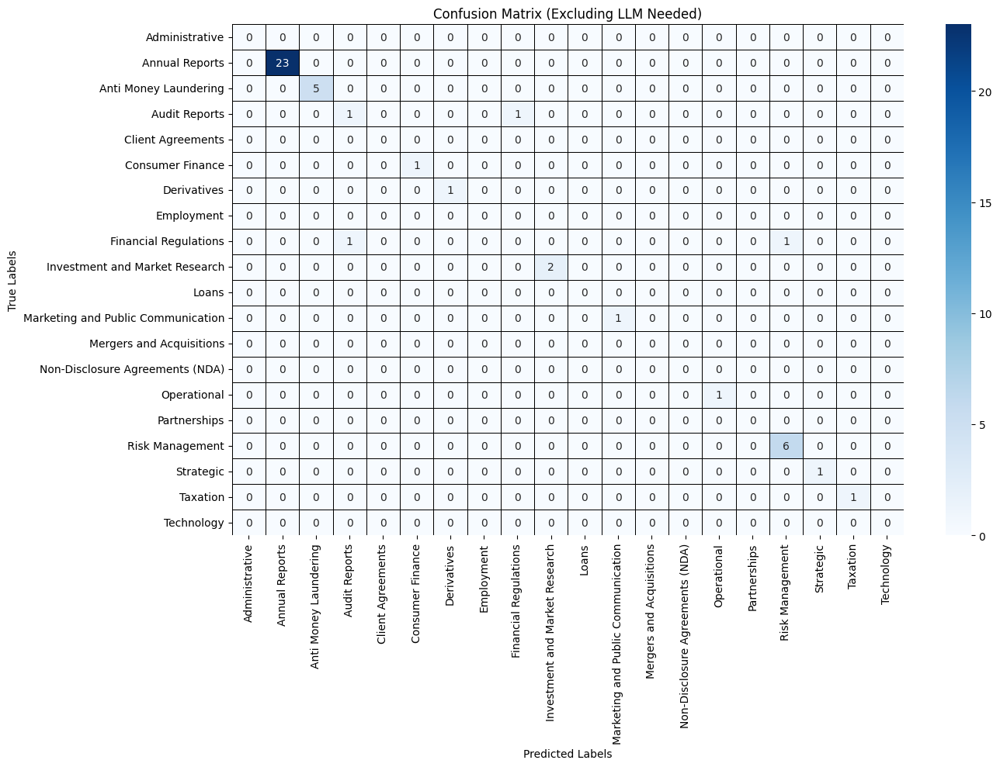

Model Training & Classification Complete!


In [13]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from nltk.tokenize import word_tokenize

# **Step 1: Load & Preprocess Data**
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# **Step 2: Load & Process Documents**
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# **Step 3: Extract TF-IDF Features**
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  
    max_df=0.85,
    min_df=2,  
    ngram_range=(1, 3) 
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# **Step 4: Hyperparameter Tuning with GridSearchCV**
print("Performing Hyperparameter Tuning...")

# Define hyperparameter search space
param_dist = {
    "n_estimators": [100, 300, 500, 1000],
    "max_depth": [5, 10, 20, 30],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [2, 4, 6],  
}
rf_model_cv = RandomForestClassifier(random_state=42, n_jobs=-1)

cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(
    rf_model_cv, param_distributions=param_dist, n_iter=50, cv=cv, 
    scoring="precision_macro", n_jobs=-1, verbose=2, random_state=42
)
# **Fit Random Search on Training Data**
random_search.fit(X_train, y_train)

# **Best Parameters and Performance**
best_params = random_search.best_params_
best_score = random_search.best_score_
print(f"Best Hyperparameters: {best_params}")
print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# **Step 5: Train Final Model with Best Parameters**
print("Training Final Random Forest Model with Best Hyperparameters...")
rf_model = RandomForestClassifier(
    n_estimators=best_params["n_estimators"],
    max_depth=best_params["max_depth"],
    min_samples_split=best_params["min_samples_split"],
    min_samples_leaf=best_params["min_samples_leaf"],
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rf_model.fit(X_train, y_train)  # Train the final model

# **Fix: Ensure Model is Fully Trained Before Calibration**
print("Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")
calibrated_rf.fit(X_train, y_train)

# **Step 6: Classify Test Documents**
print("Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test)  # Get probability scores
confidence_threshold = 0.99  # **Higher Confidence Required**

y_pred_final = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is very high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])

# **Step 7: Store Classification Results**
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# **Step 8: Compute LLM Needed Documents**
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"⚡ {len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# **Step 9: Evaluate Model (Excluding LLM Deferrals)**
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\nClassification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")


# Goal 4: Upgrade Rule Based Classification to Random Forest Model

The current rule-based classification model is based on empirical logic, and is not able to be progressively trained on feedback. The goal is to create a trainable machine learning classifier that will improve accuracy over time by retraining over user feedback. In this section, we have developed the Random Forest Rule Based Classifier while comparing it to the performance of our previous rule-based classifier.

#### Random Forest Rule Based Classifier

Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 361 documents for classification.
Extracting TF-IDF Features...
Performing 10-Fold Cross-Validation...


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=10.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib

Cross-validation precision_macro scores: [0.72777778 0.68701299 0.83216783 0.65909091 0.71794872 0.29513889
 0.48958333 0.41049383 0.68125    0.68      ]
Mean Precision (macro): 0.6180
Training Final Random Forest Model...
Calibrating Model with Isotonic Regression...
Classifying Test Documents...
Classification results saved as classification_results_20250316_154225.csv
27 documents (36.99%) require LLM intervention.
46 documents (63.01%) were classified with high confidence.
Evaluating Model (Excluding LLM Needed)...

Classification Report:
                                    precision    recall  f1-score    support
Annual Reports                       1.000000  1.000000  1.000000  23.000000
Anti Money Laundering                1.000000  1.000000  1.000000   5.000000
Audit Reports                        0.500000  0.500000  0.500000   2.000000
Consumer Finance                     1.000000  1.000000  1.000000   1.000000
Derivatives                          1.000000  1.000000  1.000000 

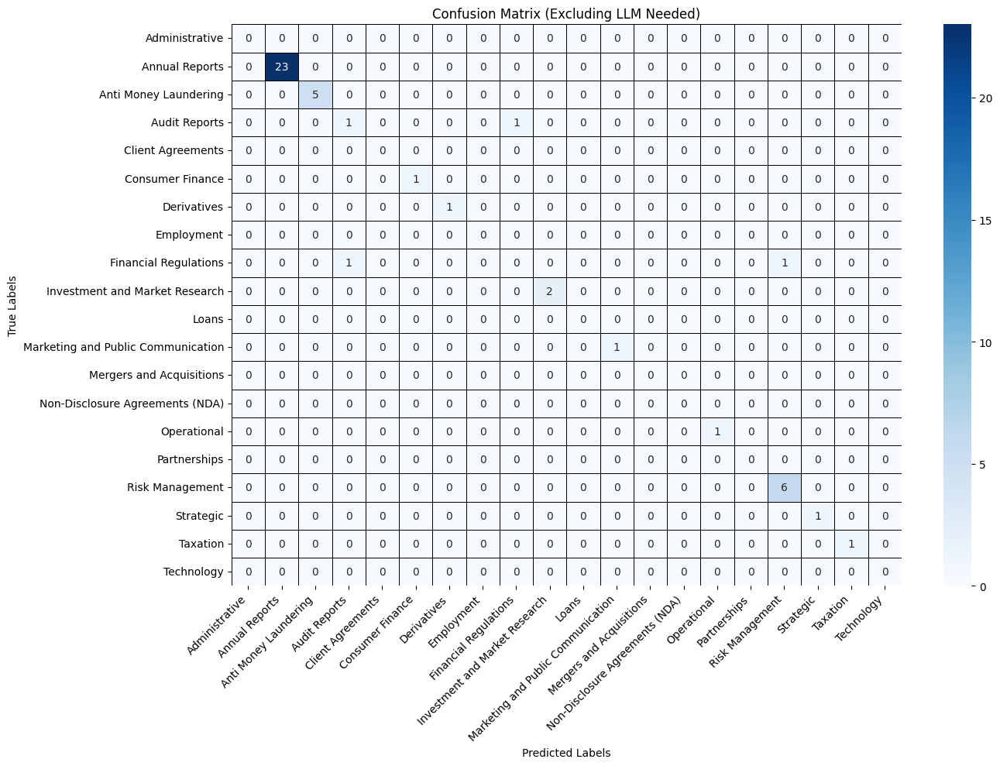

Model Training & Classification Complete!


In [ ]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from nltk.tokenize import word_tokenize

# ** Load & Preprocess Data**
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# ** Load & Process Documents**
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# ** Extract TF-IDF Features**
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  # Reduce requirement for minimum occurrences
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# ** Apply 10-Fold Cross-Validation**
print("Performing 10-Fold Cross-Validation...")
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

rf_model = RandomForestClassifier(
    n_estimators=1000,  # Best Parameter
    max_depth=30,  # Best Parameter
    min_samples_split=2,  # Best Parameter
    min_samples_leaf=2,  # Best Parameter
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

cv_scores = cross_val_score(rf_model, X_train, y_train, cv=cv, scoring="precision_macro", n_jobs=-1)
print(f"Cross-validation precision_macro scores: {cv_scores}")
print(f"Mean Precision (macro): {cv_scores.mean():.4f}")

# **Train the Model After Cross-Validation**
print("Training Final Random Forest Model...")
rf_model.fit(X_train, y_train)

# ** Ensure Model is Fully Trained Before Calibration**
print("Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")
calibrated_rf.fit(X_train, y_train)

# ** Classify Test Documents**
print("Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test)  # Get probability scores
confidence_threshold = 0.95  # **Higher Confidence Required**

y_pred_final = []
confidence_scores = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is very high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
        confidence_scores.append(max_prob)
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])
        confidence_scores.append(max_prob)

# ** Store Classification Results**
timestamp = time.strftime("%Y%m%d_%H%M%S")
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final,
    "Confidence Score": confidence_scores
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# ** Compute LLM Needed Documents**
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"{len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# ** Evaluate Model (Excluding LLM Deferrals)**
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\nClassification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")

## Added in Synthetic Minority Over-Sampling Technique and Recursive Feature Engineering

To address the problems of having imbalanced data across certain topics, we have implemented Synthetic Minority Over Sampling Technique (SMOTE), and Recursive Feature Engineering.

Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 361 documents for classification.
Extracting TF-IDF Features...
Applying combined resampling strategy...
Applying Recursive Feature Elimination (RFE)...
Performing 10-Fold Cross-Validation...
Cross-validation precision_macro scores: [1.    1.    1.    1.    0.995 1.    1.    0.995 1.    1.   ]
Mean Precision (macro): 0.9990
Training Final Random Forest Model...
Calibrating Model with Isotonic Regression...
Model saved as calibrated_rf_model_20250316_194110.pkl
Classifying Test Documents...
Classification results saved as classification_results_20250316_194110.csv
39 documents (53.42%) require LLM intervention.
34 documents (46.58%) were classified with high confidence.
Evaluating Model (Excluding LLM Needed)...

Classification Report:
                                    precision    recall  f1-score    support
Annual Reports                       1.000000  1.000000  1.000000  20.000000
Anti Money Laundering               

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

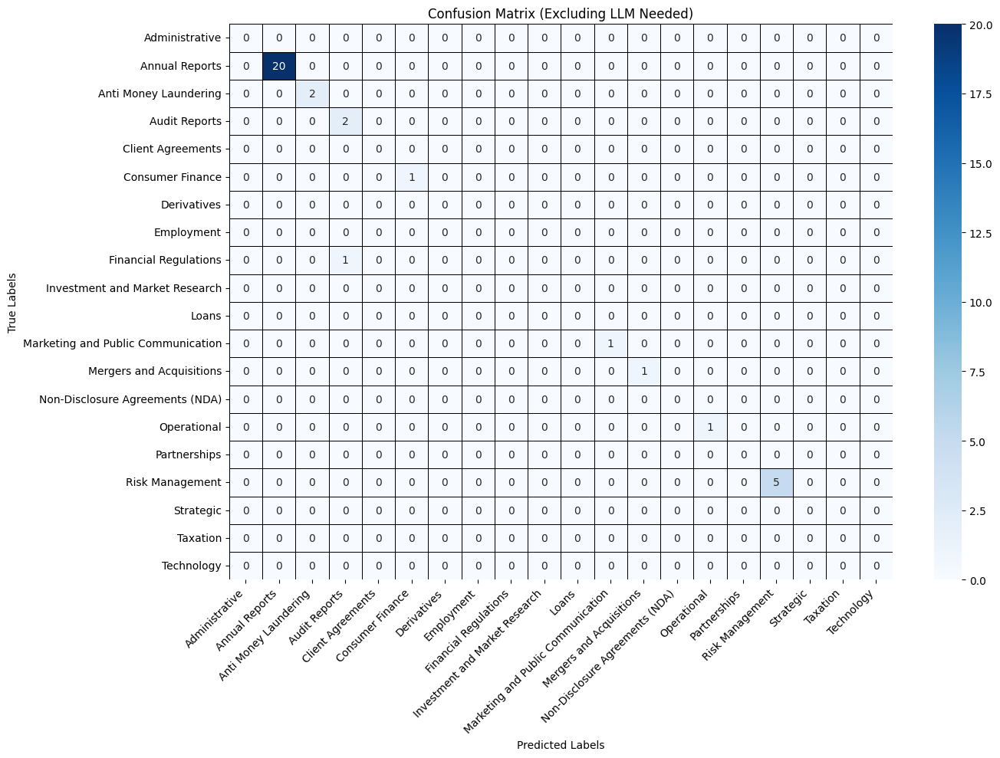

Model Training & Classification Complete!


In [41]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.combine import SMOTEENN
from nltk.tokenize import word_tokenize
import joblib

# ** Load & Preprocess Data**
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# ** Load & Process Documents**
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# ** Extract TF-IDF Features**
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  # Reduce requirement for minimum occurrences
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# ** Apply Combined Resampling Strategy**
print("Applying combined resampling strategy...")
smote = SMOTE(random_state=42, k_neighbors=1)
ros = RandomOverSampler(random_state=42)

# Apply SMOTEENN to combine SMOTE and RandomOverSampler
smote_enn = SMOTEENN(smote=smote, random_state=42)
X_train_resampled, y_train_resampled = smote_enn.fit_resample(X_train, y_train)

# ** Apply Recursive Feature Elimination (RFE)**
print("Applying Recursive Feature Elimination (RFE)...")
rf_model = RandomForestClassifier(
    n_estimators=5000,  # Best Parameter
    max_depth=30,  # Best Parameter
    min_samples_split=2,  # Best Parameter
    min_samples_leaf=2,  # Best Parameter
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rfe = RFE(estimator=rf_model, n_features_to_select=5000, step=100)
X_train_rfe = rfe.fit_transform(X_train_resampled, y_train_resampled)
X_test_rfe = rfe.transform(X_test)

# ** Apply 10-Fold Cross-Validation**
print("Performing 10-Fold Cross-Validation...")
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

cv_scores = cross_val_score(rf_model, X_train_rfe, y_train_resampled, cv=cv, scoring="precision_macro", n_jobs=-1)
print(f"Cross-validation precision_macro scores: {cv_scores}")
print(f"Mean Precision (macro): {cv_scores.mean():.4f}")

# **Train the Model After Cross-Validation**
print("Training Final Random Forest Model...")
rf_model.fit(X_train_rfe, y_train_resampled)

# ** Ensure Model is Fully Trained Before Calibration**
print("Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")
calibrated_rf.fit(X_train_rfe, y_train_resampled)

# Save the calibrated model to a .pkl file
timestamp = time.strftime("%Y%m%d_%H%M%S")
model_filename = f"calibrated_rf_model_{timestamp}.pkl"
joblib.dump(calibrated_rf, model_filename)
print(f"Model saved as {model_filename}")

# ** Classify Test Documents**
print("Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test_rfe)  # Get probability scores
confidence_threshold = 0.95  # **Higher Confidence Required**

y_pred_final = []
confidence_scores = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is very high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
        confidence_scores.append(max_prob)
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])
        confidence_scores.append(max_prob)

# ** Store Classification Results**
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final,
    "Confidence Score": confidence_scores
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# ** Compute LLM Needed Documents**
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"{len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# ** Evaluate Model (Excluding LLM Deferrals)**
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\nClassification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")

### Fixed the Over Sampling Issue

Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 360 documents for classification.
Extracting TF-IDF Features...
Applying combined resampling strategy...
Applying Recursive Feature Elimination (RFE)...
Performing 10-Fold Cross-Validation...
Cross-validation precision_macro scores: [1.         1.         0.99444444 1.         1.         0.99444444
 0.99444444 1.         1.         0.99444444]
Mean Precision (macro): 0.9978
Training Final Random Forest Model...
Calibrating Model with Isotonic Regression...


/Users/ivan/Documents/University/Y4S2/FYP/.venv/lib/python3.10/site-packages/sklearn/calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


Model saved as calibrated_rf_model_20250317_170624.pkl
Classifying Test Documents...
Classification results saved as classification_results_20250317_170624.csv
36 documents (50.00%) require LLM intervention.
36 documents (50.00%) were classified with high confidence.
Evaluating Model (Excluding LLM Needed)...

Classification Report:
                                    precision  recall  f1-score  support
Annual Reports                            1.0     1.0       1.0     19.0
Anti Money Laundering                     1.0     1.0       1.0      3.0
Audit Reports                             1.0     1.0       1.0      3.0
Consumer Finance                          1.0     1.0       1.0      1.0
Marketing and Public Communication        1.0     1.0       1.0      1.0
Mergers and Acquisitions                  1.0     1.0       1.0      2.0
Operational                               1.0     1.0       1.0      1.0
Risk Management                           1.0     1.0       1.0      6.0
accuracy

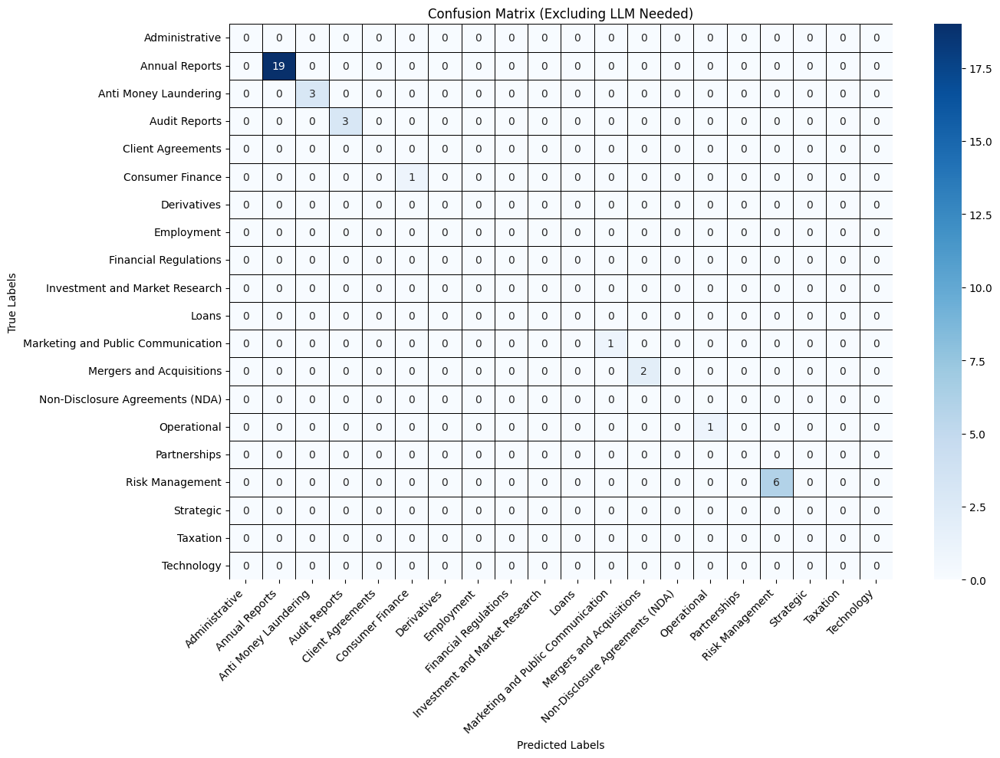

Model Training & Classification Complete!


In [9]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.combine import SMOTEENN
from nltk.tokenize import word_tokenize
import joblib

# ** Load & Preprocess Data**
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v4.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# ** Load & Process Documents**
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# ** Extract TF-IDF Features**
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  # Reduce requirement for minimum occurrences
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# ** Apply Combined Resampling Strategy**
print("Applying combined resampling strategy...")
smote = SMOTE(random_state=42, k_neighbors=1)
ros = RandomOverSampler(random_state=42)

# Apply SMOTEENN to combine SMOTE and RandomOverSampler
smote_enn = SMOTEENN(smote=smote, random_state=42)
X_train_resampled, y_train_resampled = smote_enn.fit_resample(X_train, y_train)

# ** Apply Recursive Feature Elimination (RFE)**
print("Applying Recursive Feature Elimination (RFE)...")
rf_model = RandomForestClassifier(
    n_estimators=5000,  # Best Parameter
    max_depth=30,  # Best Parameter
    min_samples_split=2,  # Best Parameter
    min_samples_leaf=2,  # Best Parameter
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rfe = RFE(estimator=rf_model, n_features_to_select=5000, step=100)
X_train_rfe = rfe.fit_transform(X_train_resampled, y_train_resampled)
X_test_rfe = rfe.transform(X_test)

# ** Apply 10-Fold Cross-Validation**
print("Performing 10-Fold Cross-Validation...")
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

cv_scores = cross_val_score(rf_model, X_train_rfe, y_train_resampled, cv=cv, scoring="precision_macro", n_jobs=-1)
print(f"Cross-validation precision_macro scores: {cv_scores}")
print(f"Mean Precision (macro): {cv_scores.mean():.4f}")

# **Train the Model After Cross-Validation**
print("Training Final Random Forest Model...")
rf_model.fit(X_train_rfe, y_train_resampled)

# ** Ensure Model is Fully Trained Before Calibration**
print("Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")
calibrated_rf.fit(X_train_rfe, y_train_resampled)

# Save the calibrated model to a .pkl file
timestamp = time.strftime("%Y%m%d_%H%M%S")
model_filename = f"calibrated_rf_model_{timestamp}.pkl"
joblib.dump(calibrated_rf, model_filename)
print(f"Model saved as {model_filename}")

# ** Classify Test Documents**
print("Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test_rfe)  # Get probability scores
confidence_threshold = 0.95  # **Higher Confidence Required**

y_pred_final = []
confidence_scores = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is very high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
        confidence_scores.append(max_prob)
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])
        confidence_scores.append(max_prob)

# ** Store Classification Results**
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final,
    "Confidence Score": confidence_scores
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# ** Compute LLM Needed Documents**
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"{len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# ** Evaluate Model (Excluding LLM Deferrals)**
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\nClassification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")

## Tuning Confidence Threshold
Earlier on, our precision was perfect, but this was because the confidence threshold was very strict at 0.95, resulting in half of the documents still needing the LLM for classification. Over here we seek to loosen that threshold so that more documents can be classified with the Random Forest.

Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 359 documents for classification.
Extracting TF-IDF Features...
Applying combined resampling strategy...
Applying Recursive Feature Elimination (RFE)...
Performing 10-Fold Cross-Validation...
Cross-validation precision_macro scores: [0.99       1.         1.         0.99444444 0.99444444 1.
 0.99       0.99444444 0.98444444 0.99444444]
Mean Precision (macro): 0.9942
Training Final Random Forest Model...
Calibrating Model with Isotonic Regression...


/Users/ivan/Documents/University/Y4S2/FYP/.venv/lib/python3.10/site-packages/sklearn/calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


Model saved as calibrated_rf_model_20250318_000348.pkl
Classifying Test Documents...
Classification results saved as classification_results_20250318_000348.csv
22 documents (30.56%) require LLM intervention.
50 documents (69.44%) were classified with high confidence.
Evaluating Model (Excluding LLM Needed)...

Classification Report:
                                    precision    recall  f1-score  support
Annual Reports                       0.954545  1.000000  0.976744     21.0
Anti Money Laundering                0.777778  1.000000  0.875000      7.0
Audit Reports                        1.000000  0.666667  0.800000      3.0
Client Agreements                    0.000000  0.000000  0.000000      1.0
Consumer Finance                     1.000000  1.000000  1.000000      2.0
Derivatives                          1.000000  1.000000  1.000000      1.0
Employment                           1.000000  1.000000  1.000000      1.0
Financial Regulations                0.666667  1.000000  0.800000

/Users/ivan/Documents/University/Y4S2/FYP/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/ivan/Documents/University/Y4S2/FYP/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/ivan/Documents/University/Y4S2/FYP/.venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

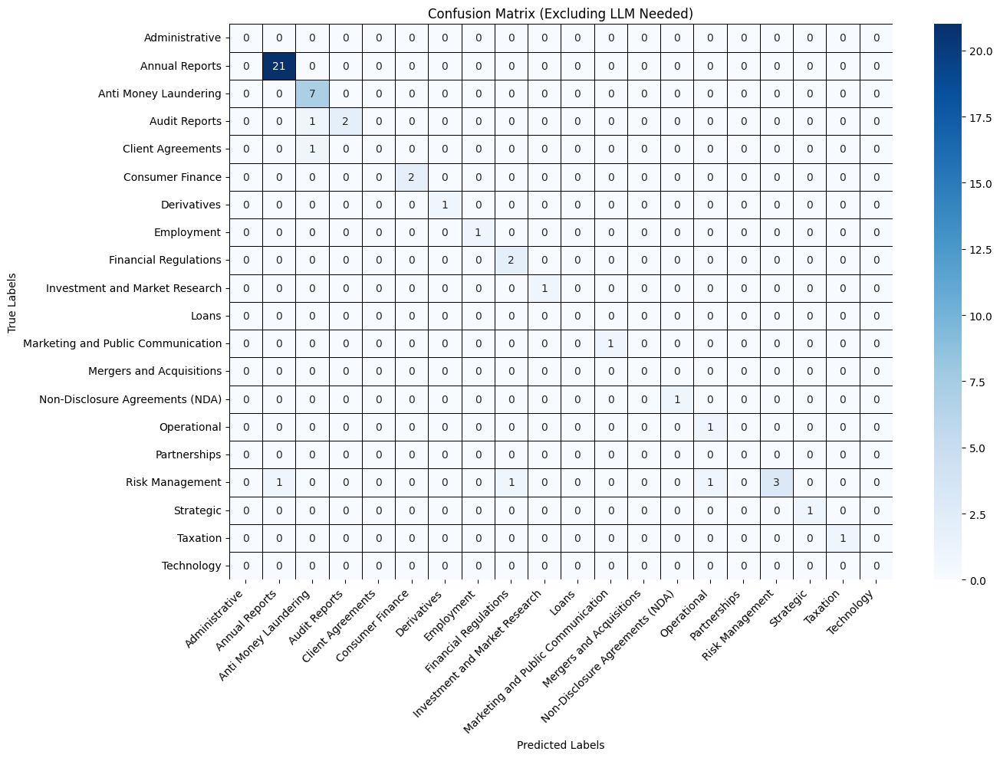

Model Training & Classification Complete!


In [ ]:

import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.combine import SMOTEENN
from nltk.tokenize import word_tokenize
import joblib

# ** Load & Preprocess Data**
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v5.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# ** Load & Process Documents**
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# ** Extract TF-IDF Features**
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,  # Increase features for better context
    max_df=0.85,
    min_df=2,  # Reduce requirement for minimum occurrences
    ngram_range=(1, 3)  # **Use trigrams for better phrase detection**
)

X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# **Split into 80% Train / 20% Test**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    X, y, filenames, test_size=0.2, stratify=y, random_state=42
)

# ** Apply Combined Resampling Strategy**
print("Applying combined resampling strategy...")
smote = SMOTE(random_state=42, k_neighbors=1)
ros = RandomOverSampler(random_state=42)

# Apply SMOTEENN to combine SMOTE and RandomOverSampler
smote_enn = SMOTEENN(smote=smote, random_state=42)
X_train_resampled, y_train_resampled = smote_enn.fit_resample(X_train, y_train)

# ** Apply Recursive Feature Elimination (RFE)**
print("Applying Recursive Feature Elimination (RFE)...")
rf_model = RandomForestClassifier(
    n_estimators=5000,  # Best Parameter
    max_depth=30,  # Best Parameter
    min_samples_split=2,  # Best Parameter
    min_samples_leaf=2,  # Best Parameter
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)

rfe = RFE(estimator=rf_model, n_features_to_select=5000, step=100)
X_train_rfe = rfe.fit_transform(X_train_resampled, y_train_resampled)
X_test_rfe = rfe.transform(X_test)

# ** Apply 10-Fold Cross-Validation**
print("Performing 10-Fold Cross-Validation...")
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

cv_scores = cross_val_score(rf_model, X_train_rfe, y_train_resampled, cv=cv, scoring="precision_macro", n_jobs=-1)
print(f"Cross-validation precision_macro scores: {cv_scores}")
print(f"Mean Precision (macro): {cv_scores.mean():.4f}")

# **Train the Model After Cross-Validation**
print("Training Final Random Forest Model...")
rf_model.fit(X_train_rfe, y_train_resampled)

# ** Ensure Model is Fully Trained Before Calibration**
print("Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")
calibrated_rf.fit(X_train_rfe, y_train_resampled)

# Save the calibrated model to a .pkl file
timestamp = time.strftime("%Y%m%d_%H%M%S")
model_filename = f"calibrated_rf_model_{timestamp}.pkl"
joblib.dump(calibrated_rf, model_filename)
print(f"Model saved as {model_filename}")

# ** Classify Test Documents**
print("Classifying Test Documents...")
y_pred_proba = calibrated_rf.predict_proba(X_test_rfe)  # Get probability scores
confidence_threshold = 0.75  # **Higher Confidence Required**

y_pred_final = []
confidence_scores = []
for i, probs in enumerate(y_pred_proba):
    max_prob = max(probs)
    
    # **Classify only when confidence is very high**
    if max_prob < confidence_threshold:
        y_pred_final.append("LLM Needed")  # Defer to LLM
        confidence_scores.append(max_prob)
    else:
        y_pred_final.append(calibrated_rf.classes_[np.argmax(probs)])
        confidence_scores.append(max_prob)

# ** Store Classification Results**
df_results = pd.DataFrame({
    "Filename": filenames_test,
    "Actual Topic": y_test.values,
    "Predicted Topic": y_pred_final,
    "Confidence Score": confidence_scores
})
df_results.to_csv(f"classification_results_{timestamp}.csv", index=False)
print(f"Classification results saved as classification_results_{timestamp}.csv")

# ** Compute LLM Needed Documents**
llm_needed = df_results[df_results["Predicted Topic"] == "LLM Needed"]
llm_needed_percentage = len(llm_needed) / len(df_results) * 100
no_classified_documents = df_results[df_results["Predicted Topic"] != "LLM Needed"]
classified_percentage = len(no_classified_documents) / len(df_results) * 100

print(f"{len(llm_needed)} documents ({llm_needed_percentage:.2f}%) require LLM intervention.")
print(f"{len(no_classified_documents)} documents ({classified_percentage:.2f}%) were classified with high confidence.")

# ** Evaluate Model (Excluding LLM Deferrals)**
df_filtered = df_results[df_results["Predicted Topic"] != "LLM Needed"]
filtered_actual = df_filtered["Actual Topic"]
filtered_predicted = df_filtered["Predicted Topic"]

print("Evaluating Model (Excluding LLM Needed)...")
report = classification_report(filtered_actual, filtered_predicted, output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv(f"classification_metrics_{timestamp}.csv", index=True)
print("\nClassification Report:")
print(df_report)

# Confusion Matrix
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(filtered_actual, filtered_predicted, labels=calibrated_rf.classes_)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=calibrated_rf.classes_, 
            yticklabels=calibrated_rf.classes_,
            linewidths=0.5, linecolor='black')
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix (Excluding LLM Needed)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(f"confusion_matrix_{timestamp}.png")
plt.show()

print("Model Training & Classification Complete!")

In [19]:
import joblib
joblib.dump(tfidf_vectorizer, "tfidf_vectorizer.pkl")
joblib.dump(calibrated_rf, "rf_model.pkl")

['rf_model.pkl']

#### Initial Rule Based Classifier

Loaded 20 topics from extracted words.
Performing 10-Fold Cross-Validation...


/Users/ivan/Documents/University/Y4S2/FYP/.venv/lib/python3.10/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=10.
  warnings.warn(


Cross-validation precision_macro scores: [0.5517241379310345, 0.4827586206896552, 0.3448275862068966, 0.4827586206896552, 0.41379310344827586, 0.4827586206896552, 0.3793103448275862, 0.42857142857142855, 0.5, 0.42857142857142855]
Mean Precision (macro): 0.4495
41 documents (56.94%) require LLM intervention.
31 documents were classified.

Classification Report for Rule-Based:
                                precision    recall  f1-score    support
Administrative                   1.000000  1.000000  1.000000   1.000000
Annual Reports                   1.000000  1.000000  1.000000  13.000000
Anti Money Laundering            1.000000  1.000000  1.000000   2.000000
Audit Reports                    1.000000  1.000000  1.000000   2.000000
Consumer Finance                 1.000000  1.000000  1.000000   2.000000
Financial Regulations            0.400000  1.000000  0.571429   2.000000
Investment and Market Research   1.000000  1.000000  1.000000   1.000000
Loans                            1.000

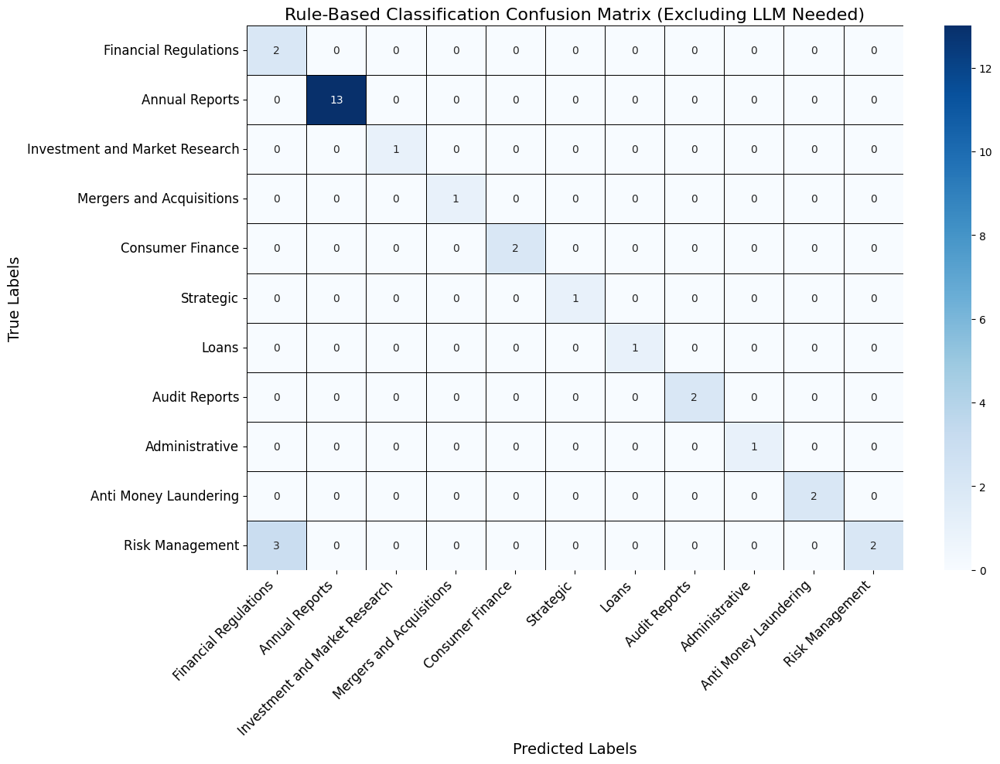

In [18]:
import os
import pandas as pd
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
import math
from collections import defaultdict
from sklearn.metrics import classification_report, confusion_matrix
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split, StratifiedKFold

# Load NLTK Lemmatizer
lemmatizer = WordNetLemmatizer()

# -------------------------------------
# **Step 1: Load Extracted TF-IDF + Bigrams**
# -------------------------------------
top_keywords_per_topic = {}
main_topics = set()

# Load refined TF-IDF bigrams file
df = pd.read_csv("refined_tfidf_bigrams_v5.csv")  

for index, row in df.iterrows():
    topic_name = row.iloc[0].strip()
    keywords = [row[col] for col in df.columns[1:] if pd.notna(row[col])]
    
    if keywords:
        top_keywords_per_topic[topic_name] = keywords[:150]  
        main_topics.add(topic_name.split("/")[0])  

print(f"Loaded {len(top_keywords_per_topic)} topics from extracted words.")

# -------------------------------------
# **Step 2: Tokenization & Preprocessing**
# -------------------------------------
vectorizer = CountVectorizer(
    stop_words="english",
    lowercase=True,
    token_pattern=r"(?u)\b\w+\b",  
    ngram_range=(1, 2)  
)

def fast_tokenize(text):
    """Tokenizes text using CountVectorizer to include both words & bigrams."""
    return set(vectorizer.build_analyzer()(text))

# -------------------------------------
# **Step 3: Adjusted Rule-Based Classification**
# -------------------------------------
low_precision_categories = {}  
STRICT_CATEGORIES = {}
CONFIDENCE_MARGIN = 1.0  

def apply_length_penalty(score, doc_length):
    """Applies a logarithmic penalty for long documents to prevent inflated confidence."""
    return score / (1 + math.log(1 + doc_length)/70)

def classify_document(text):
    """Classifies a document using an enhanced rule-based system with stricter confidence filtering."""
    
    doc_words = fast_tokenize(text)  
    doc_length = len(doc_words)

    #  If document is too short, defer to LLM
    if doc_length < 100:
        return "LLM Needed", 0.0  

    best_main_match, best_main_score = None, 0
    second_best_score = 0  

    #  Identify the **Main Topic**
    for topic in main_topics:
        topic_keywords = set(word for subtopic in top_keywords_per_topic if subtopic.startswith(topic) for word in top_keywords_per_topic[subtopic])
        matched_words = doc_words.intersection(topic_keywords)

        weighted_score = sum(1.0 * (0.85 ** idx) for idx, word in enumerate(matched_words))
        max_possible_score = sum(1.0 * (0.85 ** idx) for idx in range(len(topic_keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0
        
        #  Apply length penalty
        adjusted_score = apply_length_penalty(normalized_score, doc_length)

        if adjusted_score > best_main_score and len(matched_words) >= 30:
            second_best_score = best_main_score  
            best_main_score = adjusted_score
            best_main_match = topic

    #  Ensure Strict Categories have higher scores than second-best topic
    if best_main_match in STRICT_CATEGORIES and best_main_score < second_best_score * CONFIDENCE_MARGIN:
        return "LLM Needed", best_main_score

    #  If no confident main topic is found, defer to LLM
    if best_main_score < 0.9 or best_main_match in low_precision_categories:
        return "LLM Needed", best_main_score

    return best_main_match, best_main_score

# -------------------------------------
# **Step 4: Load & Process Documents (Ensure Same 20% Test Set)**
# -------------------------------------
actual_topics, predicted_topics, document_confidences, document_filenames = [], [], [], []
llm_needed_actual, llm_needed_filenames, llm_needed_confidences = [], [], []

data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()  
            
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()

                    documents.append(content)
                    labels.append(sub_topic.split("/")[-1])
                    filenames.append(file)

# Convert to DataFrame
df_all = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})

# **Ensure we split the dataset the same way as the Random Forest**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    df_all["Text"], df_all["Label"], df_all["Filename"], test_size=0.2, stratify=df_all["Label"], random_state=42
)

# -------------------------------------
# **Step 5: Implement 10-Fold Cross-Validation**
# -------------------------------------
print("Performing 10-Fold Cross-Validation...")
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

cv_scores = []
for train_idx, val_idx in cv.split(X_train, y_train):
    X_cv_train, X_cv_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    correct = 0
    total = len(y_cv_val)

    for i in range(len(X_cv_val)):
        predicted_category, _ = classify_document(X_cv_val.iloc[i])
        if predicted_category == y_cv_val.iloc[i]:
            correct += 1

    precision_macro = correct / total if total > 0 else 0
    cv_scores.append(precision_macro)

print(f"Cross-validation precision_macro scores: {cv_scores}")
print(f"Mean Precision (macro): {np.mean(cv_scores):.4f}")

# -------------------------------------
# **Step 6: Apply Rule-Based Classification on Test Set**
# -------------------------------------
for i in range(len(filenames_test)):
    doc_text = X_test.iloc[i]
    filename = filenames_test.iloc[i]
    actual_topic = y_test.iloc[i]

    predicted_category, confidence = classify_document(doc_text)

    if predicted_category == "LLM Needed":
        llm_needed_actual.append(actual_topic)
        llm_needed_filenames.append(filename)
        llm_needed_confidences.append(confidence)
    else:
        actual_topics.append(actual_topic)
        predicted_topics.append(predicted_category)
        document_confidences.append(confidence)
        document_filenames.append(filename)

print(f"{len(llm_needed_actual)} documents ({len(llm_needed_actual) / (len(actual_topics) + len(llm_needed_actual)) * 100:.2f}%) require LLM intervention.")
print(f"{len(actual_topics)} documents were classified.")


# -------------------------------------
# **Step 7: Save Classification Report & Confusion Matrix**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")  
df_results = pd.DataFrame({
    "Filename": document_filenames,
    "Actual Topic": actual_topics,
    "Predicted Topic": predicted_topics,
    "Confidence": document_confidences
})
df_results.to_csv(f"rule_based_classification_results_{timestamp}.csv", index=False)

print("\nClassification Report for Rule-Based:")
report_df = pd.DataFrame(classification_report(actual_topics, predicted_topics, output_dict=True)).transpose()
report_df.to_csv(f"rule_based_classification_report_{timestamp}.csv", index=True)
print(report_df)


# Confusion Matrix for Rule-Based Classification
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(actual_topics, predicted_topics, labels=list(set(actual_topics)))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(set(actual_topics)), 
            yticklabels=list(set(actual_topics)),
            linewidths=0.5, linecolor='black')

plt.xlabel("Predicted Labels", fontsize=14)
plt.ylabel("True Labels", fontsize=14)
plt.title("Rule-Based Classification Confusion Matrix (Excluding LLM Needed)", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)  
plt.yticks(rotation=0, fontsize=12)  
plt.tight_layout()
print("Rule-Based Classification Complete!")

Loaded 20 topics from extracted words.
Performing 10-Fold Cross-Validation...


/Users/ivan/Documents/University/Y4S2/FYP/.venv/lib/python3.10/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=10.
  warnings.warn(


Cross-validation precision_macro scores: [0.6896551724137931, 0.7241379310344828, 0.5172413793103449, 0.5862068965517241, 0.6206896551724138, 0.5172413793103449, 0.6206896551724138, 0.5, 0.6071428571428571, 0.5714285714285714]
Mean Precision (macro): 0.5954
18 documents (25.00%) require LLM intervention.
54 documents were classified.

Classification Report for Rule-Based:
                                precision    recall  f1-score    support
Administrative                   1.000000  1.000000  1.000000   1.000000
Annual Reports                   1.000000  0.857143  0.923077  21.000000
Anti Money Laundering            1.000000  0.857143  0.923077   7.000000
Audit Reports                    0.666667  0.666667  0.666667   3.000000
Client Agreements                1.000000  1.000000  1.000000   1.000000
Consumer Finance                 1.000000  1.000000  1.000000   2.000000
Derivatives                      1.000000  1.000000  1.000000   1.000000
Financial Regulations            0.285714

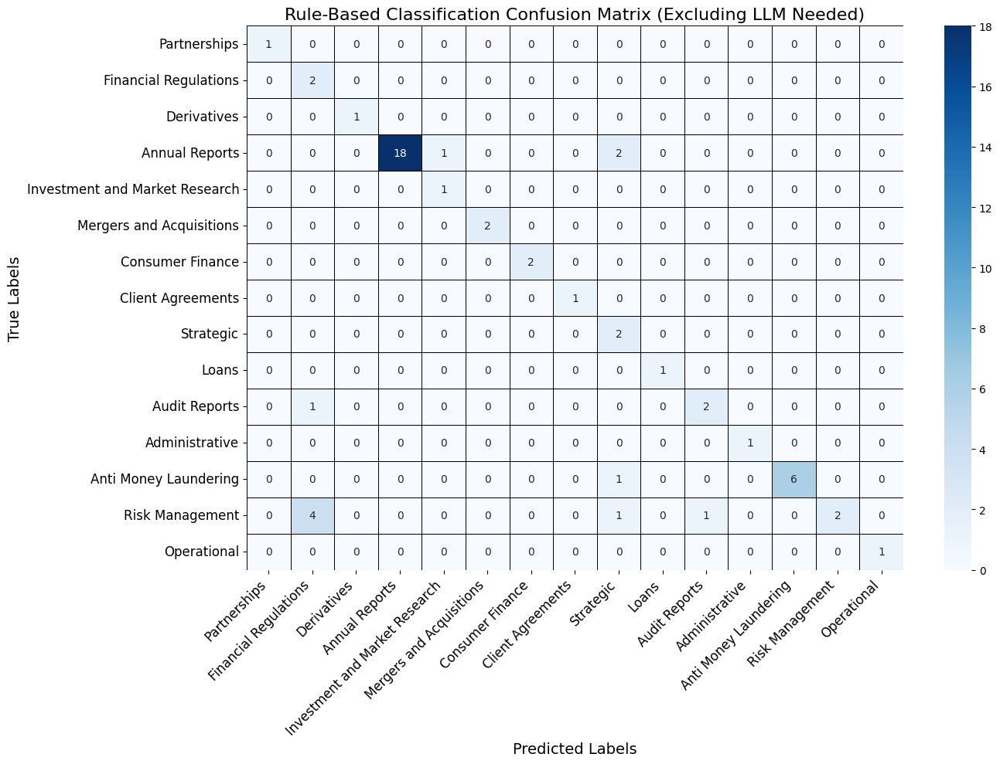

In [23]:
import os
import pandas as pd
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
import math
from collections import defaultdict
from sklearn.metrics import classification_report, confusion_matrix
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split, StratifiedKFold

# Load NLTK Lemmatizer
lemmatizer = WordNetLemmatizer()

# -------------------------------------
# **Step 1: Load Extracted TF-IDF + Bigrams**
# -------------------------------------
top_keywords_per_topic = {}
main_topics = set()

# Load refined TF-IDF bigrams file
df = pd.read_csv("refined_tfidf_bigrams_v5.csv")  

for index, row in df.iterrows():
    topic_name = row.iloc[0].strip()
    keywords = [row[col] for col in df.columns[1:] if pd.notna(row[col])]
    
    if keywords:
        top_keywords_per_topic[topic_name] = keywords[:150]  
        main_topics.add(topic_name.split("/")[0])  

print(f"Loaded {len(top_keywords_per_topic)} topics from extracted words.")

# -------------------------------------
# **Step 2: Tokenization & Preprocessing**
# -------------------------------------
vectorizer = CountVectorizer(
    stop_words="english",
    lowercase=True,
    token_pattern=r"(?u)\b\w+\b",  
    ngram_range=(1, 2)  
)

def fast_tokenize(text):
    """Tokenizes text using CountVectorizer to include both words & bigrams."""
    return set(vectorizer.build_analyzer()(text))

# -------------------------------------
# **Step 3: Adjusted Rule-Based Classification**
# -------------------------------------
low_precision_categories = {}  
STRICT_CATEGORIES = {}
CONFIDENCE_MARGIN = 1.0  

def apply_length_penalty(score, doc_length):
    """Applies a logarithmic penalty for long documents to prevent inflated confidence."""
    return score / (1 + math.log(1 + doc_length)/70)

def classify_document(text):
    """Classifies a document using an enhanced rule-based system with stricter confidence filtering."""
    
    doc_words = fast_tokenize(text)  
    doc_length = len(doc_words)

    #  If document is too short, defer to LLM
    if doc_length < 100:
        return "LLM Needed", 0.0  

    best_main_match, best_main_score = None, 0
    second_best_score = 0  

    #  Identify the **Main Topic**
    for topic in main_topics:
        topic_keywords = set(word for subtopic in top_keywords_per_topic if subtopic.startswith(topic) for word in top_keywords_per_topic[subtopic])
        matched_words = doc_words.intersection(topic_keywords)

        weighted_score = sum(1.0 * (0.85 ** idx) for idx, word in enumerate(matched_words))
        max_possible_score = sum(1.0 * (0.85 ** idx) for idx in range(len(topic_keywords)))
        normalized_score = weighted_score / max_possible_score if max_possible_score > 0 else 0
        
        #  Apply length penalty
        adjusted_score = apply_length_penalty(normalized_score, doc_length)

        if adjusted_score > best_main_score and len(matched_words) >= 30:
            second_best_score = best_main_score  
            best_main_score = adjusted_score
            best_main_match = topic

    #  Ensure Strict Categories have higher scores than second-best topic
    if best_main_match in STRICT_CATEGORIES and best_main_score < second_best_score * CONFIDENCE_MARGIN:
        return "LLM Needed", best_main_score

    #  If no confident main topic is found, defer to LLM
    if best_main_score < 0.75 or best_main_match in low_precision_categories:
        return "LLM Needed", best_main_score

    return best_main_match, best_main_score

# -------------------------------------
# **Step 4: Load & Process Documents (Ensure Same 20% Test Set)**
# -------------------------------------
actual_topics, predicted_topics, document_confidences, document_filenames = [], [], [], []
llm_needed_actual, llm_needed_filenames, llm_needed_confidences = [], [], []

data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()  
            
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()

                    documents.append(content)
                    labels.append(sub_topic.split("/")[-1])
                    filenames.append(file)

# Convert to DataFrame
df_all = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})

# **Ensure we split the dataset the same way as the Random Forest**
X_train, X_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    df_all["Text"], df_all["Label"], df_all["Filename"], test_size=0.2, stratify=df_all["Label"], random_state=42
)

# -------------------------------------
# **Step 5: Implement 10-Fold Cross-Validation**
# -------------------------------------
print("Performing 10-Fold Cross-Validation...")
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

cv_scores = []
for train_idx, val_idx in cv.split(X_train, y_train):
    X_cv_train, X_cv_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    correct = 0
    total = len(y_cv_val)

    for i in range(len(X_cv_val)):
        predicted_category, _ = classify_document(X_cv_val.iloc[i])
        if predicted_category == y_cv_val.iloc[i]:
            correct += 1

    precision_macro = correct / total if total > 0 else 0
    cv_scores.append(precision_macro)

print(f"Cross-validation precision_macro scores: {cv_scores}")
print(f"Mean Precision (macro): {np.mean(cv_scores):.4f}")

# -------------------------------------
# **Step 6: Apply Rule-Based Classification on Test Set**
# -------------------------------------
for i in range(len(filenames_test)):
    doc_text = X_test.iloc[i]
    filename = filenames_test.iloc[i]
    actual_topic = y_test.iloc[i]

    predicted_category, confidence = classify_document(doc_text)

    if predicted_category == "LLM Needed":
        llm_needed_actual.append(actual_topic)
        llm_needed_filenames.append(filename)
        llm_needed_confidences.append(confidence)
    else:
        actual_topics.append(actual_topic)
        predicted_topics.append(predicted_category)
        document_confidences.append(confidence)
        document_filenames.append(filename)

print(f"{len(llm_needed_actual)} documents ({len(llm_needed_actual) / (len(actual_topics) + len(llm_needed_actual)) * 100:.2f}%) require LLM intervention.")
print(f"{len(actual_topics)} documents were classified.")


# -------------------------------------
# **Step 7: Save Classification Report & Confusion Matrix**
# -------------------------------------
timestamp = time.strftime("%Y%m%d_%H%M%S")  
df_results = pd.DataFrame({
    "Filename": document_filenames,
    "Actual Topic": actual_topics,
    "Predicted Topic": predicted_topics,
    "Confidence": document_confidences
})
df_results.to_csv(f"rule_based_classification_results_{timestamp}.csv", index=False)

print("\nClassification Report for Rule-Based:")
report_df = pd.DataFrame(classification_report(actual_topics, predicted_topics, output_dict=True)).transpose()
report_df.to_csv(f"rule_based_classification_report_{timestamp}.csv", index=True)
print(report_df)


# Confusion Matrix for Rule-Based Classification
plt.figure(figsize=(14, 10))
conf_matrix = confusion_matrix(actual_topics, predicted_topics, labels=list(set(actual_topics)))

sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=list(set(actual_topics)), 
            yticklabels=list(set(actual_topics)),
            linewidths=0.5, linecolor='black')

plt.xlabel("Predicted Labels", fontsize=14)
plt.ylabel("True Labels", fontsize=14)
plt.title("Rule-Based Classification Confusion Matrix (Excluding LLM Needed)", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)  
plt.yticks(rotation=0, fontsize=12)  
plt.tight_layout()
print("Rule-Based Classification Complete!")

## Final Random Forest Model

In [25]:
import os
import pandas as pd
import numpy as np
import time
import seaborn as sns
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.feature_selection import RFE
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.combine import SMOTEENN
from nltk.tokenize import word_tokenize
import joblib

# Load & Preprocess Data
print("Loading Refined TF-IDF Bigrams...")
tfidf_df = pd.read_csv("refined_tfidf_bigrams_v5.csv")  
topics = tfidf_df.index.tolist()

# Tokenization function
def tokenize_text(text):
    """Tokenizes text into words and bigrams."""
    words = word_tokenize(text.lower())
    bigrams = [" ".join(pair) for pair in zip(words[:-1], words[1:])]
    return set(words + bigrams)

# Load & Process Documents
print("Processing Documents...")
data_dir = "Extracted_Sample_Data"
documents, labels, filenames = [], [], []

for main_topic in os.listdir(data_dir):
    main_topic_path = os.path.join(data_dir, main_topic)
    if os.path.isdir(main_topic_path):  
        for root, _, files in os.walk(main_topic_path):  
            sub_topic = root.replace(data_dir + "/", "").strip()
            sub_topic_cleaned = sub_topic.split("/")[-1]  
            for file in files:
                if file.endswith(".txt"):
                    file_path = os.path.join(root, file)
                    with open(file_path, "r", encoding="utf-8") as f:
                        content = f.read()
                    documents.append(content)
                    labels.append(sub_topic_cleaned)
                    filenames.append(file)

# Convert to DataFrame
df = pd.DataFrame({"Filename": filenames, "Text": documents, "Label": labels})
print(f"Loaded {len(df)} documents for classification.")

# Extract TF-IDF Features
print("Extracting TF-IDF Features...")
tfidf_vectorizer = TfidfVectorizer(
    stop_words="english",
    max_features=5000,
    max_df=0.85,
    min_df=2,
    ngram_range=(1, 3)
)
X = tfidf_vectorizer.fit_transform(df["Text"])
y = df["Label"]

# Apply Combined Resampling Strategy
print("Applying combined resampling strategy...")
smote = SMOTE(random_state=42, k_neighbors=1)
smote_enn = SMOTEENN(smote=smote, random_state=42)
X_resampled, y_resampled = smote_enn.fit_resample(X, y)

# Apply Recursive Feature Elimination (RFE)
print("Applying Recursive Feature Elimination (RFE)...")
rf_model = RandomForestClassifier(
    n_estimators=5000,
    max_depth=30,
    min_samples_split=2,
    min_samples_leaf=2,
    class_weight="balanced",
    random_state=42,
    n_jobs=-1
)
rfe = RFE(estimator=rf_model, n_features_to_select=5000, step=100)
X_resampled_rfe = rfe.fit_transform(X_resampled, y_resampled)

# Train the Final Random Forest Model
print("Training Final Random Forest Model...")
rf_model.fit(X_resampled_rfe, y_resampled)

# Calibrate Model with Isotonic Regression
print("Calibrating Model with Isotonic Regression...")
calibrated_rf = CalibratedClassifierCV(rf_model, method="isotonic", cv="prefit")
calibrated_rf.fit(X_resampled_rfe, y_resampled)

# Save the calibrated model
timestamp = time.strftime("%Y%m%d_%H%M%S")
model_filename = f"calibrated_rf_model_{timestamp}.pkl"
joblib.dump(calibrated_rf, model_filename)
print(f"Model saved as {model_filename}")

# Model Evaluation would typically require a separate test set; consider using cross-validation or other forms of validation in future or continuous iterations.
print("Model Training Complete!")


Loading Refined TF-IDF Bigrams...
Processing Documents...
Loaded 359 documents for classification.
Extracting TF-IDF Features...
Applying combined resampling strategy...
Applying Recursive Feature Elimination (RFE)...
Training Final Random Forest Model...
Calibrating Model with Isotonic Regression...


/Users/ivan/Documents/University/Y4S2/FYP/.venv/lib/python3.10/site-packages/sklearn/calibration.py:333: UserWarning: The `cv='prefit'` option is deprecated in 1.6 and will be removed in 1.8. You can use CalibratedClassifierCV(FrozenEstimator(estimator)) instead.
  warnings.warn(


Model saved as calibrated_rf_model_20250324_232526.pkl
Model Training Complete!


In [26]:
import joblib
joblib.dump(tfidf_vectorizer, "final_tfidf_vectorizer.pkl")
# joblib.dump(calibrated_rf, "final_rf_model.pkl")

['final_tfidf_vectorizer.pkl']